# Case Study One

In [1]:
# Authors: 
# Elton Pan, Antonio del Rio Chanona

import pylab
import pandas as pd
import scipy.integrate as scp
import numpy as np
import seaborn as sns
from pylab import *
import csv
import os
import sys
import copy
import torch
from sklearn.preprocessing import StandardScaler
import collections
import numpy.random as rnd
from scipy.spatial.distance import cdist
import sobol_seq
from scipy.optimize import minimize
eps  = np.finfo(float).eps
import random
import time
import pickle
import imageio
matplotlib.rcParams['font.sans-serif'] = "Helvetica"
matplotlib.rcParams['font.family'] = "Helvetica"
matplotlib.rcParams['font.size'] = 20
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from IPython.display import Audio # Import sound alert dependencies
from IPython import display # For live plots
from mpl_toolkits import mplot3d
from ipywidgets import interact
def Done():
    display(Audio(url='https://sound.peal.io/ps/audios/000/000/537/original/woo_vu_luvub_dub_dub.wav', autoplay=True))
# Insert whatever audio file you want above

############ Defining Environment ##############

class Model_env: 
    
    # --- initializing model --- #
    def __init__(self, parameters, tf):
        
        # Object variable definitions
        self.parameters       = parameters
        self.tf = tf  
        
    # --- dynamic model definition --- #    
    # model takes state and action of previous time step and integrates -- definition of ODE system at time, t
    def model(self, t, state):
        # internal definitions
        params = self.parameters
        u_L  = self.u0[0] # Control for light intensity
        u_Fn = self.u0[1] # Control for nitrate input
                
        # state vector # Added Cq as the third state element
        Cx  = state[0]
        Cn  = state[1]
        Cq  = state[2]
        
        # parameters # Updated with new params
        u_m = params['u_m']; k_s = params['k_s'];
        k_i = params['k_i']; K_N = params['K_N'];
        u_d = params['u_d']; Y_nx = params['Y_nx'];
        k_m = params['k_m']; k_sq = params['k_sq'];
        k_iq = params['k_iq']; k_d = params['k_d'];
        K_Np = params['K_Np'];
        
        # algebraic equations
        
        # variable rate equations
        dev_Cx = (u_m * u_L * Cx * Cn/(Cn+K_N))/(u_L+k_s+u_L**2/k_i) - u_d*Cx
        dev_Cn = (- Y_nx*u_m* u_L * Cx * Cn/(Cn+K_N))/(u_L+k_s+u_L**2/k_i) + u_Fn
        dev_Cq = (k_m * u_L * Cx)/(u_L+k_sq+u_L**2/k_iq) - k_d * Cq/(Cn+K_Np)

        return np.array([dev_Cx, dev_Cn, dev_Cq],dtype='float64') # Added Cq

    def simulation(self, x0, controls):
        # internal definitions
        model, tf     = self.model, self.tf
        self.controls = controls
        
        # initialize simulation
        current_state = x0
        
        # simulation #ONLY ONE STEP unlike the previous code shown above
        self.u0   = controls
        ode       = scp.ode(model)                      # define ode
        ode.set_integrator('lsoda', nsteps=3000)        # define integrator
        ode.set_initial_value(current_state, tf)         # set initial value
        current_state = list(ode.integrate(ode.t + tf)) # integrate system
        xt            = current_state                   # add current state Note: here we can add randomnes as: + RandomNormal noise
        
        return xt

    def MDP_simulation(self, x0, controls): #simulate ONLY ONE STEP
        xt          = self.simulation(x0, controls) #simulate
####         xt_discrete = self.discrete_env(xt) # make output state discrete
####         return xt_discrete
        return xt #remove this if you want to discretize

    def reward(self, state):
        reward = 100*state[-1][0] - state[-1][1]              # objective function 1
        return reward

p = {'u_m' : 0.0923*0.62, 'k_s' : 178.85, 'k_i' : 447.12, 'K_N' : 393.10,
'u_d' : 0.001, 'Y_nx' : 504.49, 'k_m' : 2.544*0.62*1e-4,  'k_sq' : 23.51,
'k_iq' : 800.0, 'k_d' : 0.281, 'K_Np' : 16.89}

tf       = 240./12. # assuming 12 steps, we divide the whole horizon (240 h) over 12 for one step


# Creating the model
MDP_BioEnv = Model_env(p, tf)


def transition(old_state, action):
    '''Gives the new state given the current state and action
       Arguments
       old state : [Cx, Cn, Cq, t] 
       action    : [u_L, u_Fn]
    
       Output 
       new state : [Cx, Cn, Cq, t]
       reward    : [Cq_Terminal]
       '''
    # If terminal state is reached (episode in final step)
    if abs(old_state[3] - 240.) < 0.1:
        reward    = old_state[2]           # Reward at terminal state is concentration of q
        new_state = MDP_BioEnv.MDP_simulation(old_state[:-1], action)  # Take action and evolve using model
        new_state.append(old_state[-1] + tf)                           # Increment time by tf (20 h)
    
    # Else if past terminal state (episode has ended)
    elif (old_state[3] > 240.):
        reward    = 0         # Zero reward given
        new_state = old_state # Loop back to itself (no evolution)
    
    # Else non-terminal state (episode has not ended)
    else:
        reward    = 0         # Zero reward given
        new_state = MDP_BioEnv.MDP_simulation(old_state[:-1], action) # Take action and evolve using model
        new_state.append(old_state[-1] + tf)                          # Increment time by tf (20 h)

    return new_state, reward

def generate_random_episode(initial_state): 
    '''Generates an episode [
                             [ [Cx, Cn, Cq, t], [u_L, u_Fn], reward ]
                             ...
                             ...
                             ]
    with random policy with
    an initial state
    '''
    # Initial state
    state  = initial_state # initial state
    episode = []
    
    # Simulate 13 steps (not 12 because we want to exit the terminal step)
    for step in range(13):
        old_state = state                  # Save old state
        u_L  = np.random.uniform(120, 400) # Pick random u_L
        u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
        action = [u_L, u_Fn]
        
        state, reward = transition(state, action)
        episode       += [[old_state, action, reward]]
    return episode
# generate_random_episode(initial_state = [1.0,150.0,0,0]) # Test generate_random_episode


def extract_data_from_episode(episode, discount_factor = 0.9):
    '''
    Argument: An episode generated using the generate_random_episode() function
    
    Output: 13 Datapoints in the form of [[Cx, Cn, Cq, t, u_L, u_Fn], Q] for training 
            the Q-network
    '''
    Q_data = []
    for step in reversed(range(13)): # Each episode has 13 entries, and Q table is updated in reversed order
        state, action, reward = episode[step] 

        if step == 12: # If terminal state i.e. t = 240
            G = reward # Return = reward at terminal state
        else:
            G = reward + discount_factor * G  # Return = reward + discounted return of the PREVIOUS state
        
        u_L, u_Fn = action     #  Unpack controls
        state.append(u_L)       # Append u_L
        state.append(u_Fn)      # Append u_Fn
        data_point = [state, G] # Construct datapoint where state is index 0, and return is index 1
        Q_data += [data_point]
    return Q_data
# episode = generate_random_episode(initial_state = [1.0,150.0,0,0])
# extract_data_from_episode(episode, discount_factor = 0.9) # Test function

def standardize_state_Q(state): # For Q-network
    '''Argument: Un-standardized [Cx, Cn, Cq, t, u_L, u_Fn]
    Output: Standardized [Cx, Cn, Cq, t, u_L, u_Fn] using previously determined mean and std values''' 
    for feature in range(len(x_mean_Q)): 
        state[feature] = (state[feature] - x_mean_Q[feature])/x_std_Q[feature]
    return state

def unstandardize_state_Q(state): # For Q-network
    '''Argument: Standardized [Cx, Cn, Cq, t, u_L, u_Fn]
    Output: Un-standardized [Cx, Cn, Cq, t, u_L, u_Fn] using previously determined mean and std values''' 
    for feature in range(len(x_mean_Q)): 
        state[feature] = (state[feature] * x_std_Q[feature]) + x_mean_Q[feature]
    return state

def standardize_state_C(state): # For C-network
    '''Argument: Un-standardized [Cx, Cn, Cq, t_f - t, u_L, u_Fn]
    Output: Standardized [Cx, Cn, Cq, t_f - t, u_L, u_Fn] using previously determined mean and std values''' 
    for feature in range(len(x_mean_C)): 
        state[feature] = (state[feature] - x_mean_C[feature])/x_std_C[feature]
    return state

def unstandardize_state_C(state): # For C-network
    '''Argument: Standardized [Cx, Cn, Cq, t_f - t, u_L, u_Fn]
    Output: Un-standardized [Cx, Cn, Cq, t_f - t, u_L, u_Fn] using previously determined mean and std values''' 
    for feature in range(len(x_mean_C)): 
        state[feature] = (state[feature] * x_std_C[feature]) + x_mean_C[feature]
    return state

def take_random_action(epsilon): # Epsilon represents the probability of taking a random action
    if np.random.uniform(0,1) < epsilon:
        return True
    else:
        return False
    

def max_action(state):
    '''Argument: State   [Cx, Cn, Cq, t]
       Output  : Control [u_L, u_Fn] that maximizes Q_value using stochastic optimization'''
    
    # ROUND ONE: Get a ROUGH estimate of max action
    action_distribution = []
    for i in range(200): # Take 100 actions
        u_L  = np.random.uniform(120, 400) # Pick random u_L
        u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
        action_distribution += [[u_L, u_Fn]]

    inputs = []
    for a in action_distribution:
        s = state.copy()
        s.append(a[0]) # Append u_L
        s.append(a[1]) # Append u_Fn
        s = standardize_state_Q(s) # Standardize the input using function defined
        inputs += [s]
    inputs          = torch.tensor(inputs)
    index_of_highest_Q = np.argmax(Q_net(inputs).detach().numpy()) 

    # Unstandardize controls
    max_u_L  = (inputs[index_of_highest_Q][4] * x_std_Q[4]).item() + x_mean_Q[4]
    max_u_Fn = (inputs[index_of_highest_Q][5] * x_std_Q[5]).item() + x_mean_Q[5]
    max_control = [max_u_L, max_u_Fn]

    # ROUND TWO: Get a PRECISE estimate of max action
    action_distribution = []
    for i in range(200): # Take 100 actions
        u_L  = np.random.uniform(max(max_control[0]-50, 120), min(max_control[0]+50, 400))
        u_Fn = np.random.uniform(max(max_control[1]-5, 0), min(max_control[1]+5, 40))
        action_distribution += [[u_L, u_Fn]]

    inputs = []
    for a in action_distribution:
        s = state.copy()
        s.append(a[0]) # Append u_L
        s.append(a[1]) # Append u_Fn
        s = standardize_state_Q(s) # Standardize the input using function defined
        inputs += [s]

    inputs          = torch.tensor(inputs)
    index_of_highest_Q = np.argmax(Q_net(inputs).detach().numpy()) 

    # Unstandardize controls
    max_u_L  = (inputs[index_of_highest_Q][4] * x_std_Q[4]).item() + x_mean_Q[4]
    max_u_Fn = (inputs[index_of_highest_Q][5] * x_std_Q[5]).item() + x_mean_Q[5]
    max_control = [max_u_L, max_u_Fn] # Predict action with the highest Q value

    return max_control
# max_action([1.0, 150.0, 0, 0]) # Test function

def score_NN_policy(NN, initial_state, num_iterations = 10, get_control = False, threshold = None):
    total_score = 0
    sum_of_policies = []
    if threshold == None: # If no threshold is given (non constrained NN)
        for j in range(num_iterations): 
            state     = initial_state.copy() # Initial state
            x_data    = [state[0]] # Store initial data
            N_data    = [state[1]]
            q_data    = [state[2]]
            t_data    = [state[3]]
            my_policy = []
            for i in range(12): #take ten steps
                action     = NN(state) # Predict action using NN
                state      = transition(state, action)[0]
                my_policy += [action]
                x_data    += [state[0]]
                N_data    += [state[1]]
                q_data    += [state[2]]
                t_data    += [state[3]]
            sum_of_policies += [my_policy] # Create list of lists
            score            = q_data[12]
            total_score     += score
    elif threshold != None: # If threshold given (NN with constrained)
        for j in range(num_iterations): 
            state     = initial_state.copy() # Initial state
            x_data    = [state[0]] # Store initial data
            N_data    = [state[1]]
            q_data    = [state[2]]
            t_data    = [state[3]]
            my_policy = []
            for i in range(12): #take ten steps
                action     = NN(state, threshold = threshold) # Predict action using NN
                state      = transition(state, action)[0]
                my_policy += [action]
                x_data    += [state[0]]
                N_data    += [state[1]]
                q_data    += [state[2]]
                t_data    += [state[3]]
            sum_of_policies += [my_policy] # Create list of lists
            score            = q_data[12]
            total_score     += score
    if get_control == True:
        return total_score/num_iterations, np.array(sum_of_policies)
    else:
        return total_score/num_iterations
# score_NN_policy(max_action, [1.0, 150.0, 0, 0], num_iterations = 10)

def generate_episode_with_NN(NN, initial_state, epsilon, threshold = None): 
    '''Generates an episode with the chosen action of each step having:
    Probability of epsilon       ---> random action
    Probability of (1 - epsilon) ---> greedy action (according to neural network)
    '''
    episode = []
    state = initial_state # Initial state

    if threshold == None: # IF CONSTRAINTS ARE SWITCHED OFF
        for i in range(13): #take (12 + 1) steps
            old_state = state # Old state for storing into episode

            if take_random_action(epsilon): # Take random action
                u_L  = np.random.uniform(120, 400) # Pick random u_L
                u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
                action = [u_L, u_Fn]

            else:                           # Else take greedy action
                action = list(NN(old_state))

            state, reward  = transition(state, action)     # Evolve to get new state 
            episode       += [[old_state, action, reward]] # Update step
    
    elif threshold != None: # IF CONSTRAINTS ARE SWITCHED ON
        for i in range(13): #take (12 + 1) steps
            old_state = state # Old state for storing into episode

            if take_random_action(epsilon): # Take random action
                u_L  = np.random.uniform(120, 400) # Pick random u_L
                u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
                action = [u_L, u_Fn]

            else:                           # Else take greedy action
                action = list(NN(old_state, threshold = threshold)) # APPLY THRESHOLD

            state, reward  = transition(state, action)     # Evolve to get new state 
            episode       += [[old_state, action, reward]] # Update step
    return episode
# generate_episode_with_NN(max_action, [1.0, 150.0, 0, 0], epsilon = 0.1)

def update_replay_buffer(replay_buffer, episode, discount_factor = 0.9):
    '''Argument: replay buffer (a collections.deque object) and ONE episode
    Output: Adds standardized datapoints [[Cx, Cn, Cq, t, u_L, u_Fn], Q] for training NN into replay buffer
    '''
    data = extract_data_from_episode(episode, discount_factor = discount_factor) # Extract data points from episode
    for data_point in data:
        X, y = data_point # Unpack datapoint
        X = standardize_state_Q(X) # Standardize X
        y = ((y - y_mean_Q)/y_std_Q)[0] # Standardize y
        data_point = [X, y] # Repack datapoint
        replay_buffer.extend([data_point]) # Add to replay buffer
    
    return replay_buffer
# replay_buffer = collections.deque(maxlen = 3000) # Max capacity of 3000
# episode = generate_episode_with_NN(max_action, [1.0, 150.0, 0, 0], epsilon = 0.1)
# update_replay_buffer(replay_buffer, episode)

def plot_episode(episode):
    '''Plots an episode and corresponding score'''
    x_list = []
    N_list =[]
    q_list =[]
    t_list =[]
    u_L_list= []
    u_Fn_list = []
    reward_list = []
    t = 0
    for step in episode:
        [Cx, Cn, Cq, t], [u_L, u_Fn], reward = step
        x_list += [Cx]
        N_list += [Cn]
        q_list += [Cq]
        t_list += [t]
        u_L_list+= [u_L]
        u_Fn_list += [u_Fn]
        reward_list += [reward]
        t += tf

    plt.figure(figsize=(10,10))

    plt.subplot(3,2,1)
    plt.plot(t_list, x_list, label = 'x trajectory', color = 'b')
    plt.legend(fontsize = 15)

    plt.subplot(3,2,2)
    plt.plot(t_list, N_list, label = 'N trajectory', color = 'b')
    plt.legend(fontsize = 15)

    plt.subplot(3,2,3)
    plt.plot(t_list, q_list, label = 'q trajectory', color = 'b')
    plt.legend(fontsize = 15)

    plt.subplot(3,2,5)
    plt.step(t_list, u_L_list, label = 'u_L trajectory', color = 'r')
    plt.ylim(100,420)
    plt.legend(fontsize = 15)

    plt.subplot(3,2,6)
    plt.step(t_list, u_Fn_list, label = 'u_Fn trajectory', color = 'r')
    plt.ylim(0,43)
    plt.legend(fontsize = 15)

    plt.show()
    print('Score:', q_list[-1])
    # print('x_list:', x_list)
    # print('n_list:', N_list)
    # print('q_list:', q_list)
    # print('reward_list:', reward_list)
    # print('t_list:', t_list)
# episode = generate_episode_with_NN(NN = max_action, initial_state = [1.0, 150.0, 0, 0], epsilon = 0)
# plot_episode(episode)

def plot_episode_pool(episode_pool):
    '''Plots an episode pool (n number of episodes) and corresponding score'''
    
    plt.figure(figsize=(10,10))
    x_pool = []
    N_pool = []
    q_pool = []
    t_pool = []
    u_L_pool = []
    u_Fn_pool = []
    
    for idx in range(len(episode_pool)): # Idx refers to nth episode in episode pool
        episode = episode_pool[idx]
        x_list = []
        N_list = []
        q_list = []
        t_list = []
        u_L_list = []
        u_Fn_list = []
        reward_list = []
        t = 0
        
        for step in episode:
            [Cx, Cn, Cq, t], [u_L, u_Fn], reward = step
            x_list += [Cx]
            N_list += [Cn]
            q_list += [Cq]
            t_list += [t]
            u_L_list += [u_L]
            u_Fn_list += [u_Fn]
            reward_list += [reward]
            t += tf
        
        x_pool += [x_list]
        N_pool += [N_list]
        q_pool += [q_list]
        u_L_pool += [u_L_list]
        u_Fn_pool += [u_Fn_list]
        
        plt.subplot(3,2,1)
        if idx == 0:
            plt.plot(t_list, x_list, label = 'x trajectory', color = 'grey')
            
            plt.legend(fontsize = 15)
        else:
            plt.plot(t_list, x_list, label = 'x trajectory', color = 'grey')

        plt.subplot(3,2,2)
        if idx == 0:
            plt.plot(t_list, N_list, label = 'N trajectory', color = 'grey')
            plt.legend(fontsize = 15)
        else:
            plt.plot(t_list, N_list, label = 'N trajectory', color = 'grey')

        plt.subplot(3,2,3)
        if idx == 0:
            plt.plot(t_list, q_list, label = 'q trajectory', color = 'grey')
            plt.legend(fontsize = 15)
        else:
            plt.plot(t_list, q_list, label = 'q trajectory', color = 'grey')

        plt.subplot(3,2,5)
        if idx == 0:
            plt.step(t_list, u_L_list, label = 'u_L trajectory', color = 'grey')
            plt.ylim(100,420)
            plt.legend(fontsize = 15)
        else:
            plt.step(t_list, u_L_list, label = 'u_L trajectory', color = 'grey')
            plt.ylim(100,420)

        plt.subplot(3,2,6)
        if idx == 0:
            plt.step(t_list, u_Fn_list, label = 'u_Fn trajectory', color = 'grey')
            plt.ylim(0,43)
            plt.legend(fontsize = 15)
        else:
            plt.step(t_list, u_Fn_list, label = 'u_Fn trajectory', color = 'grey')
            plt.ylim(0,43)
        
    x_pool = np.array(x_pool)
    N_pool = np.array(N_pool)
    q_pool = np.array(q_pool)
    u_L_pool = np.array(u_L_pool)
    u_Fn_pool = np.array(u_Fn_pool)
        
    # Take mean of all columns (all time steps)
    x_avg_list = x_pool.mean(axis=0)
    N_avg_list = N_pool.mean(axis=0)
    q_avg_list = q_pool.mean(axis=0)
    u_L_avg_list  = u_L_pool.mean(axis=0)
    u_Fn_avg_list = u_Fn_pool.mean(axis=0)
        
    plt.subplot(3,2,1)
    plt.plot(t_list, x_avg_list, label = 'x trajectory', color = 'r')

    plt.subplot(3,2,2)
    plt.plot(t_list, N_avg_list, label = 'N trajectory', color = 'r')

    plt.subplot(3,2,3)
    plt.plot(t_list, q_avg_list, label = 'q trajectory', color = 'r')

    plt.subplot(3,2,5)
    plt.step(t_list, u_L_avg_list, label = 'u_L trajectory', color = 'r')
    plt.ylim(100,420)

    plt.subplot(3,2,6)
    plt.step(t_list, u_Fn_avg_list, label = 'u_Fn trajectory', color = 'r')
    plt.ylim(0,43)
            
    plt.show()
    print('Score:', q_list[-1])
# episode_pool = []
# for i in range(10):
#     episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
#                                    threshold = 0) 
#     episode_pool += [episode]
# plot_episode_pool(episode_pool)

def extract_constraint_values_from_episode(episode, N_limit = 800, terminal_N_limit = 150):
    '''Arguments : 1 episode and N_limit
       Output    : Index 0 gives input data in terms of [Cx, Cn, Cq, t-t_f, u_L, u_Fn]
                   Index 1 gives target constraint values'''

    state_action = [] # Initialize inputs
    g1_target   = [] # Initialize target value (constraints)
    g2_target   = [] # Initialize target value (constraints)
    g3_target   = [] # Initialize target value (constraints)
    targets = [] # Initialize target values [[g1, g2 g3], ...]
    
    num_transitions = 12
    for i in range(num_transitions): # Index 0 to 11 instead of 12 because we consider the 1st 12 transitions
        step             = episode[i]       # Choose a specific step
        new_step         = episode[i+1]     # and the corresponding subsequent step
        
        state, action, _ = step             # Unpack state & action
        state            = list(state)
        state[3]         = 240. - state[3]   # IMPORTANT: Modify t to (t_f - t)
        state           += action           # Append u_L and u_Fn
        
        # INPUT for training
        state_action += [state]
        
        new_state, _, _  = new_step         # Unpack subsequent state
        Cx               = new_state[0]     # Biomass of SUBSEQUENT step (for g2)
        Cn               = new_state[1]     # Nitrate of SUBSEQUENT step (for g1)
        Cq               = new_state[2]     # Bioproduct of SUBSEQUENT step (for g2)
        
        if i == (num_transitions-1): # If final transition
            Cn_T         = new_state[1]     # Nitrate of TERMINAL state (for g3)

        # TARGETS for path constraint 1 (g1) where Cn - 800 =< 0
        g1           = Cn - N_limit # Calculate constraint value (+ve for exceeding limit)
        g1_target   += [g1]       # TARGET OUTPUT (IMPORTANT TO USE A NESTED LIST hence the DOUBLE square brackets)

        # TARGETS for path constraint 2 (g2) where Cq - 0.011*Cx =< 0
        g2           = Cq - 0.011 * Cx # Calculate constraint value (+ve for exceeding limit)
        g2_target   += [g2]       # TARGET OUTPUT (IMPORTANT TO USE A NESTED LIST hence the DOUBLE square brackets)
        
    # TARGETS for terminal constraint 2 (g3) where Cq - 0.011*Cx =< 0
    g3           = Cn_T - terminal_N_limit # Calculate constraint value (+ve for exceeding limit)
    g3_target   += [g3]*num_transitions # End constraint violation same for all steps in same episode
    
    # Update constraints using "Crystal Ball/Oracle": Highest/Worst constraint value from current and future steps
    for j in range(num_transitions - 1): # Index of constraint value to be checked (11 instead of 12 bcos the 12th value is terminal and has no future)
        for k in range(num_transitions-j): # Number of steps into the future
            if g1_target[j] < g1_target[j+k]: # If future value is LARGER than current value
                g1_target[j] = g1_target[j+k]  # Replace current value with future value
            if g2_target[j] < g2_target[j+k]: # If future value is LARGER than current value
                g2_target[j] = g2_target[j+k]  # Replace current value with future value
    
    for m in range(num_transitions): # Pack into a nested list
        g1 = g1_target[m]
        g2 = g2_target[m]
        g3 = g3_target[m]
        targets += [[g1]] # NEEDS TO BE NESTED LIST
#         targets += [[g1, g2, g3]] # NEEDS TO BE NESTED LIST
        
#     print('g1:', g1_target)
#     print('')
#     print('g2:', g2_target)
#     print('')
#     print('g3:', g3_target)  
    return state_action, targets
# episode = generate_random_episode(initial_state = [1.0,150.0,0,0]) 
# extract_constraint_values_from_episode(episode)

def update_g1_buffer(g1_buffer, episode):
    '''Argument: g1 buffer (a collections.deque object) and ONE episode
    Output: Adds standardized datapoints [[Cx, Cn, Cq, t_f-f, u_L, u_Fn], g1] for training g1_net into replay buffer
    '''
    state_action, constraint = extract_constraint_values_from_episode(episode) # Extract data points from episode
#     print('state_action:', state_action)

#     print('constraint:', constraint)
    for idx in range(len(state_action)):
        state_action[idx] = standardize_state_C(state_action[idx])
        constraint[idx] = (np.array(constraint[idx]) - y_mean_C)/y_std_C
        data_point = [list(state_action[idx]), constraint[idx].item()] # Repack datapoint
        g1_buffer.extend([data_point]) # Add to replay buffer
    
    return g1_buffer
# episode   = generate_random_episode(initial_state = [1.0,150.0,0,0]) 
# g1_buffer = collections.deque(maxlen = 3000) # Max capacity of 3000
# g1_buffer = update_g1_buffer(g1_buffer, episode)

## Generate random MC episodes for standardizing training set

In [2]:
# Generate data
Q_network_training_data = []
for i in range(1000):
    episode = generate_random_episode(initial_state = [1.0,150.0,0,0]) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    
    Q_network_training_data += data # Add datapoints to training set
Q_network_training_data

[[[13.399684319350163,
   3.1480333643771052,
   0.13334290226777668,
   240.0,
   122.58064018202539,
   15.953789382640014],
  0.13334290226777668],
 [[13.535654625072473,
   43.93333587386576,
   0.13827592569611935,
   220.0,
   345.5966200775727,
   1.3405165951379416],
  0.12000861204099901],
 [[12.97473757733062,
   119.11487389579857,
   0.12054305112645447,
   200.0,
   334.26399947021395,
   17.10237383260864],
  0.1080077508368991],
 [[11.686946398704805,
   162.5719562364474,
   0.09949274928037162,
   180.0,
   388.3718656094368,
   36.540048153673325],
  0.09720697575320919],
 [[10.57757009092379,
   58.05451332259255,
   0.07672222778342631,
   160.0,
   152.88717502343872,
   38.79508135078587],
  0.08748627817788827],
 [[9.412452230318392,
   439.75853561729195,
   0.058334050119439665,
   140.0,
   348.0113260624995,
   15.429720208265078],
  0.07873765036009944],
 [[7.199543127868407,
   870.3176300936594,
   0.03931949922475003,
   120.0,
   162.91412181297616,
   3

In [20]:
# Random policy score
total_score = 0
for i in range(100):
    total_score += generate_random_episode(initial_state = [1.0,150.0,0,0])[-1][-1]
total_score/100

0.10663833568734672

In [3]:
# Extract data
state_and_action = [] # A list of lists for input
Q_value          = [] # A list of lists for target values 

for datapoint in Q_network_training_data: # Iterate over states
    s_a, Q            = datapoint # Unpack [Cx, Cn, Cq, t, u_L, u_Fn], Q
    state_and_action += [s_a]
    Q_value          += [[Q]]

state_and_action = np.array(state_and_action) # Convert list to tensor
Q_value          = np.array(Q_value)          # Convert list to tensor

state_and_action[:3], Q_value[:3] # View first three examples

(array([[1.33996843e+01, 3.14803336e+00, 1.33342902e-01, 2.40000000e+02,
         1.22580640e+02, 1.59537894e+01],
        [1.35356546e+01, 4.39333359e+01, 1.38275926e-01, 2.20000000e+02,
         3.45596620e+02, 1.34051660e+00],
        [1.29747376e+01, 1.19114874e+02, 1.20543051e-01, 2.00000000e+02,
         3.34263999e+02, 1.71023738e+01]]),
 array([[0.1333429 ],
        [0.12000861],
        [0.10800775]]))

In [4]:
# Standardize data
X = state_and_action
y = Q_value

scaler_X = StandardScaler().fit(X)
scaler_y = StandardScaler().fit(y)

# Get mean and std
x_mean_Q = scaler_X.mean_
x_std_Q  = scaler_X.scale_
y_mean_Q = scaler_y.mean_
y_std_Q  = scaler_y.scale_

# Scale x
X_scaled = np.zeros(X.shape)
for feature in range(len(x_mean_Q)): 
    X_scaled[:,feature] = (X[:,feature] - x_mean_Q[feature])/x_std_Q[feature]

# Scale y
y_scaled = (y - y_mean_Q)/y_std_Q

# Convert into tensors
X_scaled = torch.tensor(X_scaled)
y_scaled = torch.tensor(y_scaled)
X_scaled, y_scaled

(tensor([[ 2.7255, -1.1372,  2.5725,  1.6036, -1.7104, -0.3564],
         [ 2.7693, -1.0122,  2.7094,  1.3363,  1.0387, -1.6200],
         [ 2.5886, -0.7819,  2.2173,  1.0690,  0.8990, -0.2571],
         ...,
         [-1.0927,  1.1030, -0.9699, -1.0690, -1.5794, -1.0690],
         [-1.2016,  0.2775, -1.0582, -1.3363, -1.5134,  0.2266],
         [-1.2703, -0.6873, -1.1275, -1.6036, -0.7362,  0.1383]],
        dtype=torch.float64),
 tensor([[ 2.8204],
         [ 2.2999],
         [ 1.8315],
         ...,
         [-1.0000],
         [-1.1384],
         [-1.2630]], dtype=torch.float64))

## Pre-training the Q-network with MC samples

In [6]:
Q_net = torch.nn.Sequential(
        torch.nn.Linear(6,   200, bias = True), # 6 input nodes
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200,   1, bias = True), # 1 output node
    ).double()

In [ ]:
# Define dataset
torch_dataset = torch.utils.data.TensorDataset(X_scaled, y_scaled)

# def weights_init_uniform(m): # For initializing uniform weights
#     classname = m.__class__.__name__
#     # for every Linear layer in a model..
#     if classname.find('Linear') != -1:
#         # apply a uniform distribution to the weights and a bias=0
#         m.weight.data.uniform_(0.0, 1.0)
#         m.bias.data.fill_(0)

#Define a network
Q_net = torch.nn.Sequential(
        torch.nn.Linear(6,   200, bias = True), # 6 input nodes
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200,   1, bias = True), # 1 output node
    ).double()

# Q_net.apply(weights_init_uniform) # Initialize uniform weights

optimizer = torch.optim.Adam(Q_net.parameters(), lr = 1e-3) # Initialize Adam optimizer
loss_func = torch.nn.SmoothL1Loss()  # this is for regression mean squared loss

BATCH_SIZE = 1000 # Batch size
EPOCH      = 50   # No. of epochs

# Splitting dataset into batches
loader = torch.utils.data.DataLoader(dataset     = torch_dataset, 
                         batch_size  = BATCH_SIZE, 
                         shuffle     = True, 
                         num_workers = 0)

# my_images = []  # For saving into gif
fig, ax = plt.subplots(figsize=(10,7))

epoch_list = [] # Save epoch for plotting
loss_list  = [] # Save loss for plotting

# Start training
for epoch in range(EPOCH):
    epoch_list += [epoch]
    for step, (batch_x, batch_y) in enumerate(loader): # for each training step

        prediction = Q_net(batch_x.double())          # input x and predict based on x

        loss       = loss_func(prediction, batch_y) # must be (1. nn output, 2. target)

        optimizer.zero_grad()   # clear gradients for next train
        loss.backward()         # backpropagation, compute gradients
        optimizer.step()        # apply gradients

        if step == 1:
            # plot and show learning process
            plt.cla()
            loss_list += [loss.data.numpy()]
            plt.plot(epoch_list, loss_list, label = 'Latest Loss = %.4f' % loss.data.numpy(), color = 'r')
            plt.xlabel('Epoch', fontsize = 20)
            plt.ylabel('Loss', fontsize = 20)
            plt.xticks(fontsize = 20)
            plt.yticks(fontsize = 20)
            plt.legend(fontsize = 20, frameon= 0)
            
            display.clear_output(wait = True) #these two lines plots the data in real time
            display.display(fig)
            print('Current Epoch =', epoch)
            print('Latest Loss =', loss.data.numpy())

In [7]:
predictions = (Q_net(X_scaled).detach().numpy() * y_std_Q) + y_mean_Q
predictions[:10], y[:10]

(array([[0.05920017],
        [0.0616099 ],
        [0.06053861],
        [0.06136958],
        [0.06040576],
        [0.0605373 ],
        [0.06111837],
        [0.06044293],
        [0.05836715],
        [0.05714367]]),
 array([[0.12340387],
        [0.11106349],
        [0.09995714],
        [0.08996142],
        [0.08096528],
        [0.07286875],
        [0.06558188],
        [0.05902369],
        [0.05312132],
        [0.04780919]]))

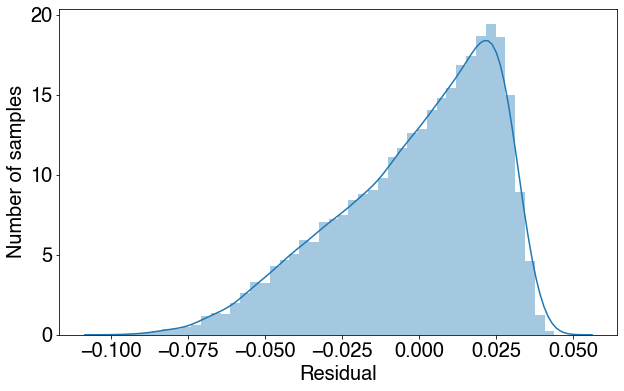

In [8]:
# Plot histogram of errors
residual = predictions - y
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.distplot(residual)
ax.set(xlabel= 'Residual', ylabel = 'Number of samples')
plt.show()

In [2751]:
score_NN_policy(GA_optimize, [1.0, 150.0, 0, 0], num_iterations = 20)

0.21132967139852585

## Training the UNCONSTRAINED Q-network

In [1427]:
# Initialize Q-network
Q_net = torch.nn.Sequential(
        torch.nn.Linear(6,   200, bias = True), # 6 input nodes
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200,   1, bias = True), # 1 output node
    ).double()

In [1429]:
# ========== 1) GENERATING INITIAL BATCH OF SAMPLES FOR REPLAY BUFFER ==========
epsilon       = 0.99
replay_buffer = collections.deque(maxlen = 3000) # Max capacity of 3000

for i in range(100): # Generate 100 episodes
    episode       = generate_episode_with_NN(NN = GA_optimize,
                                             initial_state = [1.0, 150.0, 0, 0],
                                             epsilon = epsilon)
    replay_buffer = update_replay_buffer(replay_buffer, episode, discount_factor = 0.9) # Add to replay buffer
print(len(replay_buffer))

# ================================= 2) TRAINING THE Q-NETWORK =================================
epsilon            = 0.99 # Initial epsilon
score_list         = [] # For plotting score of policy visited over time
iteration_list     = []
policy_mean_list   = [] # For plotting evolution of policy visited over time
policy_std_list    = [] # For plotting evolution of policy visited over time
training_loss_list = [] # For plotting loss of NN (after 20 epochs) over time
episode_bank       = [] # A list of list of lists - Tertiary list  -> Iterations
                        #                         - Secondary list -> Episodes
                        #                         - Primary list   -> Steps
                        #                         For plotting evolution of states visited over time            

for iteration in range(1000):
    # SCORE EXISTING POLICY
    print('=========== TRAINING ITERATION %.0f ===========' % iteration)
    print('Current epsilon = ', epsilon)
    current_score = score_NN_policy(GA_optimize, [1.0, 150.0, 0, 0], num_iterations = 10)
    print('AVERAGE SCORE = '  , current_score)
    print('')
    
    # GENERATE EPISODES & ADD TO REPLAY BUFFER
    for j in range(100):
        episode       = generate_episode_with_NN(NN = GA_optimize,
                                             initial_state = [1.0, 150.0, 0, 0],
                                             epsilon = epsilon)
        replay_buffer = update_replay_buffer(replay_buffer, episode, discount_factor = 0.9) # Add to replay buffer
    
    # SAMPLE EPISODES FROM REPLAY BUFFER
    combined_inputs  = [] # List of lists to be converted into input tensor
    combined_targets = [] # List to be converted into target tensor
    samples          = random.sample(replay_buffer, 100) # Draw random samples from replay buffer
    
    for inputs, target in samples:
        combined_inputs  += [inputs]
        combined_targets += [[target]]
    combined_inputs  = torch.tensor(combined_inputs)  # Convert list to tensor
    combined_targets = torch.tensor(combined_targets) # Convert list to tensor
    
    # TRAIN THE NEURAL NETWORK
    optimizer = torch.optim.Adam(Q_net.parameters(), lr=1e-3) # Initialize Adam optimizer
    loss_func = torch.nn.SmoothL1Loss()                     # Define loss function
    

    for epoch in range(20):
        prediction = Q_net(combined_inputs)                    # Input x and predict based on x
        loss       = loss_func(prediction, combined_targets) # Must be (1. nn output, 2. target)

        optimizer.zero_grad()   # Clear gradients for next train
        loss.backward()         # Backpropagation, compute gradients
        optimizer.step()        # Apply gradients
#         print('Epoch = ', epoch, 'Loss = %.4f' % loss.data.numpy())

    score_list         += [current_score] # Store score for each iteration
    training_loss_list += [loss.data.numpy()]                                # Store training loss after 20 epochs for each iteration
    iteration_list     += [iteration]                                        # Store iteration
    
    # INVESTIGATING EVOLUTION OF POLICY OVER TRAINING ITERATIONS
    if iteration in np.arange(0,5000,10): # Every 10 iterations
        list_of_policies  = score_NN_policy(GA_optimize, [1.0, 150.0, 0, 0], num_iterations = 100, get_control = True)[1] # add policies
        policy_mean       = np.mean(list_of_policies, axis = 0) # Calculate mean of policies
        policy_std        = np.std(list_of_policies, axis = 0)  # Calculate std of policies
        policy_mean_list += [policy_mean] # Save mean policy for plotting
        policy_std_list  += [policy_std]  # Save std of policy for plotting
    
    # INVESTIGATING EVOLUTION OF STATES VISITED OVER TRAINING ITERATIONS
    if iteration in np.arange(0, 5000, 10): # Every 10 iterations
        pool_of_episodes = [] # A *list of lists* of episodes
        for i in range(10):   # Generate 10 sample episodes and store them
            pool_of_episodes += [generate_episode_with_NN(NN = GA_optimize,
                                             initial_state = [1.0, 150.0, 0, 0],
                                             epsilon = 0)]
        episode_bank         += [pool_of_episodes]
    
    epsilon *= 0.99 # Decay epsilon

1300
=========== TRAINING ITERATION 0 ===========
Current epsilon =  0.99
AVERAGE SCORE =  0.0469546594969021

=========== TRAINING ITERATION 1 ===========
Current epsilon =  0.9801
AVERAGE SCORE =  0.16681827477301764

=========== TRAINING ITERATION 2 ===========
Current epsilon =  0.9702989999999999
AVERAGE SCORE =  0.19205790737200937

=========== TRAINING ITERATION 3 ===========
Current epsilon =  0.96059601
AVERAGE SCORE =  0.18985025321303653

=========== TRAINING ITERATION 4 ===========
Current epsilon =  0.9509900498999999
AVERAGE SCORE =  0.18041386964774603

=========== TRAINING ITERATION 5 ===========
Current epsilon =  0.9414801494009999
AVERAGE SCORE =  0.15763484392269506

=========== TRAINING ITERATION 6 ===========
Current epsilon =  0.9320653479069899
AVERAGE SCORE =  0.17876313476791444

=========== TRAINING ITERATION 7 ===========
Current epsilon =  0.92274469442792
AVERAGE SCORE =  0.1879825664556811

=========== TRAINING ITERATION 8 ===========
Current epsilon =  0

=========== TRAINING ITERATION 68 ===========
Current epsilon =  0.4998370298991989
AVERAGE SCORE =  0.14499011185800872

=========== TRAINING ITERATION 69 ===========
Current epsilon =  0.49483865960020695
AVERAGE SCORE =  0.19109135181282338

=========== TRAINING ITERATION 70 ===========
Current epsilon =  0.4898902730042049
AVERAGE SCORE =  0.19266918256626392

=========== TRAINING ITERATION 71 ===========
Current epsilon =  0.48499137027416284
AVERAGE SCORE =  0.1827263907719213

=========== TRAINING ITERATION 72 ===========
Current epsilon =  0.4801414565714212
AVERAGE SCORE =  0.20556556462326245

=========== TRAINING ITERATION 73 ===========
Current epsilon =  0.475340042005707
AVERAGE SCORE =  0.18792382614325404

=========== TRAINING ITERATION 74 ===========
Current epsilon =  0.47058664158564995
AVERAGE SCORE =  0.11991360549959693

=========== TRAINING ITERATION 75 ===========
Current epsilon =  0.4658807751697934
AVERAGE SCORE =  0.20907992513573834

=========== TRAINING IT

=========== TRAINING ITERATION 135 ===========
Current epsilon =  0.2549097606963092
AVERAGE SCORE =  0.19598761962654887

=========== TRAINING ITERATION 136 ===========
Current epsilon =  0.2523606630893461
AVERAGE SCORE =  0.20643233414048603

=========== TRAINING ITERATION 137 ===========
Current epsilon =  0.24983705645845267
AVERAGE SCORE =  0.18109045547332098

=========== TRAINING ITERATION 138 ===========
Current epsilon =  0.24733868589386815
AVERAGE SCORE =  0.20132286763000637

=========== TRAINING ITERATION 139 ===========
Current epsilon =  0.24486529903492946
AVERAGE SCORE =  0.20272155205906506

=========== TRAINING ITERATION 140 ===========
Current epsilon =  0.24241664604458016
AVERAGE SCORE =  0.1732398984525862

=========== TRAINING ITERATION 141 ===========
Current epsilon =  0.23999247958413436
AVERAGE SCORE =  0.20665608134948737

=========== TRAINING ITERATION 142 ===========
Current epsilon =  0.23759255478829303
AVERAGE SCORE =  0.1908332305985928

=========== 

AVERAGE SCORE =  0.20037246469258174

=========== TRAINING ITERATION 202 ===========
Current epsilon =  0.13000034453500542
AVERAGE SCORE =  0.19177357707606135

=========== TRAINING ITERATION 203 ===========
Current epsilon =  0.12870034108965536
AVERAGE SCORE =  0.046627288519461005

=========== TRAINING ITERATION 204 ===========
Current epsilon =  0.12741333767875881
AVERAGE SCORE =  0.17289461487222185

=========== TRAINING ITERATION 205 ===========
Current epsilon =  0.12613920430197123
AVERAGE SCORE =  0.18844508288745707

=========== TRAINING ITERATION 206 ===========
Current epsilon =  0.12487781225895152
AVERAGE SCORE =  0.18439494697994932

=========== TRAINING ITERATION 207 ===========
Current epsilon =  0.123629034136362
AVERAGE SCORE =  0.180330619307194

=========== TRAINING ITERATION 208 ===========
Current epsilon =  0.12239274379499838
AVERAGE SCORE =  0.1700309922285809

=========== TRAINING ITERATION 209 ===========
Current epsilon =  0.1211688163570484
AVERAGE SCORE

=========== TRAINING ITERATION 268 ===========
Current epsilon =  0.066968002747864
AVERAGE SCORE =  0.21074476243223916

=========== TRAINING ITERATION 269 ===========
Current epsilon =  0.06629832272038537
AVERAGE SCORE =  0.20237130507933804

=========== TRAINING ITERATION 270 ===========
Current epsilon =  0.06563533949318151
AVERAGE SCORE =  0.2065661430709293

=========== TRAINING ITERATION 271 ===========
Current epsilon =  0.06497898609824969
AVERAGE SCORE =  0.20910766967862848

=========== TRAINING ITERATION 272 ===========
Current epsilon =  0.0643291962372672
AVERAGE SCORE =  0.20704087901108995

=========== TRAINING ITERATION 273 ===========
Current epsilon =  0.06368590427489453
AVERAGE SCORE =  0.20722168868023552

=========== TRAINING ITERATION 274 ===========
Current epsilon =  0.06304904523214558
AVERAGE SCORE =  0.19556671777952297

=========== TRAINING ITERATION 275 ===========
Current epsilon =  0.06241855477982412
AVERAGE SCORE =  0.20425263981791955

=========== 

AVERAGE SCORE =  0.20104055559055017

=========== TRAINING ITERATION 335 ===========
Current epsilon =  0.03415272685621234
AVERAGE SCORE =  0.19942217510100232

=========== TRAINING ITERATION 336 ===========
Current epsilon =  0.03381119958765021
AVERAGE SCORE =  0.187965981685881

=========== TRAINING ITERATION 337 ===========
Current epsilon =  0.03347308759177371
AVERAGE SCORE =  0.2061193898832568

=========== TRAINING ITERATION 338 ===========
Current epsilon =  0.03313835671585597
AVERAGE SCORE =  0.19933948174270813

=========== TRAINING ITERATION 339 ===========
Current epsilon =  0.03280697314869741
AVERAGE SCORE =  0.20771141166906712

=========== TRAINING ITERATION 340 ===========
Current epsilon =  0.032478903417210436
AVERAGE SCORE =  0.1753608385010424

=========== TRAINING ITERATION 341 ===========
Current epsilon =  0.032154114383038335
AVERAGE SCORE =  0.20691204133620006

=========== TRAINING ITERATION 342 ===========
Current epsilon =  0.03183257323920795
AVERAGE SC

AVERAGE SCORE =  0.20449874225409914

=========== TRAINING ITERATION 401 ===========
Current epsilon =  0.017593337264871736
AVERAGE SCORE =  0.20666303482484077

=========== TRAINING ITERATION 402 ===========
Current epsilon =  0.01741740389222302
AVERAGE SCORE =  0.20791857397087585

=========== TRAINING ITERATION 403 ===========
Current epsilon =  0.01724322985330079
AVERAGE SCORE =  0.018461449446759703

=========== TRAINING ITERATION 404 ===========
Current epsilon =  0.017070797554767782
AVERAGE SCORE =  0.20763752526957982

=========== TRAINING ITERATION 405 ===========
Current epsilon =  0.016900089579220106
AVERAGE SCORE =  0.2086089471643548

=========== TRAINING ITERATION 406 ===========
Current epsilon =  0.016731088683427906
AVERAGE SCORE =  0.207874782331263

=========== TRAINING ITERATION 407 ===========
Current epsilon =  0.016563777796593626
AVERAGE SCORE =  0.208491827291342

=========== TRAINING ITERATION 408 ===========
Current epsilon =  0.016398140018627688
AVERAG

AVERAGE SCORE =  0.20760825137800382

=========== TRAINING ITERATION 467 ===========
Current epsilon =  0.009062981044490808
AVERAGE SCORE =  0.2081075821107287

=========== TRAINING ITERATION 468 ===========
Current epsilon =  0.0089723512340459
AVERAGE SCORE =  0.20608738668856366

=========== TRAINING ITERATION 469 ===========
Current epsilon =  0.00888262772170544
AVERAGE SCORE =  0.2087566524153436

=========== TRAINING ITERATION 470 ===========
Current epsilon =  0.008793801444488386
AVERAGE SCORE =  0.2088697832124855

=========== TRAINING ITERATION 471 ===========
Current epsilon =  0.008705863430043502
AVERAGE SCORE =  0.21027367606766276

=========== TRAINING ITERATION 472 ===========
Current epsilon =  0.008618804795743068
AVERAGE SCORE =  0.20515877237480568

=========== TRAINING ITERATION 473 ===========
Current epsilon =  0.008532616747785637
AVERAGE SCORE =  0.20747332062609553

=========== TRAINING ITERATION 474 ===========
Current epsilon =  0.00844729058030778
AVERAGE

AVERAGE SCORE =  0.21072660204234

=========== TRAINING ITERATION 533 ===========
Current epsilon =  0.004668677930525566
AVERAGE SCORE =  0.21122025610946177

=========== TRAINING ITERATION 534 ===========
Current epsilon =  0.00462199115122031
AVERAGE SCORE =  0.20974069582616095

=========== TRAINING ITERATION 535 ===========
Current epsilon =  0.004575771239708107
AVERAGE SCORE =  0.21145900400775947

=========== TRAINING ITERATION 536 ===========
Current epsilon =  0.004530013527311026
AVERAGE SCORE =  0.20963145872900749

=========== TRAINING ITERATION 537 ===========
Current epsilon =  0.004484713392037916
AVERAGE SCORE =  0.20871608458265728

=========== TRAINING ITERATION 538 ===========
Current epsilon =  0.004439866258117537
AVERAGE SCORE =  0.21132278700480325

=========== TRAINING ITERATION 539 ===========
Current epsilon =  0.004395467595536362
AVERAGE SCORE =  0.21017113992695027

=========== TRAINING ITERATION 540 ===========
Current epsilon =  0.004351512919580998
AVER

AVERAGE SCORE =  0.2093140501580144

=========== TRAINING ITERATION 599 ===========
Current epsilon =  0.002405009291311067
AVERAGE SCORE =  0.21086975085021073

=========== TRAINING ITERATION 600 ===========
Current epsilon =  0.0023809591983979563
AVERAGE SCORE =  0.2113904384886678

=========== TRAINING ITERATION 601 ===========
Current epsilon =  0.0023571496064139765
AVERAGE SCORE =  0.21007166968476326

=========== TRAINING ITERATION 602 ===========
Current epsilon =  0.0023335781103498367
AVERAGE SCORE =  0.2104672490807626

=========== TRAINING ITERATION 603 ===========
Current epsilon =  0.002310242329246338
AVERAGE SCORE =  0.21033370630311882

=========== TRAINING ITERATION 604 ===========
Current epsilon =  0.002287139905953875
AVERAGE SCORE =  0.21054415062685541

=========== TRAINING ITERATION 605 ===========
Current epsilon =  0.0022642685068943362
AVERAGE SCORE =  0.2099763011637478

=========== TRAINING ITERATION 606 ===========
Current epsilon =  0.002241625821825393


AVERAGE SCORE =  0.21005227810572485

=========== TRAINING ITERATION 665 ===========
Current epsilon =  0.0012389095537034477
AVERAGE SCORE =  0.21031491714524644

=========== TRAINING ITERATION 666 ===========
Current epsilon =  0.0012265204581664133
AVERAGE SCORE =  0.21112732845251053

=========== TRAINING ITERATION 667 ===========
Current epsilon =  0.0012142552535847491
AVERAGE SCORE =  0.21075533238213923

=========== TRAINING ITERATION 668 ===========
Current epsilon =  0.0012021127010489016
AVERAGE SCORE =  0.21101650125520152

=========== TRAINING ITERATION 669 ===========
Current epsilon =  0.0011900915740384126
AVERAGE SCORE =  0.21095368646002655

=========== TRAINING ITERATION 670 ===========
Current epsilon =  0.0011781906582980285
AVERAGE SCORE =  0.21085091528119343

=========== TRAINING ITERATION 671 ===========
Current epsilon =  0.0011664087517150481
AVERAGE SCORE =  0.21095719547080405

=========== TRAINING ITERATION 672 ===========
Current epsilon =  0.001154744664

=========== TRAINING ITERATION 730 ===========
Current epsilon =  0.0006446548446905099
AVERAGE SCORE =  0.21129893415219456

=========== TRAINING ITERATION 731 ===========
Current epsilon =  0.0006382082962436048
AVERAGE SCORE =  0.21141170892381167

=========== TRAINING ITERATION 732 ===========
Current epsilon =  0.0006318262132811687
AVERAGE SCORE =  0.211325272027935

=========== TRAINING ITERATION 733 ===========
Current epsilon =  0.000625507951148357
AVERAGE SCORE =  0.21161544657393166

=========== TRAINING ITERATION 734 ===========
Current epsilon =  0.0006192528716368734
AVERAGE SCORE =  0.21134544764650348

=========== TRAINING ITERATION 735 ===========
Current epsilon =  0.0006130603429205046
AVERAGE SCORE =  0.2116032931666504

=========== TRAINING ITERATION 736 ===========
Current epsilon =  0.0006069297394912996
AVERAGE SCORE =  0.2117574610722539

=========== TRAINING ITERATION 737 ===========
Current epsilon =  0.0006008604420963866
AVERAGE SCORE =  0.2115666701780454

AVERAGE SCORE =  0.21156848209156381

=========== TRAINING ITERATION 796 ===========
Current epsilon =  0.00033208563842715866
AVERAGE SCORE =  0.21172827481566836

=========== TRAINING ITERATION 797 ===========
Current epsilon =  0.0003287647820428871
AVERAGE SCORE =  0.2107966511379626

=========== TRAINING ITERATION 798 ===========
Current epsilon =  0.00032547713422245825
AVERAGE SCORE =  0.21169908056548975

=========== TRAINING ITERATION 799 ===========
Current epsilon =  0.00032222236288023367
AVERAGE SCORE =  0.21135760296421405

=========== TRAINING ITERATION 800 ===========
Current epsilon =  0.00031900013925143135
AVERAGE SCORE =  0.21117413230927246

=========== TRAINING ITERATION 801 ===========
Current epsilon =  0.000315810137858917
AVERAGE SCORE =  0.21132857310765857

=========== TRAINING ITERATION 802 ===========
Current epsilon =  0.00031265203648032783
AVERAGE SCORE =  0.19376442471358227

=========== TRAINING ITERATION 803 ===========
Current epsilon =  0.000309525

AVERAGE SCORE =  0.21193954756885472

=========== TRAINING ITERATION 861 ===========
Current epsilon =  0.0001727976146638485
AVERAGE SCORE =  0.21152636429716973

=========== TRAINING ITERATION 862 ===========
Current epsilon =  0.00017106963851721
AVERAGE SCORE =  0.2113786987388974

=========== TRAINING ITERATION 863 ===========
Current epsilon =  0.0001693589421320379
AVERAGE SCORE =  0.21105830588625607

=========== TRAINING ITERATION 864 ===========
Current epsilon =  0.00016766535271071751
AVERAGE SCORE =  0.2118100813898281

=========== TRAINING ITERATION 865 ===========
Current epsilon =  0.00016598869918361034
AVERAGE SCORE =  0.21207468891859982

=========== TRAINING ITERATION 866 ===========
Current epsilon =  0.00016432881219177425
AVERAGE SCORE =  0.2061149751454371

=========== TRAINING ITERATION 867 ===========
Current epsilon =  0.0001626855240698565
AVERAGE SCORE =  0.2116392713333588

=========== TRAINING ITERATION 868 ===========
Current epsilon =  0.000161058668829

AVERAGE SCORE =  0.21148865692800517

=========== TRAINING ITERATION 926 ===========
Current epsilon =  8.991360112691314e-05
AVERAGE SCORE =  0.21136074062071253

=========== TRAINING ITERATION 927 ===========
Current epsilon =  8.901446511564401e-05
AVERAGE SCORE =  0.21137258371632045

=========== TRAINING ITERATION 928 ===========
Current epsilon =  8.812432046448757e-05
AVERAGE SCORE =  0.21122309126124733

=========== TRAINING ITERATION 929 ===========
Current epsilon =  8.72430772598427e-05
AVERAGE SCORE =  0.21163699002445174

=========== TRAINING ITERATION 930 ===========
Current epsilon =  8.637064648724426e-05
AVERAGE SCORE =  0.21126158194708125

=========== TRAINING ITERATION 931 ===========
Current epsilon =  8.550694002237182e-05
AVERAGE SCORE =  0.21188241673232772

=========== TRAINING ITERATION 932 ===========
Current epsilon =  8.46518706221481e-05
AVERAGE SCORE =  0.2121672750438774

=========== TRAINING ITERATION 933 ===========
Current epsilon =  8.380535191592662

=========== TRAINING ITERATION 991 ===========
Current epsilon =  4.678569020374915e-05
AVERAGE SCORE =  0.21174987079748106

=========== TRAINING ITERATION 992 ===========
Current epsilon =  4.6317833301711654e-05
AVERAGE SCORE =  0.21135094346972277

=========== TRAINING ITERATION 993 ===========
Current epsilon =  4.585465496869454e-05
AVERAGE SCORE =  0.21141235796553265

=========== TRAINING ITERATION 994 ===========
Current epsilon =  4.5396108419007594e-05
AVERAGE SCORE =  0.21088885583500255

=========== TRAINING ITERATION 995 ===========
Current epsilon =  4.494214733481752e-05
AVERAGE SCORE =  0.21154166104775074

=========== TRAINING ITERATION 996 ===========
Current epsilon =  4.449272586146935e-05
AVERAGE SCORE =  0.2112963030776213

=========== TRAINING ITERATION 997 ===========
Current epsilon =  4.404779860285465e-05
AVERAGE SCORE =  0.21153776693169882

=========== TRAINING ITERATION 998 ===========
Current epsilon =  4.36073206168261e-05
AVERAGE SCORE =  0.21152043007

In [2975]:
# # Save neural network
# torch.save(Q_net, './NN_models/CS1_Q_net_unconstrained')

# # Load pre-trained neural network
# Q_net = torch.load('./NN_models/CS1_Q_net_unconstrained')
# Q_net.eval()

Sequential(
  (0): Linear(in_features=6, out_features=200, bias=True)
  (1): LeakyReLU(negative_slope=0.01)
  (2): Linear(in_features=200, out_features=200, bias=True)
  (3): LeakyReLU(negative_slope=0.01)
  (4): Linear(in_features=200, out_features=1, bias=True)
)

No handles with labels found to put in legend.


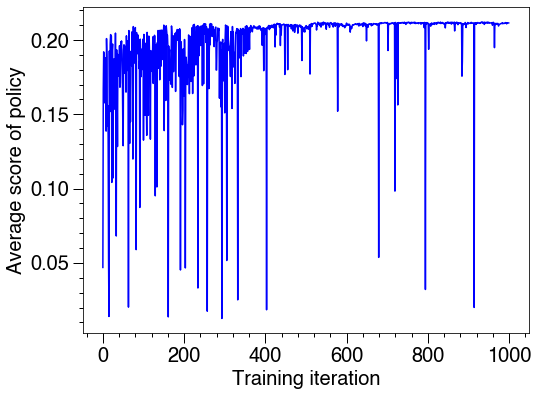

No handles with labels found to put in legend.


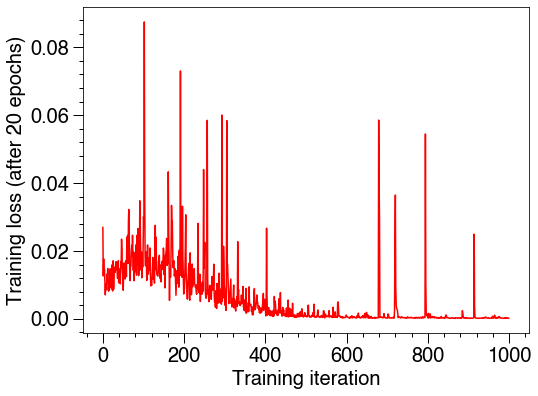

In [2753]:
# Save data
# with open('./Data/CS1_score_GA_unconstrained', 'wb') as f:
#     pickle.dump(score_list, f, pickle.HIGHEST_PROTOCOL)
# with open('./Data/CS1_loss_GA_unconstrained', 'wb') as f:
#     pickle.dump(training_loss_list, f, pickle.HIGHEST_PROTOCOL)

# Load pre-run data
# with open('./Data/CS1_score_GA_unconstrained', 'rb') as f:
#     score_list = pickle.load(f)
# with open('./Data/CS1_loss_GA_unconstrained', 'rb') as f:
#     training_loss_list = pickle.load(f)

# Plot score vs. training iteration
fig, ax = plt.subplots(figsize=(8,6))
ax.minorticks_on()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))
ax.yaxis.set_minor_locator(AutoMinorLocator(5))
ax.tick_params(which='major', length=10, width=1, direction='out')
ax.tick_params(which='minor', length=4, width=1, direction='out')
plt.plot(iteration_list, score_list, color = 'b')
plt.legend(frameon =  0)
plt.ylabel('Average score of policy', fontsize = 20)
plt.xlabel('Training iteration', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

# Plot training loss vs. training iteration
fig, ax = plt.subplots(figsize=(8,6))
ax.minorticks_on()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))
ax.yaxis.set_minor_locator(AutoMinorLocator(5))
ax.tick_params(which='major', length=10, width=1, direction='out')
ax.tick_params(which='minor', length=4, width=1, direction='out')
plt.plot(iteration_list, training_loss_list, color = 'r')
plt.legend(frameon =  0)
plt.ylabel('Training loss (after 20 epochs)', fontsize = 20)
plt.xlabel('Training iteration', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

In [14]:
# Q_net = torch.nn.Sequential(
#         torch.nn.Linear(6,   200, bias = True), # 6 input nodes
#         torch.nn.LeakyReLU(),    # apply ReLU activation function
#         torch.nn.Linear(200, 200, bias = True), 
#         torch.nn.LeakyReLU(),    # apply ReLU activation function
#         torch.nn.Linear(200,   1, bias = True), # 1 output node
#     ).double()

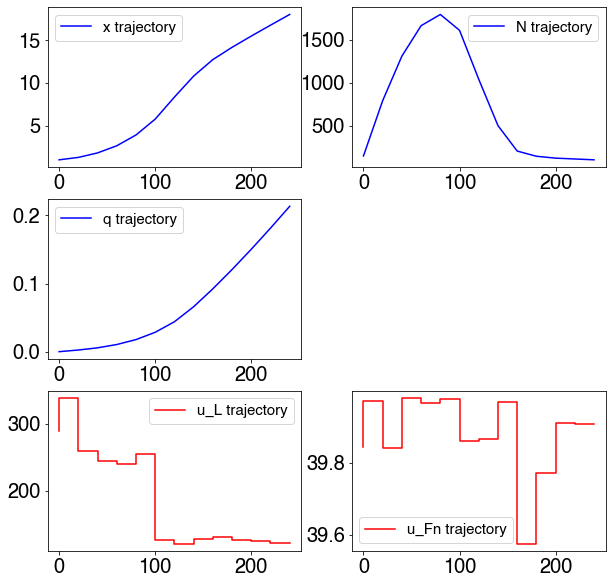

Score: 0.2132957972354426


In [3089]:
episode = generate_episode_with_NN(NN = max_action, initial_state = [1.0, 150.0, 0, 0], epsilon = 0)
plot_episode(episode) 

In [1298]:
score_NN_policy(GA_optimize, [1.0, 150.0, 0, 0], num_iterations = 100)

0.20795865725499407

## Genetic algorithm

In [5]:
# Source: Ahmed Gad - https://github.com/ahmedfgad/GeneticAlgorithmPython/tree/master/Tutorial%20Project
def cal_pop_fitness(population, initial_state):
    # Calculating the fitness value of each solution in the current population.
    # The fitness function calulates the sum of products between each input and its corresponding weight.
    state = []
    population = population.tolist() # convert 2D array to list of lists
    for i in range(len(population)):
        s = initial_state + population[i] # Append action to state 
        s = standardize_state_Q(s) # Standardize
        state += [s]
    state = torch.tensor(state).double()
    fitness = Q_net(state).detach().numpy()
    return fitness

def cal_pop_fitness_constrained(population, initial_state, threshold):
    # Calculating the fitness value of each solution in the current population.
    # The fitness function calulates the sum of products between each input and its corresponding weight.
    
    # CALCULATE Q-FITNESS
    state = []
    population = population.tolist() # convert 2D array to list of lists
    for i in range(len(population)):
        s = initial_state + population[i] # Append action to state 
        s = standardize_state_Q(s) # Standardize using Q-network mean & std
        state += [s]
    state = torch.tensor(state).double()
    fitness_Q = (Q_net(state).detach().numpy() * y_std_Q) + y_mean_Q # Unstandardized Q-network fitness
#     print('fitness_Q:', fitness_Q)
    # CALCULATE C-FITNESS 
    state = []
    initial_state[3] = 240. - initial_state[3] #### NEED TO TRANSFORM T TO T_F- T #####
#     print('population:', population)
    for i in range(len(population)):
        s = initial_state + population[i] # Append action to state 
#         print('non-standardized state:',s)
        s = standardize_state_C(s) # Standardize using C-network mean & std
#         print('standardized state:',s)
        state += [s]
    state = torch.tensor(state).double()
    
    fitness_C = -1*((C_net(state).detach().numpy() * y_std_C) + y_mean_C) # Unstandardized C-network fitness - NEGATIVE SIGN because -ve C_net values denote higher fitness!

#     print('fitness_C:', fitness_C)
    # COMBINE Q-FITNESS AND C-FITNESS
    fitness_overall = []
    for i in range(len(population)):
        f = max(0, fitness_Q[i].item()) + 100*min(0, fitness_C[i].item() + threshold) # include gl only for now
#         f = fitness_Q[i].item() + 1000000*fitness_C[i][0].item()
        fitness_overall += [f]
    
    return fitness_overall

def select_mating_pool(pop, fitness, num_parents):
    # Selecting the best individuals in the current generation as parents for producing the offspring of the next generation.
    parents = np.empty((num_parents, pop.shape[1]))
    for parent_num in range(num_parents):
        max_fitness_idx = np.where(fitness == np.max(fitness))
        max_fitness_idx = max_fitness_idx[0][0]
        parents[parent_num, :] = pop[max_fitness_idx, :]
        fitness[max_fitness_idx] = -99999999999     # Make the current parent the most unfit
    return parents

def crossover(parents, offspring_size):
    offspring = np.empty(offspring_size)
    # The point at which crossover takes place between two parents. Usually, it is at the center.
    crossover_point = np.uint8(offspring_size[1]/2) # Returns 1 in this case (because 2 values)

    for k in range(offspring_size[0]):
        # Index of the first parent to mate.
        parent1_idx = k%parents.shape[0]
        # Index of the second parent to mate.
        parent2_idx = (k+1)%parents.shape[0]
        # The new offspring will have its first half of its genes taken from the first parent.
        offspring[k, 0:crossover_point] = parents[parent1_idx, 0:crossover_point]
        # The new offspring will have its second half of its genes taken from the second parent.
        offspring[k, crossover_point:] = parents[parent2_idx, crossover_point:]
    return offspring

def mutation(offspring_crossover, mut_percen):

    for idx in range(offspring_crossover.shape[0]): # Iterate over individual offspring
        for feature in range(offspring_crossover.shape[1]): # Iterate over its features 
            r = np.random.uniform(0, 1)
            
            if r < mut_percen: # If mutation occurs
#                 print('Mutated')
                if feature == 0: # If u_L 
                    offspring_crossover[idx, feature] = np.random.uniform(120, 400) # Pick random u_L
                else:            # Else u_Fn
                    offspring_crossover[idx, feature] = np.random.uniform(0, 40) # Pick random u_Fn
    return offspring_crossover

def generate_random_episode_constrained(initial_state, threshold = 0): 
    '''Generates an episode using RANDOM policy
    threshold is the tolerance of the limit, where 
    0            : Limit itself (as per defined in extract_constraint_values_from_episode() function)
    +ve threshold: Looser limit   
    -ve threshold: Stricter limit 
    '''
    episode = []
    state = initial_state  # Initial state
    for i in range(13):   # Take (12 + 1) steps
        predicted_c = np.inf # Initialize constraint
        while predicted_c > threshold: # Keep choosing a different action this until constraint is LESS THAN zero
            old_state = state # Old state for storing into episode
            old_state_without_action = old_state
            old_state = list(old_state)
            old_state[3] = 240.0 - old_state[3] # Convert to t to (t - t_f)
            u_L  = np.random.uniform(120, 400) # Pick random u_L
            u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
            action = [u_L, u_Fn]
            old_state += action     # Append action to state

            old_state_standardized = old_state.copy()
            old_state_standardized = standardize_state_C(old_state_standardized)

            old_state_standardized = torch.tensor(old_state_standardized)
            predicted_c = ((C_net(old_state_standardized).detach().numpy())*y_std_C) + y_mean_C # Update predicted constraint
#             print('predicted_c:', predicted_c)
        state, reward  = transition(state, action)     # Evolve to get new state 
        episode       += [[list(old_state_without_action), action, reward]] # Update step
    return episode
# generate_random_episode_constrained(initial_state = [1.0,150.0,0.,0.], threshold = 0)

def GA_optimize(state, mut_percen = 0.1):
    '''Argument: State [Cx, Cn, Cq, t]
       Output: Control [u_L, u_Fn] that maximizes Q 
    '''
    num_features       = 2  # Number of features (u_L and u_Fn)
    sol_per_pop        = 10 # Number of individuals per population
    num_parents_mating = 5  # Numbers of parents selected from each generation
    num_generations    = 10 # Number of generations
    
    mut_percen = mut_percen # Initial probability of mutation

    #Creating the initial population.
    new_pop = []
    for i in range(200): # Initial pop
        u_L  = np.random.uniform(120, 400) # Pick random u_L
        u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
        new_pop += [[u_L, u_Fn]]
    new_pop = np.array(new_pop)
#     print('new_pop',new_pop)

    decay_factor = (0.01/mut_percen)**(1/num_generations) # Define decay factor for mut_percen

    state = state
    avg_fitness_list = [] # Store average fitness scores
    max_fitness_list = [] # Store max fitness scores
    generation_list = []  # Store generation index

    for generation in range(num_generations):
        
        # Measuring the fitness of each chromosome in the population.
        fitness = cal_pop_fitness(new_pop, state)

        avg_fit = np.mean(fitness) # Average fitness
        max_fit = np.max(fitness)  # Max fitness of the generation
    #     print('==== Generation %.0f ====' % generation)
    #     print('Average fitness:', avg_fit)
    #     print('Max fitness:', max_fit)
    #     print('')
        avg_fitness_list += [avg_fit]    # Save average fitness score for plotting
        max_fitness_list += [max_fit]    # Save average fitness score for plotting
        generation_list  += [generation] # Save generation index

        # Selecting the best parents in the population for mating
        parents = select_mating_pool(new_pop, fitness, num_parents_mating)
#         print('parents:',parents)

        # Generating next generation using crossover
        offspring_crossover = crossover(parents, offspring_size=(sol_per_pop-parents.shape[0], num_features))
#         print('offspring_crossover',offspring_crossover)

        offspring_mutation = mutation(offspring_crossover, mut_percen = mut_percen)
#         print('offspring_mutation',offspring_mutation)

        # Creating the new population based on the parents and offspring
        new_pop[0:parents.shape[0], :] = parents
        new_pop[parents.shape[0]:sol_per_pop, :] = offspring_mutation

        # Cull excess initial population
        new_pop = new_pop[0:sol_per_pop,:]

    #     mut_percen = 0.5*e**(-1*generation/(num_generations/3)) # Decay
        mut_percen *= decay_factor
    
    max_action = new_pop[0] # Select the fittest action from final population
    return max_action
# GA_optimize([1.0, 150.0, 0, 0], mut_percen = 0.25) # Test function

def GA_optimize_constrained(state, threshold, init_mut_percen = 0.01):
    '''Argument: State [Cx, Cn, Cq, t]
       Output: Control [u_L, u_Fn] that maximizes Q and avoids violation of constraints
    '''
    num_features       = 2  # Number of features (u_L and u_Fn)
    sol_per_pop        = 10 # Number of individuals per population
    num_parents_mating = 5  # Numbers of parents selected from each generation
    num_generations    = 10 # Number of generations
    
    max_fitness = -np.inf # Initialize fitness
    
    while max_fitness < 0: # Keep running this loop until no violations (no -ve fitness) occurs
    
        mut_percen = init_mut_percen # Initial probability of mutation

        #Creating the initial population.
        new_pop = []
        for i in range(200): # Initial pop
            u_L  = np.random.uniform(120, 400) # Pick random u_L
            u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
            new_pop += [[u_L, u_Fn]]
        new_pop = np.array(new_pop)
    #     print('new_pop',new_pop)

        decay_factor = (0.01/mut_percen)**(1/num_generations) # Define decay factor for mut_percen

        state = state
        avg_fitness_list = [] # Store average fitness scores
        max_fitness_list = [] # Store max fitness scores
        generation_list = []  # Store generation index

        for generation in range(num_generations):

            # Measuring the fitness of each chromosome in the population.
            fitness = cal_pop_fitness_constrained(new_pop, state, threshold = threshold)

            avg_fit = np.mean(fitness) # Average fitness
            max_fit = np.max(fitness)  # Max fitness of the generation
        #     print('==== Generation %.0f ====' % generation)
        #     print('Average fitness:', avg_fit)
        #     print('Max fitness:', max_fit)
        #     print('')
            avg_fitness_list += [avg_fit]    # Save average fitness score for plotting
            max_fitness_list += [max_fit]    # Save average fitness score for plotting
            generation_list  += [generation] # Save generation index

            # Selecting the best parents in the population for mating
            parents = select_mating_pool(new_pop, fitness, num_parents_mating)
    #         print('parents:',parents)

            # Generating next generation using crossover
            offspring_crossover = crossover(parents, offspring_size=(sol_per_pop-parents.shape[0], num_features))
    #         print('offspring_crossover',offspring_crossover)

            offspring_mutation = mutation(offspring_crossover, mut_percen = mut_percen)
    #         print('offspring_mutation',offspring_mutation)

            # Creating the new population based on the parents and offspring
            new_pop[0:parents.shape[0], :] = parents
            new_pop[parents.shape[0]:sol_per_pop, :] = offspring_mutation

            # Cull excess initial population
            new_pop = new_pop[0:sol_per_pop,:]

        #     mut_percen = 0.5*e**(-1*generation/(num_generations/3)) # Decay
    #         mut_percen *= decay_factor

        max_action = new_pop[0] # Select the fittest action from final population
        max_fitness = max_fitness_list[-1] # Update max_fitness
#     plt.figure()
#     plt.plot(generation_list, avg_fitness_list, label = 'Avg (%.3f)'%avg_fitness_list[-1])
#     plt.plot(generation_list, max_fitness_list, label = 'Max (%.3f)'%max_fitness_list[-1])
#     plt.legend()
#     plt.show()
#     print(max_fitness)
    
    return max_action
# GA_optimize_constrained([1.0, 150.0, 0, 0], mut_percen = 0.25) # Test function

In [6]:
#test constrained
sol_per_pop = 200 # Number of individuals per population
num_features = 2 # Number of features (u_L and u_Fn)
num_parents_mating = 2
num_generations = 10
mut_percen = 0.1
state = [1.0, 150.0, 0, 0]
new_pop = []
for i in range(sol_per_pop): # Initial pop
    u_L  = np.random.uniform(120, 400) # Pick random u_L
    u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
    new_pop += [[u_L, u_Fn]]
new_pop = np.array(new_pop)
print(new_pop)

[[179.13925962  30.57672343]
 [124.48071101   9.26168252]
 [314.54368242  15.76550691]
 [359.64106007   0.97654788]
 [274.29386733  35.60830526]
 [149.02011866   4.16400042]
 [234.12618049  19.30350569]
 [284.82821884  38.00715545]
 [209.70755877   9.73469265]
 [220.29808298  17.01841382]
 [299.4456321    8.58657492]
 [164.99159141  35.18478086]
 [248.51423169   8.26461201]
 [181.62398762   4.26374699]
 [267.32999523  29.21109984]
 [251.89288039   2.94905453]
 [188.58351841   2.16958377]
 [307.10388371  23.60479072]
 [250.76749086  17.48562244]
 [297.44421518  29.32117977]
 [199.96415752  17.12633522]
 [149.64742523  25.95760572]
 [218.58385939  17.18028478]
 [318.00039298   1.57813015]
 [202.19121181  20.18538808]
 [233.20060449  23.88036386]
 [125.62607855  36.12018546]
 [280.54087672  13.6208119 ]
 [191.43520708  15.58122332]
 [183.13414021   2.72201882]
 [277.13698824  29.57120876]
 [337.99895443  21.96947792]
 [297.53556815  33.70980689]
 [222.05139198  12.09834958]
 [289.06581222

In [23]:
fitness = cal_pop_fitness_constrained(new_pop, [1.0, 150.0, 0, 0], threshold = 0)
fitness

[0.05978947246479754,
 0.06020446185068032,
 0.060616104516906404,
 0.06266809191663145,
 0.06072535512378577,
 0.06080284364017386,
 0.05941043047870424,
 0.06123692932358149,
 0.0599791308652087,
 0.05949884427510786,
 0.06108745858033085,
 0.060201713324676595,
 0.06070726935602775,
 0.060765660049313164,
 0.06008152880938785,
 0.061798436099639975,
 0.061252397699039514,
 0.06064251778962761,
 0.05963642455483936,
 0.060664938947961204,
 0.05943506908419684,
 0.05995088811412518,
 0.05949259907924271,
 0.06231276472608072,
 0.0593909629636249,
 0.05928521403020784,
 0.060719364496413526,
 0.06036299193522176,
 0.059422480811014776,
 0.06109244691646471,
 0.06025163589525812,
 0.06125070195176651,
 0.060926043226155045,
 0.059786494501995815,
 0.06019965238947874,
 0.06239244787766966,
 0.059848682058377234,
 0.05986814911696768,
 0.05951693789703534,
 0.061608545044891994,
 0.059759264996437376,
 0.062456288461479735,
 0.06313553621424871,
 0.05940220839182495,
 0.05974621422357643

new_pop [[1.81211496e+02 3.05246017e+01]
 [3.66489746e+02 1.58744306e+00]
 [2.92928939e+02 5.79655101e+00]
 [3.07457448e+02 2.80108055e+01]
 [2.43509642e+02 1.30770081e+00]
 [3.83399417e+02 3.82602683e-01]
 [3.98013401e+02 2.68004595e+01]
 [2.15331826e+02 1.50913508e+01]
 [2.72530442e+02 3.74622065e+01]
 [1.80721262e+02 1.23045924e+01]
 [1.27394965e+02 3.03444751e+01]
 [1.95803695e+02 3.30698993e+01]
 [2.44791102e+02 7.54029615e+00]
 [2.42028887e+02 1.98059296e+01]
 [2.00782451e+02 5.80052282e+00]
 [2.73956813e+02 1.45351603e+01]]
parents: [[195.80369457  33.06989933]
 [181.21149575  30.52460172]
 [127.39496493  30.34447507]
 [242.02888667  19.80592958]
 [272.53044246  37.46220653]
 [215.3318256   15.09135077]
 [273.95681302  14.53516025]
 [307.45744796  28.01080548]]
offspring_crossover [[195.80369457  30.52460172]
 [181.21149575  30.34447507]
 [127.39496493  19.80592958]
 [242.02888667  37.46220653]
 [272.53044246  15.09135077]
 [215.3318256   14.53516025]
 [273.95681302  28.01080548

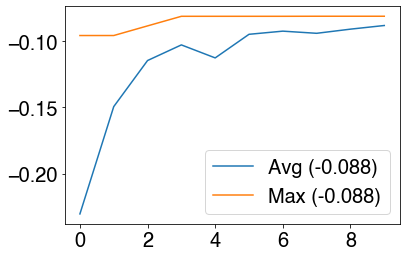

In [1405]:
sol_per_pop = 16 # Number of individuals per population
num_features = 2 # Number of features (u_L and u_Fn)
num_parents_mating = 8
num_generations = 10
mut_percen = 0.1

decay_factor = (0.01/mut_percen)**(1/num_generations) # Define decay factor for mut_percen
state = [1.0, 150.0, 0, 0]
avg_fitness_list = []
max_fitness_list = []
generation_list = []

#Creating the initial population.
new_pop = []
for i in range(sol_per_pop): # Initial pop
    u_L  = np.random.uniform(120, 400) # Pick random u_L
    u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
    new_pop += [[u_L, u_Fn]]
new_pop = np.array(new_pop)
print('new_pop',new_pop)

for generation in range(num_generations):
        # Measuring the fitness of each chromosome in the population.
    fitness = cal_pop_fitness(new_pop, state)
    
    avg_fit = np.mean(fitness)
    max_fit = np.max(fitness)
    avg_fitness_list += [avg_fit]    # Save average fitness score for plotting
    max_fitness_list += [max_fit]    # Save average fitness score for plotting
    generation_list  += [generation] # Save generation index

        # Selecting the best parents in the population for mating.
    parents = select_mating_pool(new_pop, fitness, num_parents_mating)
    print('parents:',parents)

        # Generating next generation using crossover.
    offspring_crossover = crossover(parents, offspring_size=(sol_per_pop-parents.shape[0], num_features))
    print('offspring_crossover',offspring_crossover)

    offspring_mutation = mutation(offspring_crossover, mut_percen = mut_percen)
    print('offspring_mutation',offspring_mutation)

        # Creating the new population based on the parents and offspring.
    new_pop[0:parents.shape[0], :] = parents
    new_pop[parents.shape[0]:sol_per_pop, :] = offspring_mutation

        # Cull excess
    new_pop = new_pop[0:sol_per_pop,:]

    #     mut_percen = 0.5*e**(-1*generation/(num_generations/3)) # Decay
    #     mut_percen *= decay_factor
    print('Mut_percen:', mut_percen)
    print('new_pop',new_pop)

plt.figure()
plt.plot(generation_list, avg_fitness_list, label = 'Avg (%.3f)'%avg_fitness_list[-1])
plt.plot(generation_list, max_fitness_list, label = 'Max (%.3f)'%avg_fitness_list[-1])
plt.legend()
plt.show()

new_pop [[1.20763215e+02 3.63771522e+01]
 [1.82185173e+02 9.79185940e-03]
 [1.88919402e+02 7.96462500e+00]
 [2.70810444e+02 2.25450981e+01]
 [2.64681597e+02 1.42065928e+01]
 [3.36304174e+02 2.97004334e+01]
 [3.89137778e+02 2.75539665e+01]
 [1.92059897e+02 4.41183515e+00]
 [1.59832108e+02 1.05676672e+01]
 [1.20815316e+02 1.76080594e+01]
 [2.83246277e+02 1.96534382e+01]
 [2.51090465e+02 3.92791381e+01]
 [3.79864022e+02 1.86859345e+01]
 [1.50971979e+02 1.98787630e+01]
 [1.37434996e+02 2.64851089e+01]
 [1.52077675e+02 1.82547963e+01]
 [1.62411976e+02 1.75672305e+01]
 [2.18755770e+02 2.81747050e+01]
 [2.42040546e+02 2.42773980e+01]
 [2.23823086e+02 3.82709577e+01]
 [2.31444400e+02 2.36154036e+01]
 [2.36698413e+02 3.14414183e+01]
 [3.31266643e+02 1.19902283e+01]
 [3.74656737e+02 2.31034703e+01]
 [3.96874623e+02 3.44678898e+00]
 [2.18969961e+02 3.71700072e+01]
 [1.24125990e+02 9.14123330e+00]
 [3.85618627e+02 1.89360889e+01]
 [3.24492800e+02 3.06438990e+01]
 [2.54405934e+02 3.94357322e+00]
 [

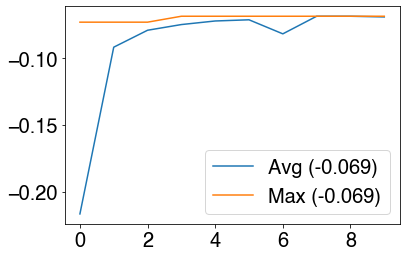

In [1352]:
sol_per_pop = 10 # Number of individuals per population
num_features = 2 # Number of features (u_L and u_Fn)
mut_percen = 0.1

#Creating the initial population.
new_pop = []
for i in range(200): # Initial pop
    u_L  = np.random.uniform(120, 400) # Pick random u_L
    u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
    new_pop += [[u_L, u_Fn]]
new_pop = np.array(new_pop)
print('new_pop',new_pop)

num_generations = 10
decay_factor = (0.01/mut_percen)**(1/num_generations) # Define decay factor for mut_percen
num_parents_mating = 5
state = [1.0, 150.0, 0, 0]
avg_fitness_list = []
max_fitness_list = []
generation_list = []

for generation in range(num_generations):
    # Measuring the fitness of each chromosome in the population.
    fitness = cal_pop_fitness(new_pop, state)
    
    avg_fit = np.mean(fitness)
    max_fit = np.max(fitness)
#     print('==== Generation %.0f ====' % generation)
#     print('Average fitness:', avg_fit)
#     print('Max fitness:', max_fit)
#     print('')
    avg_fitness_list += [avg_fit]    # Save average fitness score for plotting
    max_fitness_list += [max_fit]    # Save average fitness score for plotting
    generation_list  += [generation] # Save generation index
    
    # Selecting the best parents in the population for mating.
    parents = select_mating_pool(new_pop, fitness, num_parents_mating)
    print('parents:',parents)

    # Generating next generation using crossover.
    offspring_crossover = crossover(parents, offspring_size=(sol_per_pop-parents.shape[0], num_features))
    print('offspring_crossover',offspring_crossover)

    offspring_mutation = mutation(offspring_crossover, mut_percen = mut_percen)
    print('offspring_mutation',offspring_mutation)

    # Creating the new population based on the parents and offspring.
    new_pop[0:parents.shape[0], :] = parents
    new_pop[parents.shape[0]:sol_per_pop, :] = offspring_mutation

    # Cull excess
    new_pop = new_pop[0:sol_per_pop,:]
    
#     mut_percen = 0.5*e**(-1*generation/(num_generations/3)) # Decay
#     mut_percen *= decay_factor
    print('Mut_percen:', mut_percen)
    print('new_pop',new_pop)
plt.figure()
plt.plot(generation_list, avg_fitness_list, label = 'Avg (%.3f)'%avg_fitness_list[-1])
plt.plot(generation_list, max_fitness_list, label = 'Max (%.3f)'%avg_fitness_list[-1])
plt.legend()
plt.show()

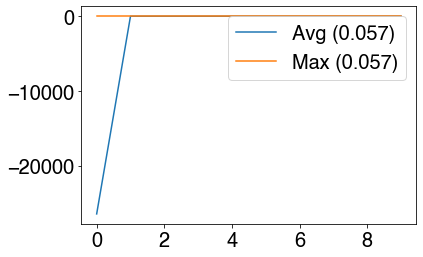

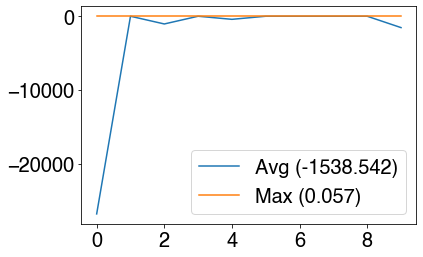

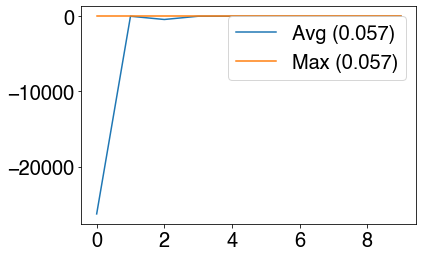

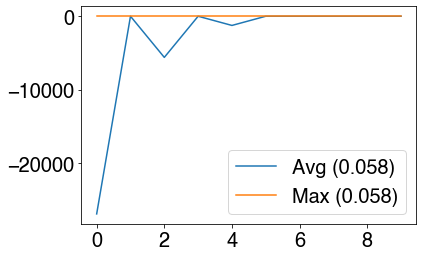

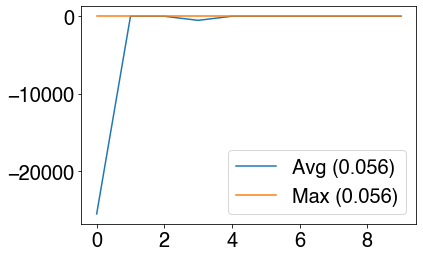

...

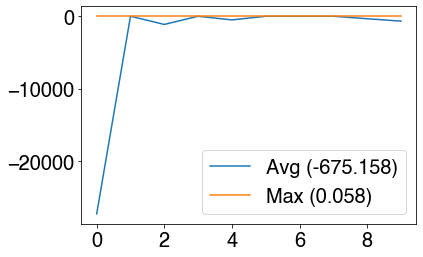

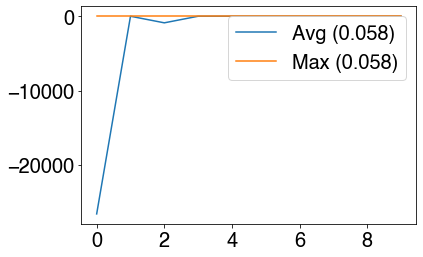

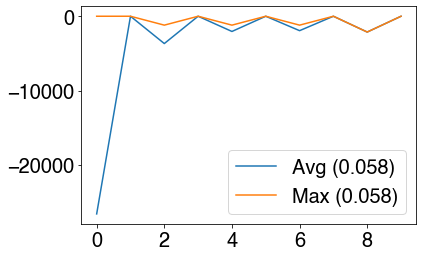

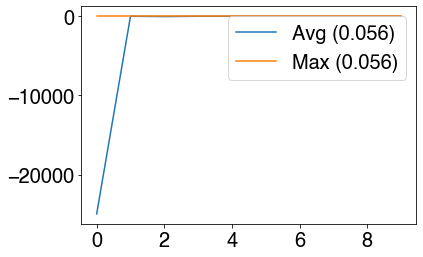

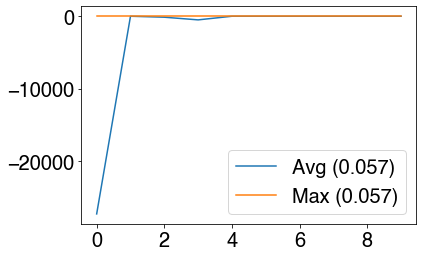

72.09464311599731


Text(0, 0.5, 'u_Fn')

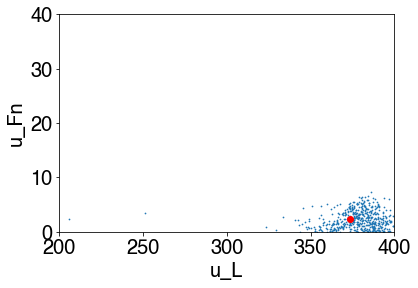

In [3011]:
# Inspecting the spread of actions predicted by GA
start = time.time()  # For timing purposes
u_L_pool  = []
u_Fn_pool = []
for i in range(500):
    u_L, u_Fn = GA_optimize_constrained([1.0, 150.0, 0, 0], mut_percen = 0.01)
    u_L_pool  += [u_L]
    u_Fn_pool += [u_Fn]
end = time.time()  # For timing purposes
print(end - start)
plt.figure()
plt.scatter(u_L_pool, u_Fn_pool, s = 0.5)
plt.scatter(np.mean(u_L_pool), np.mean(u_Fn_pool), color = 'r')
plt.xlim(200, 400)
plt.ylim(0,40)
plt.xlabel('u_L')
plt.ylabel('u_Fn')

6.305979013442993


Text(0, 0.5, 'u_Fn')

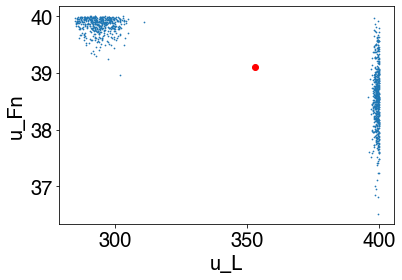

In [2513]:
# Inspecting the spread of predicted max_actions
start = time.time()  # For timing purposes
u_L_pool  = []
u_Fn_pool = []
for i in range(1000):
    u_L, u_Fn = max_action([1.0, 150.0, 0, 0])
    u_L_pool += [u_L]
    u_Fn_pool += [u_Fn]
end = time.time()  # For timing purposes
print(end - start)
plt.figure()
plt.scatter(u_L_pool, u_Fn_pool, s = 0.5)
plt.scatter(np.mean(u_L_pool), np.mean(u_Fn_pool), color = 'r')
# plt.xlim(120, 250)
# plt.ylim(35,41)
plt.xlabel('u_L')
plt.ylabel('u_Fn')

# Introducing constraints
The goal is to train a 2nd neural network to predict a constraint value given a state-action pair. The data used to train this NN will generated using a random policy in the cells below.

### Method 1: Training Q-network and C-network separately

In [2004]:
episode = generate_random_episode(initial_state = [1.0,150.0,0,0]) 
episode

[[[1.0, 150.0, 0, 0], [397.5990298386962, 16.18230626793477], 0],
 [[1.190128637831538, 366.7967954887811, 0.0021770330659060355, 20.0],
  [121.49242858924876, 15.481705852768975],
  0],
 [[1.457313386585481, 528.3696180360841, 0.005217567964931411, 40.0],
  [255.0681912833449, 9.928983216581546],
  0],
 [[1.899563874044882, 486.9874876380699, 0.008877040118121238, 60.0],
  [174.13126430214828, 7.027847040075077],
  0],
 [[2.3814796222818644, 362.85448970357544, 0.013717742137534052, 80.0],
  [343.74041451516223, 16.833126285567452],
  0],
 [[2.978292642848301, 371.50953758754633, 0.019101594557471617, 100.0],
  [128.2907839748526, 25.483184156387747],
  0],
 [[3.662990236877005, 502.4514295440288, 0.026575596077877926, 120.0],
  [155.31686627326312, 3.028524670429409],
  0],
 [[4.380641109309655, 160.07372819173636, 0.03548830515271087, 140.0],
  [338.14854982538077, 1.6688641971551554],
  0],
 [[4.623940901731667, 24.85372576513615, 0.04204559790905261, 160.0],
  [148.5926366096504, 

In [2005]:
extract_constraint_values_from_episode(episode)

([[1.0, 150.0, 0, 240, 397.5990298386962, 16.18230626793477],
  [1.190128637831538,
   366.7967954887811,
   0.0021770330659060355,
   220.0,
   121.49242858924876,
   15.481705852768975],
  [1.457313386585481,
   528.3696180360841,
   0.005217567964931411,
   200.0,
   255.0681912833449,
   9.928983216581546],
  [1.899563874044882,
   486.9874876380699,
   0.008877040118121238,
   180.0,
   174.13126430214828,
   7.027847040075077],
  [2.3814796222818644,
   362.85448970357544,
   0.013717742137534052,
   160.0,
   343.74041451516223,
   16.833126285567452],
  [2.978292642848301,
   371.50953758754633,
   0.019101594557471617,
   140.0,
   128.2907839748526,
   25.483184156387747],
  [3.662990236877005,
   502.4514295440288,
   0.026575596077877926,
   120.0,
   155.31686627326312,
   3.028524670429409],
  [4.380641109309655,
   160.07372819173636,
   0.03548830515271087,
   100.0,
   338.14854982538077,
   1.6688641971551554],
  [4.623940901731667,
   24.85372576513615,
   0.04204559

In [6]:
# Generate UNCONSTRAINED data for training the constraint neural network

start = time.time()  # For timing purposes
state_action = []    # To store state and action [Cx, Cn, Cq, t-t_f, u_L, u_Fn]
constraint   = []    # To store constraint       [g1, g2, g3]
num_episodes = 10000 # Number of episodes to generate

for j in range(num_episodes):
    generated_episode = generate_random_episode(initial_state = [1.0,150.0,0,0])  # Generate one episode
#     generated_episode = generate_episode_with_NN(GA_optimize, [1.0, 150.0, 0, 0], epsilon = 0.5)  # Generate one episode    
#     generated_episode = generate_random_episode_constrained(initial_state = [1.0,150.0,0,0], threshold = 60)
    s_a, c = extract_constraint_values_from_episode(generated_episode)            # Extract data from episode
    
    state_action += s_a                           # Append state and action 
    constraint   += c                             # Append constraint

end = time.time() # For timing purposes

state_action = np.array(state_action)
constraint   = np.array(constraint)
print('')
print('Time taken:', end - start)
print('==========INPUT [Cx, Cn, Cq, t_f-t, u_L, u_Fn]==========')
print(state_action)
print('')
print('==========TARGET VALUES [g1, g2, g3]==========')
print(constraint)


Time taken: 79.86057901382446
==========INPUT [Cx, Cn, Cq, t_f-t, u_L, u_Fn]==========
[[1.00000000e+00 1.50000000e+02 0.00000000e+00 2.40000000e+02
  3.85202557e+02 3.88907565e-01]
 [1.10089589e+00 9.62518308e+01 2.10791632e-03 2.20000000e+02
  1.62193769e+02 3.50937466e+01]
 [1.34513901e+00 6.62795757e+02 4.86554013e-03 2.00000000e+02
  2.56404836e+02 1.80025112e+01]
 ...
 [4.78842378e+00 2.14694834e+02 4.42520117e-02 6.00000000e+01
  3.54398862e+02 3.56358612e+00]
 [5.17589796e+00 3.96882589e+01 5.19744947e-02 4.00000000e+01
  3.84744175e+02 1.87670684e+01]
 [5.62319755e+00 1.35241405e+02 6.02441147e-02 2.00000000e+01
  3.62850215e+02 3.92731694e+01]]

==========TARGET VALUES [g1, g2, g3]==========
[[ -35.97479594]
 [ -35.97479594]
 [ -35.97479594]
 ...
 [-481.43905563]
 [-481.43905563]
 [-481.43905563]]


In [2804]:
# # Generate CONSTRAINED data for training the constraint neural network

# start = time.time()  # For timing purposes
# state_action_constrained = []    # To store state and action [Cx, Cn, Cq, t-t_f, u_L, u_Fn]
# constraint_constrained   = []    # To store constraint       [g1, g2, g3]
# num_episodes = 10000 # Number of episodes to generate

# for j in range(num_episodes):
# #     generated_episode = generate_random_episode(initial_state = [1.0,150.0,0,0])  # Generate one episode
# #     generated_episode = generate_episode_with_NN(GA_optimize, [1.0, 150.0, 0, 0], epsilon = 0.5)  # Generate one episode    
#     generated_episode = generate_random_episode_constrained(initial_state = [1.0,150.0,0,0], threshold = 25)
#     s_a, c = extract_constraint_values_from_episode(generated_episode)            # Extract data from episode
    
#     state_action_constrained += s_a                           # Append state and action 
#     constraint_constrained   += c                             # Append constraint

# end = time.time() # For timing purposes

# state_action_constrained = np.array(state_action_constrained)
# constraint_constrained   = np.array(constraint_constrained)
# print('')
# print('Time taken:', end - start)
# print('==========INPUT [Cx, Cn, Cq, t_f-t, u_L, u_Fn]==========')
# print(state_action_constrained)
# print('')
# print('==========TARGET VALUES [g1, g2, g3]==========')
# print(constraint_constrained)

KeyboardInterrupt: 

In [2716]:
# state_action_combined = np.concatenate((state_action, state_action_constrained))
# constraint_combined = np.concatenate((constraint, constraint_constrained))
# print(len(state_action))
# print(len(state_action_constrained))
# print(len(state_action_combined))

# print(len(constraint))
# print(len(constraint_constrained))
# print(len(constraint_combined))

12000
12000
24000
12000
12000
24000


NameError: name 'state_action_constrained' is not defined

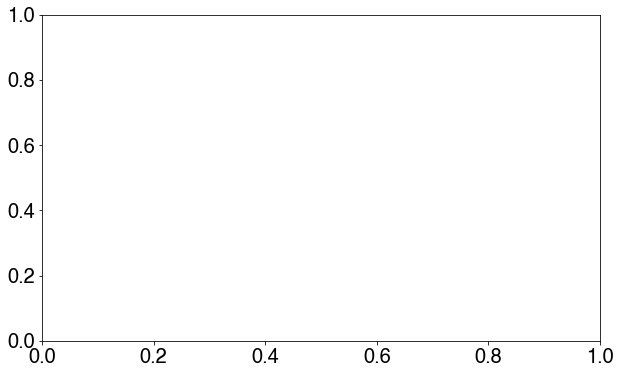

In [337]:
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.distplot(state_action_constrained)
ax.set(xlabel= 'g1', ylabel = 'Fraction of samples')
plt.show()

In [7]:
# Standardize data for C-network
X = state_action
y = constraint

scaler_X = StandardScaler().fit(X)
scaler_y = StandardScaler().fit(y)

# Get mean and std
x_mean_C = scaler_X.mean_
x_std_C  = scaler_X.scale_
y_mean_C = scaler_y.mean_
y_std_C  = scaler_y.scale_

# Scale x
X_scaled = np.zeros(X.shape)
for feature in range(len(x_mean_C)): 
    X_scaled[:,feature] = (X[:,feature] - x_mean_C[feature])/x_std_C[feature]

# Scale y
y_scaled = np.zeros(y.shape)
for feature in range(len(y_mean_C)): 
    y_scaled[:,feature] = (y[:,feature] - y_mean_C[feature])/y_std_C[feature]

# Convert into tensors
X_scaled = torch.tensor(X_scaled)
y_scaled = torch.tensor(y_scaled)
X_scaled, y_scaled

(tensor([[-1.2225, -0.7508, -1.1122,  1.5933,  1.5438, -1.6973],
         [-1.1876, -0.9145, -1.0451,  1.3036, -1.2106,  1.3047],
         [-1.1030,  0.8110, -0.9573,  1.0139, -0.0470, -0.1737],
         ...,
         [ 0.0895, -0.5538,  0.2966, -1.0139,  1.1633, -1.4227],
         [ 0.2236, -1.0868,  0.5425, -1.3036,  1.5381, -0.1076],
         [ 0.3786, -0.7957,  0.8057, -1.5933,  1.2677,  1.6662]],
        dtype=torch.float64),
 tensor([[ 0.6817],
         [ 0.6817],
         [ 0.6817],
         ...,
         [-0.4853],
         [-0.4853],
         [-0.4853]], dtype=torch.float64))

In [8]:
len(X_scaled), len(y_scaled)

(120000, 120000)

In [2720]:
C_net = torch.nn.Sequential(
        torch.nn.Linear(6, 200, bias = True), # 4 input nodes (Cx, Cn, Cq, t_f - t, u_L, u_Fn)
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 100, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(100, 50, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(50, 1, bias = True), # 1 output node
    ).double()

KeyboardInterrupt: 

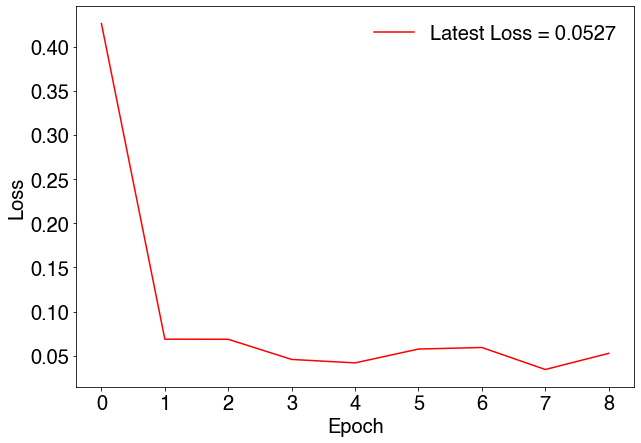

In [2721]:
# Define dataset
torch_dataset = torch.utils.data.TensorDataset(X_scaled, y_scaled)

optimizer = torch.optim.Adam(C_net.parameters(), lr = 1e-4, amsgrad= True) # Initialize Adam optimizer
loss_func = torch.nn.SmoothL1Loss()  # this is for regression mean squared loss

BATCH_SIZE = 200 # Batch size
EPOCH      = 500   # No. of epochs

# Splitting dataset into batches
loader = torch.utils.data.DataLoader(dataset     = torch_dataset, 
                         batch_size  = BATCH_SIZE, 
                         shuffle     = True, 
                         num_workers = 0)

# my_images = []  # For saving into gif
fig, ax = plt.subplots(figsize=(10,7))

epoch_list = [] # Save epoch for plotting
loss_list  = [] # Save loss for plotting

# Start training
for epoch in range(EPOCH):
    epoch_list += [epoch]
    for step, (batch_x, batch_y) in enumerate(loader): # for each training step

        prediction = C_net(batch_x.double())          # input x and predict based on x

        loss       = loss_func(prediction, batch_y) # must be (1. nn output, 2. target)

        optimizer.zero_grad()   # clear gradients for next train
        loss.backward()         # backpropagation, compute gradients
        optimizer.step()        # apply gradients

        if step == 1:
            # plot and show learning process
            plt.cla()
            loss_list += [loss.data.numpy()]
            plt.plot(epoch_list, loss_list, label = 'Latest Loss = %.4f' % loss.data.numpy(), color = 'r')
            plt.xlabel('Epoch', fontsize = 20)
            plt.ylabel('Loss', fontsize = 20)
            plt.xticks(fontsize = 20)
            plt.yticks(fontsize = 20)
            plt.legend(fontsize = 20, frameon= 0)
            
            display.clear_output(wait = True) #these two lines plots the data in real time
            display.display(fig)
            print('Current Epoch =', epoch)
            print('Latest Loss =', loss.data.numpy())

In [2982]:
# # Save neural network
# torch.save(C_net, './NN_models/CS1_g1_combined')

# # Load pre-trained neural network
# C_net = torch.load('./NN_models/CS1_g1_combined')
# C_net.eval()

Sequential(
  (0): Linear(in_features=6, out_features=200, bias=True)
  (1): LeakyReLU(negative_slope=0.01)
  (2): Linear(in_features=200, out_features=200, bias=True)
  (3): LeakyReLU(negative_slope=0.01)
  (4): Linear(in_features=200, out_features=100, bias=True)
  (5): LeakyReLU(negative_slope=0.01)
  (6): Linear(in_features=100, out_features=50, bias=True)
  (7): LeakyReLU(negative_slope=0.01)
  (8): Linear(in_features=50, out_features=1, bias=True)
)

Very poor prediction of first transition [1.0, 150.0, 0, 240, u_L, u_Fn] --> cannot predict -ve values of g1

In [2722]:
print('C_net predictions of g1:',  (C_net(X_scaled[0:200:12]).detach().numpy()*y_std_C)+y_mean_C   )
print('Actual labels:',  y[0:200:12]    )

C_net predictions of g1: [[ 68.30847823]
 [223.8894273 ]
 [249.08273835]
 [-44.26369902]
 [-23.26151276]
 [212.67551447]
 [110.63522971]
 [260.49809851]
 [158.26943597]
 [-75.86337383]
 [ 72.77031753]
 [272.74664661]
 [ 11.06322666]
 [131.90289765]
 [ 19.38509264]
 [ 18.08055606]
 [ 99.85810316]]
Actual labels: [[ 141.8362004 ]
 [ 418.92679176]
 [ 322.93719701]
 [   8.56222165]
 [-179.19137729]
 [ -32.7290947 ]
 [  30.38247942]
 [ 191.13255026]
 [ 139.52763807]
 [ 128.63778934]
 [ -11.91649799]
 [  38.54331732]
 [ 493.54916653]
 [ 261.33713038]
 [  32.84765783]
 [ -66.70844911]
 [  80.56748143]]


## Plotting state space and visualize violation of constraints

### Random **unconstrained** policy

In [236]:
# Generate data using random policy
plotting_state_data = []
for i in range(1000):
    episode = generate_random_episode(initial_state = [1.0,150.0,0,0]) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    for j in data:
        j = j[:-1]
        plotting_state_data += j  # Add datapoints to training set
# plotting_state_data
plotting_state_data = pd.DataFrame(plotting_state_data)
plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint

print('No. of states visited:',len(plotting_state_data))
print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

Cx_all = plotting_state_data[0]
Cn_all = plotting_state_data[1]
Cq_all = plotting_state_data[2]

Cx_g1 = plotting_state_data_g1_violated[0]
Cn_g1 = plotting_state_data_g1_violated[1]
Cq_g1 = plotting_state_data_g1_violated[2]

Cx_g2 = plotting_state_data_g2_violated[0]
Cn_g2 = plotting_state_data_g2_violated[1]
Cq_g2 = plotting_state_data_g2_violated[2]

Cx_g3 = plotting_state_data_g3_violated[0]
Cn_g3 = plotting_state_data_g3_violated[1]
Cq_g3 = plotting_state_data_g3_violated[2]

@interact(ns=(-90,90,0.1),ew=(-90,90,0.1))
def interact_poly(ns,ew):
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.xlabel('$C_x$', labelpad=30)
    plt.ylabel('$C_n$', labelpad=50)
    ax.set_zlabel('$C_q$', fontsize=20, labelpad=20)
    plt.legend()
    plt.xticks(rotation=90)
    plt.yticks(rotation=90)
    plt.xlim(0,16)
    plt.ylim(0,2200)
    ax.set_zlim(0, 0.25)
    ax.view_init(ns,ew)
    plt.show()

No. of states visited: 13000
No. of states where g1 violated: 1639
No. of states where g2 violated: 909
No. of states where g3 violated: 191


interactive(children=(FloatSlider(value=0.0, description='ns', max=90.0, min=-90.0), FloatSlider(value=0.0, de…

### Random **constrained** policy
Seems that a minimum threshold of 7.0625 is needed for actions to be accepted.

In [2463]:
# Generate data using random policy
plotting_state_data = []
for i in range(1000):
    episode = generate_random_episode_constrained(initial_state = [1.0,150.0,0,0], threshold = 0) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    for j in data:
        j = j[:-1]
        plotting_state_data += j  # Add datapoints to training set
# plotting_state_data
plotting_state_data = pd.DataFrame(plotting_state_data)
plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint

print('No. of states visited:',len(plotting_state_data))
print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

Cx_all = plotting_state_data[0]
Cn_all = plotting_state_data[1]
Cq_all = plotting_state_data[2]

Cx_g1 = plotting_state_data_g1_violated[0]
Cn_g1 = plotting_state_data_g1_violated[1]
Cq_g1 = plotting_state_data_g1_violated[2]

Cx_g2 = plotting_state_data_g2_violated[0]
Cn_g2 = plotting_state_data_g2_violated[1]
Cq_g2 = plotting_state_data_g2_violated[2]

Cx_g3 = plotting_state_data_g3_violated[0]
Cn_g3 = plotting_state_data_g3_violated[1]
Cq_g3 = plotting_state_data_g3_violated[2]

@interact(ns=(-90,90,0.1),ew=(-90,90,0.1))
def interact_poly(ns,ew):
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.title('States visited by random constrained policy')
    plt.xlabel('Cx', labelpad=20)
    plt.ylabel('Cn', labelpad=20)
    plt.legend()
    # plt.zlabel('Cq')
    ax.view_init(ns,ew)
    plt.show()

No. of states visited: 1300
No. of states where g1 violated: 0
No. of states where g2 violated: 44
No. of states where g3 violated: 36


interactive(children=(FloatSlider(value=0.0, description='ns', max=90.0, min=-90.0), FloatSlider(value=0.0, de…

### Trained **unconstrained** policy

In [2746]:
# Generate data using random policy
plotting_state_data = []
for i in range(1000):
    episode = generate_episode_with_NN(GA_optimize, [1.0, 150.0, 0, 0], epsilon = 0) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    for j in data:
        j = j[:-1]
        plotting_state_data += j  # Add datapoints to training set
# plotting_state_data
plotting_state_data = pd.DataFrame(plotting_state_data)
plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint

print('No. of states visited:',len(plotting_state_data))
print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

Cx_all = plotting_state_data[0]
Cn_all = plotting_state_data[1]
Cq_all = plotting_state_data[2]

Cx_g1 = plotting_state_data_g1_violated[0]
Cn_g1 = plotting_state_data_g1_violated[1]
Cq_g1 = plotting_state_data_g1_violated[2]

Cx_g2 = plotting_state_data_g2_violated[0]
Cn_g2 = plotting_state_data_g2_violated[1]
Cq_g2 = plotting_state_data_g2_violated[2]

Cx_g3 = plotting_state_data_g3_violated[0]
Cn_g3 = plotting_state_data_g3_violated[1]
Cq_g3 = plotting_state_data_g3_violated[2]

@interact(ns=(-90,90,0.1),ew=(-90,90,0.1))
def interact_poly(ns,ew):
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.xlabel('$C_x$', labelpad=20)
    plt.ylabel('$C_n$', labelpad=20)
    ax.set_zlabel('$C_q$', fontsize=20, labelpad=20)
    plt.legend()
    # plt.zlabel('Cq')
    ax.view_init(ns,ew)
    plt.show()

No. of states visited: 13000
No. of states where g1 violated: 5004
No. of states where g2 violated: 1000
No. of states where g3 violated: 0


interactive(children=(FloatSlider(value=0.0, description='ns', max=90.0, min=-90.0), FloatSlider(value=0.0, de…

### Trained **constrained** policy

In [253]:
# Generate data using random policy
plotting_state_data = []
for i in range(100):
    episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0,
                                      threshold = 0) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    for j in data:
        j = j[:-1]
        plotting_state_data += j  # Add datapoints to training set
# plotting_state_data
plotting_state_data = pd.DataFrame(plotting_state_data)
plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint

print('No. of states visited:',len(plotting_state_data))
print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

Cx_all = plotting_state_data[0]
Cn_all = plotting_state_data[1]
Cq_all = plotting_state_data[2]

Cx_g1 = plotting_state_data_g1_violated[0]
Cn_g1 = plotting_state_data_g1_violated[1]
Cq_g1 = plotting_state_data_g1_violated[2]

Cx_g2 = plotting_state_data_g2_violated[0]
Cn_g2 = plotting_state_data_g2_violated[1]
Cq_g2 = plotting_state_data_g2_violated[2]

Cx_g3 = plotting_state_data_g3_violated[0]
Cn_g3 = plotting_state_data_g3_violated[1]
Cq_g3 = plotting_state_data_g3_violated[2]

@interact(ns=(-90,90,0.1),ew=(-90,90,0.1))
def interact_poly(ns,ew):
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.xlabel('$C_x$', labelpad=20)
    plt.ylabel('$C_n$', labelpad=20)
    ax.set_zlabel('$C_q$', fontsize=20, labelpad=20)
    plt.legend()
    # plt.zlabel('Cq')
    ax.view_init(ns,ew)
    plt.show()

No. of states visited: 1300
No. of states where g1 violated: 3
No. of states where g2 violated: 100
No. of states where g3 violated: 0


interactive(children=(FloatSlider(value=0.0, description='ns', max=90.0, min=-90.0), FloatSlider(value=0.0, de…

### Method 2: Training Q-network and C-network simultaneously

In [11]:
# Initialize Q-network
Q_net = torch.nn.Sequential(
        torch.nn.Linear(6,   200, bias = True), # 6 input nodes
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200,   1, bias = True), # 1 output node
    ).double()
# Initialize C-network
C_net = torch.nn.Sequential(
        torch.nn.Linear(6, 200, bias = True), # 4 input nodes (Cx, Cn, Cq, t_f - t, u_L, u_Fn)
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 100, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(100, 50, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(50, 1, bias = True), # 1 output node
    ).double()

In [12]:
# ========== 1) GENERATING INITIAL BATCH OF SAMPLES FOR REPLAY BUFFER ==========
epsilon       = 0.99 # Initial epsilon
threshold     = 500  # Initial threshold
replay_buffer = collections.deque(maxlen = 3000) # Max capacity of 3k
g1_buffer     = collections.deque(maxlen = 30000) # Max capacity of 30k

for i in range(100): # Generate 100 episodes
    episode       = generate_episode_with_NN(NN = GA_optimize_constrained,
                                             initial_state = [1.0, 150.0, 0, 0],
                                             epsilon = epsilon, 
                                             threshold = threshold)
    episode_copy = copy.deepcopy(episode) # Copied to ensure same episodes are fed into Q and C
    replay_buffer = update_replay_buffer(replay_buffer, episode, discount_factor = 0.9) # Add to replay buffer
    g1_buffer     = update_g1_buffer(g1_buffer, episode_copy) # Add to g1 buffer
print('Initial size of replay buffer:', len(replay_buffer))
print('Initial size of g1 buffer:', len(g1_buffer))

# ================================= 2) TRAINING THE Q-NETWORK =================================
score_list         = [] # For plotting score of policy visited over time
iteration_list     = []
policy_mean_list   = [] # For plotting evolution of policy visited over time
policy_std_list    = [] # For plotting evolution of policy visited over time
training_loss_list = [] # For plotting loss of NN (after 20 epochs) over time
episode_bank       = [] # A list of list of lists - Tertiary list  -> Iterations
                        #                         - Secondary list -> Episodes
                        #                         - Primary list   -> Steps
                        #                         For plotting evolution of states visited over time            

for iteration in range(1000):
    # SCORE EXISTING POLICY
    print('=========== TRAINING ITERATION %.0f ===========' % iteration)
    print('Current epsilon = ', epsilon)
    print('Current threshold = ', threshold)
    current_score = score_NN_policy(GA_optimize_constrained, 
                                    initial_state = [1.0, 150.0, 0, 0], 
                                    num_iterations = 3, 
                                    get_control = False, 
                                    threshold = threshold)
    print('AVERAGE SCORE = ', current_score)
    print('')
    
    # GENERATE EPISODES & ADD TO REPLAY BUFFER
    for j in range(100):
        episode       = generate_episode_with_NN(NN = GA_optimize_constrained,
                                             initial_state = [1.0, 150.0, 0, 0],
                                             epsilon = epsilon, 
                                             threshold = threshold)
        episode_copy = copy.deepcopy(episode) # Copied to ensure same episodes are fed into Q and C
        replay_buffer = update_replay_buffer(replay_buffer, episode, discount_factor = 0.9) # Add to replay buffer
        g1_buffer     = update_g1_buffer(g1_buffer, episode_copy) # Add to g1 buffer
    
    # === TRAIN Q_NETWORK NETWORK ===
    combined_inputs_Q  = [] # List of lists to be converted into input tensor
    combined_targets_Q = [] # List to be converted into target tensor
    samples_Q          = random.sample(replay_buffer, 100) # Draw random samples from replay buffer
    
    for inputs, target in samples_Q:
        combined_inputs_Q  += [inputs]
        combined_targets_Q += [[target]]
    combined_inputs_Q  = torch.tensor(combined_inputs_Q).double()  # Convert list to tensor
    combined_targets_Q = torch.tensor(combined_targets_Q).double() # Convert list to tensor

    Q_optimizer = torch.optim.Adam(Q_net.parameters(), lr=1e-3) # Initialize Adam optimizer
    loss_func = torch.nn.SmoothL1Loss()                     # Define loss function
    
    for epoch in range(20):
        prediction = Q_net(combined_inputs_Q)                    # Input x and predict based on x
        Q_loss       = loss_func(prediction, combined_targets_Q) # Must be (1. nn output, 2. target)

        Q_optimizer.zero_grad()   # Clear gradients for next train
        Q_loss.backward()         # Backpropagation, compute gradients
        Q_optimizer.step()        # Apply gradients
#         print('Epoch = ', epoch, 'Loss = %.4f' % Q_loss.data.numpy())
    
    # === TRAIN C_NETWORK NETWORK ===
    combined_inputs_C  = [] # List of lists to be converted into input tensor
    combined_targets_C = [] # List to be converted into target tensor
    samples_C          = random.sample(g1_buffer, 500) # Draw random samples from replay buffer
    
    for inputs, target in samples_C:
        combined_inputs_C  += [inputs]
        combined_targets_C += [[target]]

    combined_inputs_C  = torch.tensor(combined_inputs_C).double()  # Convert list to tensor
    combined_targets_C = torch.tensor(combined_targets_C).double() # Convert list to tensor

    C_optimizer = torch.optim.Adam(C_net.parameters(), lr=1e-4) # Initialize Adam optimizer
    loss_func = torch.nn.SmoothL1Loss()                     # Define loss function
    
    for epoch in range(10):
        prediction = C_net(combined_inputs_C)                    # Input x and predict based on x
        C_loss     = loss_func(prediction, combined_targets_C) # Must be (1. nn output, 2. target)

        C_optimizer.zero_grad()   # Clear gradients for next train
        C_loss.backward()         # Backpropagation, compute gradients
        C_optimizer.step()        # Apply gradients
#         print('Epoch = ', epoch, 'Loss = %.4f' % Q_loss.data.numpy())

    score_list         += [current_score] # Store score for each iteration
    training_loss_list += [Q_loss.data.numpy()]                                # Store training loss after 20 epochs for each iteration
    iteration_list     += [iteration]                                        # Store iteration
    
#     # INVESTIGATING EVOLUTION OF POLICY OVER TRAINING ITERATIONS
#     if iteration in np.arange(0,5000,10): # Every 10 iterations
#         list_of_policies  = score_NN_policy(GA_optimize, [1.0, 150.0, 0, 0], num_iterations = 100, get_control = True)[1] # add policies
#         policy_mean       = np.mean(list_of_policies, axis = 0) # Calculate mean of policies
#         policy_std        = np.std(list_of_policies, axis = 0)  # Calculate std of policies
#         policy_mean_list += [policy_mean] # Save mean policy for plotting
#         policy_std_list  += [policy_std]  # Save std of policy for plotting
    
    # INVESTIGATING EVOLUTION OF STATES VISITED OVER TRAINING ITERATIONS
    if iteration in np.arange(0, 5000, 10): # Every 10 iterations
        pool_of_episodes = [] # A *list of lists* of episodes
        for i in range(10):   # Generate 10 sample episodes and store them
            pool_of_episodes += [generate_episode_with_NN(NN = GA_optimize_constrained,
                                             initial_state = [1.0, 150.0, 0, 0],
                                             epsilon = 0, 
                                             threshold = threshold)]
        episode_bank         += [pool_of_episodes]
    
    epsilon *= 0.99 # Decay epsilon
    threshold *= 0.995 # Decay threshold

Initial size of replay buffer: 1300
Initial size of g1 buffer: 1200
=========== TRAINING ITERATION 0 ===========
Current epsilon =  0.99
Current threshold =  500
AVERAGE SCORE =  0.047721316485822944

=========== TRAINING ITERATION 1 ===========
Current epsilon =  0.9801
Current threshold =  497.5
AVERAGE SCORE =  0.19352532787044976

=========== TRAINING ITERATION 2 ===========
Current epsilon =  0.9702989999999999
Current threshold =  495.0125
AVERAGE SCORE =  0.18181130522748193

=========== TRAINING ITERATION 3 ===========
Current epsilon =  0.96059601
Current threshold =  492.5374375
AVERAGE SCORE =  0.19133402428466506

=========== TRAINING ITERATION 4 ===========
Current epsilon =  0.9509900498999999
Current threshold =  490.0747503125
AVERAGE SCORE =  0.17161228983137752

=========== TRAINING ITERATION 5 ===========
Current epsilon =  0.9414801494009999
Current threshold =  487.6243765609375
AVERAGE SCORE =  0.17270762769672385

=========== TRAINING ITERATION 6 ===========
Curr

AVERAGE SCORE =  0.16726251466531417

=========== TRAINING ITERATION 52 ===========
Current epsilon =  0.5870367819374844
Current threshold =  385.27444465594095
AVERAGE SCORE =  0.1275000875327299

=========== TRAINING ITERATION 53 ===========
Current epsilon =  0.5811664141181095
Current threshold =  383.34807243266124
AVERAGE SCORE =  0.1737720556577509

=========== TRAINING ITERATION 54 ===========
Current epsilon =  0.5753547499769285
Current threshold =  381.43133207049794
AVERAGE SCORE =  0.1860097943324197

=========== TRAINING ITERATION 55 ===========
Current epsilon =  0.5696012024771592
Current threshold =  379.52417541014546
AVERAGE SCORE =  0.18421848065918275

=========== TRAINING ITERATION 56 ===========
Current epsilon =  0.5639051904523876
Current threshold =  377.62655453309475
AVERAGE SCORE =  0.15150114124522673

=========== TRAINING ITERATION 57 ===========
Current epsilon =  0.5582661385478638
Current threshold =  375.7384217604293
AVERAGE SCORE =  0.1651788356837

AVERAGE SCORE =  0.1586713498054544

=========== TRAINING ITERATION 103 ===========
Current epsilon =  0.3516092065580223
Current threshold =  298.36461850239954
AVERAGE SCORE =  0.1433080795244026

=========== TRAINING ITERATION 104 ===========
Current epsilon =  0.34809311449244207
Current threshold =  296.87279540988754
AVERAGE SCORE =  0.15034528601963484

=========== TRAINING ITERATION 105 ===========
Current epsilon =  0.34461218334751764
Current threshold =  295.3884314328381
AVERAGE SCORE =  0.1018254064586475

=========== TRAINING ITERATION 106 ===========
Current epsilon =  0.34116606151404244
Current threshold =  293.9114892756739
AVERAGE SCORE =  0.17589623665347665

=========== TRAINING ITERATION 107 ===========
Current epsilon =  0.337754400898902
Current threshold =  292.4419318292955
AVERAGE SCORE =  0.17211426782611253

=========== TRAINING ITERATION 108 ===========
Current epsilon =  0.334376856889913
Current threshold =  290.97972217014905
AVERAGE SCORE =  0.15733049

AVERAGE SCORE =  0.17707638107215176

=========== TRAINING ITERATION 154 ===========
Current epsilon =  0.21059844619672854
Current threshold =  231.0598245195853
AVERAGE SCORE =  0.16559607074725244

=========== TRAINING ITERATION 155 ===========
Current epsilon =  0.20849246173476127
Current threshold =  229.90452539698737
AVERAGE SCORE =  0.1692558702452657

=========== TRAINING ITERATION 156 ===========
Current epsilon =  0.20640753711741366
Current threshold =  228.75500277000242
AVERAGE SCORE =  0.17940822834361755

=========== TRAINING ITERATION 157 ===========
Current epsilon =  0.20434346174623952
Current threshold =  227.6112277561524
AVERAGE SCORE =  0.00998458161925314

=========== TRAINING ITERATION 158 ===========
Current epsilon =  0.20230002712877712
Current threshold =  226.47317161737163
AVERAGE SCORE =  0.17047578909292724

=========== TRAINING ITERATION 159 ===========
Current epsilon =  0.20027702685748935
Current threshold =  225.34080575928476
AVERAGE SCORE =  0.

=========== TRAINING ITERATION 204 ===========
Current epsilon =  0.12741333767875881
Current threshold =  179.8367628576701
AVERAGE SCORE =  0.15161705117527388

=========== TRAINING ITERATION 205 ===========
Current epsilon =  0.12613920430197123
Current threshold =  178.93757904338173
AVERAGE SCORE =  0.16455427789780364

=========== TRAINING ITERATION 206 ===========
Current epsilon =  0.12487781225895152
Current threshold =  178.0428911481648
AVERAGE SCORE =  0.18170287944368543

=========== TRAINING ITERATION 207 ===========
Current epsilon =  0.123629034136362
Current threshold =  177.152676692424
AVERAGE SCORE =  0.16571360258649498

=========== TRAINING ITERATION 208 ===========
Current epsilon =  0.12239274379499838
Current threshold =  176.26691330896188
AVERAGE SCORE =  0.027824766800490435

=========== TRAINING ITERATION 209 ===========
Current epsilon =  0.1211688163570484
Current threshold =  175.38557874241707
AVERAGE SCORE =  0.15878710417683953

=========== TRAINING I

AVERAGE SCORE =  0.1739540307521691

=========== TRAINING ITERATION 255 ===========
Current epsilon =  0.07631498390659384
Current threshold =  139.26936470092664
AVERAGE SCORE =  0.1782533029649128

=========== TRAINING ITERATION 256 ===========
Current epsilon =  0.07555183406752791
Current threshold =  138.57301787742202
AVERAGE SCORE =  0.1428961643474913

=========== TRAINING ITERATION 257 ===========
Current epsilon =  0.07479631572685264
Current threshold =  137.8801527880349
AVERAGE SCORE =  0.16972453649933716

=========== TRAINING ITERATION 258 ===========
Current epsilon =  0.07404835256958411
Current threshold =  137.19075202409473
AVERAGE SCORE =  0.018926317859883274

=========== TRAINING ITERATION 259 ===========
Current epsilon =  0.07330786904388827
Current threshold =  136.50479826397427
AVERAGE SCORE =  0.1659064051322048

=========== TRAINING ITERATION 260 ===========
Current epsilon =  0.07257479035344938
Current threshold =  135.8222742726544
AVERAGE SCORE =  0.17

=========== TRAINING ITERATION 305 ===========
Current epsilon =  0.04617102827699272
Current threshold =  108.39509536170345
AVERAGE SCORE =  0.1774958828507649

=========== TRAINING ITERATION 306 ===========
Current epsilon =  0.045709317994222794
Current threshold =  107.85311988489494
AVERAGE SCORE =  0.17328296541429045

=========== TRAINING ITERATION 307 ===========
Current epsilon =  0.04525222481428057
Current threshold =  107.31385428547046
AVERAGE SCORE =  0.16107671962036

=========== TRAINING ITERATION 308 ===========
Current epsilon =  0.04479970256613776
Current threshold =  106.7772850140431
AVERAGE SCORE =  0.16030888356477083

=========== TRAINING ITERATION 309 ===========
Current epsilon =  0.04435170554047638
Current threshold =  106.24339858897288
AVERAGE SCORE =  0.16194721441599277

=========== TRAINING ITERATION 310 ===========
Current epsilon =  0.043908188485071616
Current threshold =  105.71218159602802
AVERAGE SCORE =  0.16457963981128645

=========== TRAININ

AVERAGE SCORE =  0.17124871761088098

=========== TRAINING ITERATION 356 ===========
Current epsilon =  0.027654414711223735
Current threshold =  83.94343752544343
AVERAGE SCORE =  0.1700036436675412

=========== TRAINING ITERATION 357 ===========
Current epsilon =  0.027377870564111496
Current threshold =  83.52372033781621
AVERAGE SCORE =  0.17513624968626149

=========== TRAINING ITERATION 358 ===========
Current epsilon =  0.027104091858470382
Current threshold =  83.10610173612713
AVERAGE SCORE =  0.17598279419245247

=========== TRAINING ITERATION 359 ===========
Current epsilon =  0.026833050939885677
Current threshold =  82.6905712274465
AVERAGE SCORE =  0.16977858363272988

=========== TRAINING ITERATION 360 ===========
Current epsilon =  0.02656472043048682
Current threshold =  82.27711837130927
AVERAGE SCORE =  0.1596142471625127

=========== TRAINING ITERATION 361 ===========
Current epsilon =  0.02629907322618195
Current threshold =  81.86573277945273
AVERAGE SCORE =  0.17

=========== TRAINING ITERATION 406 ===========
Current epsilon =  0.016731088683427906
Current threshold =  65.33423150955961
AVERAGE SCORE =  0.17107717462747365

=========== TRAINING ITERATION 407 ===========
Current epsilon =  0.016563777796593626
Current threshold =  65.00756035201182
AVERAGE SCORE =  0.16758005681045876

=========== TRAINING ITERATION 408 ===========
Current epsilon =  0.016398140018627688
Current threshold =  64.68252255025176
AVERAGE SCORE =  0.1658826948060267

=========== TRAINING ITERATION 409 ===========
Current epsilon =  0.01623415861844141
Current threshold =  64.3591099375005
AVERAGE SCORE =  0.16799248617459828

=========== TRAINING ITERATION 410 ===========
Current epsilon =  0.016071817032256998
Current threshold =  64.037314387813
AVERAGE SCORE =  0.17461307943495105

=========== TRAINING ITERATION 411 ===========
Current epsilon =  0.01591109886193443
Current threshold =  63.71712781587393
AVERAGE SCORE =  0.17779682917445175

=========== TRAINING I

AVERAGE SCORE =  0.17831858240880213

=========== TRAINING ITERATION 457 ===========
Current epsilon =  0.01002118606165716
Current threshold =  50.59620052636839
AVERAGE SCORE =  0.17600516432894375

=========== TRAINING ITERATION 458 ===========
Current epsilon =  0.009920974201040588
Current threshold =  50.34321952373655
AVERAGE SCORE =  0.17699697102453651

=========== TRAINING ITERATION 459 ===========
Current epsilon =  0.009821764459030182
Current threshold =  50.09150342611787
AVERAGE SCORE =  0.17718338277785595

=========== TRAINING ITERATION 460 ===========
Current epsilon =  0.00972354681443988
Current threshold =  49.841045908987276
AVERAGE SCORE =  0.17113137298782546

=========== TRAINING ITERATION 461 ===========
Current epsilon =  0.00962631134629548
Current threshold =  49.59184067944234
AVERAGE SCORE =  0.17654959652713778

=========== TRAINING ITERATION 462 ===========
Current epsilon =  0.009530048232832525
Current threshold =  49.34388147604513
AVERAGE SCORE =  0

=========== TRAINING ITERATION 507 ===========
Current epsilon =  0.006062878367216695
Current threshold =  39.379658209635565
AVERAGE SCORE =  0.17722083082614648

=========== TRAINING ITERATION 508 ===========
Current epsilon =  0.006002249583544528
Current threshold =  39.18275991858739
AVERAGE SCORE =  0.17669656714911244

=========== TRAINING ITERATION 509 ===========
Current epsilon =  0.005942227087709083
Current threshold =  38.98684611899445
AVERAGE SCORE =  0.1780965125425286

=========== TRAINING ITERATION 510 ===========
Current epsilon =  0.005882804816831992
Current threshold =  38.791911888399476
AVERAGE SCORE =  0.15728631093178772

=========== TRAINING ITERATION 511 ===========
Current epsilon =  0.005823976768663672
Current threshold =  38.597952328957476
AVERAGE SCORE =  0.1776538466450819

=========== TRAINING ITERATION 512 ===========
Current epsilon =  0.005765737000977035
Current threshold =  38.40496256731269
AVERAGE SCORE =  0.1767963886058922

=========== TRAI

=========== TRAINING ITERATION 557 ===========
Current epsilon =  0.0036680781964830204
Current threshold =  30.649682477630584
AVERAGE SCORE =  0.1742851159641676

=========== TRAINING ITERATION 558 ===========
Current epsilon =  0.00363139741451819
Current threshold =  30.496434065242433
AVERAGE SCORE =  0.17617886998028687

=========== TRAINING ITERATION 559 ===========
Current epsilon =  0.003595083440373008
Current threshold =  30.34395189491622
AVERAGE SCORE =  0.17436352148301748

=========== TRAINING ITERATION 560 ===========
Current epsilon =  0.003559132605969278
Current threshold =  30.19223213544164
AVERAGE SCORE =  0.17603756362846065

=========== TRAINING ITERATION 561 ===========
Current epsilon =  0.003523541279909585
Current threshold =  30.04127097476443
AVERAGE SCORE =  0.1596212551861694

=========== TRAINING ITERATION 562 ===========
Current epsilon =  0.003488305867110489
Current threshold =  29.891064619890606
AVERAGE SCORE =  0.17696520241898997

=========== TRA

AVERAGE SCORE =  0.17211652862410545

=========== TRAINING ITERATION 607 ===========
Current epsilon =  0.002219209563607139
Current threshold =  23.85503274250661
AVERAGE SCORE =  0.17277209895253098

=========== TRAINING ITERATION 608 ===========
Current epsilon =  0.0021970174679710676
Current threshold =  23.735757578794075
AVERAGE SCORE =  0.17443164368246614

=========== TRAINING ITERATION 609 ===========
Current epsilon =  0.0021750472932913567
Current threshold =  23.617078790900106
AVERAGE SCORE =  0.17411126809239277

=========== TRAINING ITERATION 610 ===========
Current epsilon =  0.0021532968203584434
Current threshold =  23.498993396945604
AVERAGE SCORE =  0.17583407861296155

=========== TRAINING ITERATION 611 ===========
Current epsilon =  0.002131763852154859
Current threshold =  23.381498429960875
AVERAGE SCORE =  0.17303964433720417

=========== TRAINING ITERATION 612 ===========
Current epsilon =  0.0021104462136333105
Current threshold =  23.26459093781107
AVERAGE 

AVERAGE SCORE =  0.17581340098898157

=========== TRAINING ITERATION 657 ===========
Current epsilon =  0.001342635250231964
Current threshold =  18.5666715327765
AVERAGE SCORE =  0.17492185814820158

=========== TRAINING ITERATION 658 ===========
Current epsilon =  0.0013292088977296444
Current threshold =  18.47383817511262
AVERAGE SCORE =  0.17494511848194838

=========== TRAINING ITERATION 659 ===========
Current epsilon =  0.001315916808752348
Current threshold =  18.381468984237056
AVERAGE SCORE =  0.173071739744299

=========== TRAINING ITERATION 660 ===========
Current epsilon =  0.0013027576406648245
Current threshold =  18.28956163931587
AVERAGE SCORE =  0.17576564639588887

=========== TRAINING ITERATION 661 ===========
Current epsilon =  0.0012897300642581763
Current threshold =  18.19811383111929
AVERAGE SCORE =  0.17603808178582137

=========== TRAINING ITERATION 662 ===========
Current epsilon =  0.0012768327636155945
Current threshold =  18.107123261963693
AVERAGE SCORE

AVERAGE SCORE =  0.17560874731898346

=========== TRAINING ITERATION 707 ===========
Current epsilon =  0.0008123024723430627
Current threshold =  14.450673596928835
AVERAGE SCORE =  0.17672428087873002

=========== TRAINING ITERATION 708 ===========
Current epsilon =  0.000804179447619632
Current threshold =  14.378420228944192
AVERAGE SCORE =  0.17456590153152307

=========== TRAINING ITERATION 709 ===========
Current epsilon =  0.0007961376531434358
Current threshold =  14.30652812779947
AVERAGE SCORE =  0.17716017521814723

=========== TRAINING ITERATION 710 ===========
Current epsilon =  0.0007881762766120013
Current threshold =  14.234995487160473
AVERAGE SCORE =  0.1746969193580099

=========== TRAINING ITERATION 711 ===========
Current epsilon =  0.0007802945138458813
Current threshold =  14.16382050972467
AVERAGE SCORE =  0.17710935827444088

=========== TRAINING ITERATION 712 ===========
Current epsilon =  0.0007724915687074225
Current threshold =  14.093001407176047
AVERAGE 

AVERAGE SCORE =  0.17426845821283435

=========== TRAINING ITERATION 757 ===========
Current epsilon =  0.0004914479241183735
Current threshold =  11.247140718589993
AVERAGE SCORE =  0.17098362455611105

=========== TRAINING ITERATION 758 ===========
Current epsilon =  0.00048653344487718976
Current threshold =  11.190905014997043
AVERAGE SCORE =  0.17423114762938466

=========== TRAINING ITERATION 759 ===========
Current epsilon =  0.00048166811042841786
Current threshold =  11.134950489922057
AVERAGE SCORE =  0.16894274086055916

=========== TRAINING ITERATION 760 ===========
Current epsilon =  0.0004768514293241337
Current threshold =  11.079275737472447
AVERAGE SCORE =  0.1734220299209667

=========== TRAINING ITERATION 761 ===========
Current epsilon =  0.00047208291503089234
Current threshold =  11.023879358785084
AVERAGE SCORE =  0.17559426323014646

=========== TRAINING ITERATION 762 ===========
Current epsilon =  0.0004673620858805834
Current threshold =  10.968759961991159
AV

AVERAGE SCORE =  0.17625450404389184

=========== TRAINING ITERATION 807 ===========
Current epsilon =  0.0002973289757737636
Current threshold =  8.753790852396625
AVERAGE SCORE =  0.17650857792799746

=========== TRAINING ITERATION 808 ===========
Current epsilon =  0.000294355686016026
Current threshold =  8.710021898134642
AVERAGE SCORE =  0.16968451466060733

=========== TRAINING ITERATION 809 ===========
Current epsilon =  0.00029141212915586575
Current threshold =  8.666471788643967
AVERAGE SCORE =  0.17640255070693148

=========== TRAINING ITERATION 810 ===========
Current epsilon =  0.00028849800786430707
Current threshold =  8.623139429700748
AVERAGE SCORE =  0.1752665890965349

=========== TRAINING ITERATION 811 ===========
Current epsilon =  0.000285613027785664
Current threshold =  8.580023732552243
AVERAGE SCORE =  0.17683328413923446

=========== TRAINING ITERATION 812 ===========
Current epsilon =  0.0002827568975078074
Current threshold =  8.537123613889483
AVERAGE SCO

AVERAGE SCORE =  0.1771389062161199

=========== TRAINING ITERATION 857 ===========
Current epsilon =  0.00017988583427891656
Current threshold =  6.813185342372905
AVERAGE SCORE =  0.17545330370014048

=========== TRAINING ITERATION 858 ===========
Current epsilon =  0.0001780869759361274
Current threshold =  6.77911941566104
AVERAGE SCORE =  0.17675269400595942

=========== TRAINING ITERATION 859 ===========
Current epsilon =  0.00017630610617676613
Current threshold =  6.745223818582735
AVERAGE SCORE =  0.17556742177122997

=========== TRAINING ITERATION 860 ===========
Current epsilon =  0.00017454304511499847
Current threshold =  6.711497699489821
AVERAGE SCORE =  0.17701807243758627

=========== TRAINING ITERATION 861 ===========
Current epsilon =  0.0001727976146638485
Current threshold =  6.6779402109923724
AVERAGE SCORE =  0.17621881220633098

=========== TRAINING ITERATION 862 ===========
Current epsilon =  0.00017106963851721
Current threshold =  6.64455050993741
AVERAGE SCO

AVERAGE SCORE =  0.1751306688219231

=========== TRAINING ITERATION 907 ===========
Current epsilon =  0.00010883202113084194
Current threshold =  5.302787705604847
AVERAGE SCORE =  0.17483581389988004

=========== TRAINING ITERATION 908 ===========
Current epsilon =  0.00010774370091953352
Current threshold =  5.276273767076822
AVERAGE SCORE =  0.17579472818190892

=========== TRAINING ITERATION 909 ===========
Current epsilon =  0.00010666626391033817
Current threshold =  5.249892398241438
AVERAGE SCORE =  0.17407528520869173

=========== TRAINING ITERATION 910 ===========
Current epsilon =  0.00010559960127123479
Current threshold =  5.223642936250231
AVERAGE SCORE =  0.17594136681576725

=========== TRAINING ITERATION 911 ===========
Current epsilon =  0.00010454360525852244
Current threshold =  5.19752472156898
AVERAGE SCORE =  0.17569773977225114

=========== TRAINING ITERATION 912 ===========
Current epsilon =  0.00010349816920593722
Current threshold =  5.171537097961135
AVERAG

AVERAGE SCORE =  0.1729454500626896

=========== TRAINING ITERATION 957 ===========
Current epsilon =  6.584403308299988e-05
Current threshold =  4.127226258741461
AVERAGE SCORE =  0.1740106490622655

=========== TRAINING ITERATION 958 ===========
Current epsilon =  6.518559275216988e-05
Current threshold =  4.106590127447754
AVERAGE SCORE =  0.17565513364917362

=========== TRAINING ITERATION 959 ===========
Current epsilon =  6.453373682464818e-05
Current threshold =  4.086057176810516
AVERAGE SCORE =  0.17399491827585276

=========== TRAINING ITERATION 960 ===========
Current epsilon =  6.388839945640171e-05
Current threshold =  4.065626890926463
AVERAGE SCORE =  0.1754382419635101

=========== TRAINING ITERATION 961 ===========
Current epsilon =  6.324951546183769e-05
Current threshold =  4.045298756471831
AVERAGE SCORE =  0.1744461858742765

=========== TRAINING ITERATION 962 ===========
Current epsilon =  6.261702030721931e-05
Current threshold =  4.025072262689472
AVERAGE SCORE 

KeyboardInterrupt: 

In [266]:
# Save neural network
# torch.save(Q_net, './NN_models/CS1_Q_net_g1_constrained')
# # Save neural network
# torch.save(C_net, './NN_models/CS1_C_net_g1_constrained')

# Load pre-trained neural network
# Q_net = torch.load('./NN_models/CS1_Q_net_g1_constrained')
# Q_net.eval()
# # Load pre-trained neural network
# C_net = torch.load('./NN_models/CS1_C_net_g1_constrained')
# C_net.eval()

Sequential(
  (0): Linear(in_features=6, out_features=200, bias=True)
  (1): LeakyReLU(negative_slope=0.01)
  (2): Linear(in_features=200, out_features=200, bias=True)
  (3): LeakyReLU(negative_slope=0.01)
  (4): Linear(in_features=200, out_features=100, bias=True)
  (5): LeakyReLU(negative_slope=0.01)
  (6): Linear(in_features=100, out_features=50, bias=True)
  (7): LeakyReLU(negative_slope=0.01)
  (8): Linear(in_features=50, out_features=1, bias=True)
)

## Plot objective score and Q-network loss

No handles with labels found to put in legend.


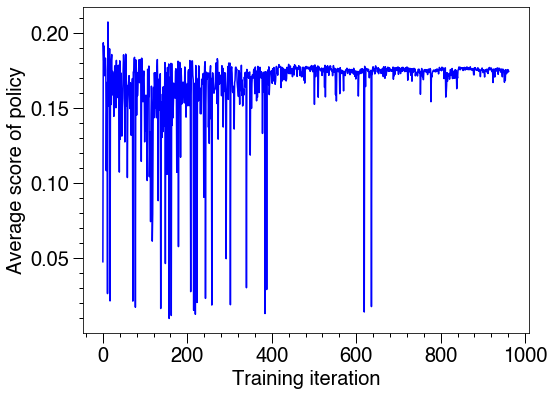

No handles with labels found to put in legend.


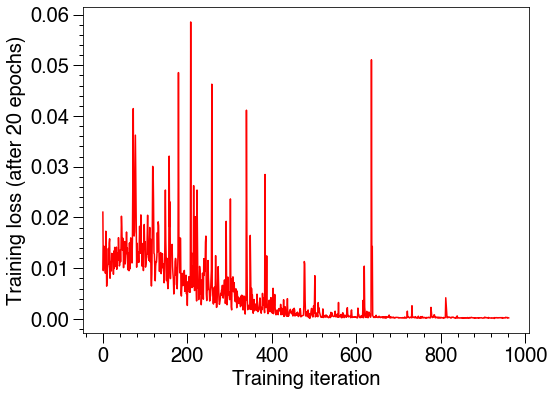

In [16]:
# Save data
# with open('./Data/CS1_score_g1_constrained_1000_ep', 'wb') as f:
#     pickle.dump(score_list, f, pickle.HIGHEST_PROTOCOL)
# with open('./Data/CS1_loss_g1_constrained_1000_ep', 'wb') as f:
#     pickle.dump(training_loss_list, f, pickle.HIGHEST_PROTOCOL)

# Load pre-run data
# with open('./Data/CS1_score_g1_constrained_1000_ep', 'rb') as f:
#     score_list = pickle.load(f)
# with open('./Data/CS1_loss_g1_constrained_1000_ep', 'rb') as f:
#     training_loss_list = pickle.load(f)

# Plot score vs. training iteration
fig, ax = plt.subplots(figsize=(8,6))
ax.minorticks_on()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))
ax.yaxis.set_minor_locator(AutoMinorLocator(5))
ax.tick_params(which='major', length=10, width=1, direction='out')
ax.tick_params(which='minor', length=4, width=1, direction='out')
plt.plot(iteration_list, score_list, color = 'b')
plt.legend(frameon =  0)
plt.ylabel('Average score of policy', fontsize = 20)
plt.xlabel('Training iteration', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

# Plot training loss vs. training iteration
fig, ax = plt.subplots(figsize=(8,6))
ax.minorticks_on()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))
ax.yaxis.set_minor_locator(AutoMinorLocator(5))
ax.tick_params(which='major', length=10, width=1, direction='out')
ax.tick_params(which='minor', length=4, width=1, direction='out')
plt.plot(iteration_list, training_loss_list, color = 'r')
plt.legend(frameon =  0)
plt.ylabel('Training loss (after 20 epochs)', fontsize = 20)
plt.xlabel('Training iteration', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

In [14]:
# Generate threshold
threshold_list = []
threshold = 500
for i in range(1000):
    threshold_list += [threshold]
    threshold *= 0.995
threshold_list[::10]

[500,
 475.55506523288597,
 452.3052401373088,
 430.192095957348,
 409.16006051133706,
 389.15627853432085,
 370.13047884835214,
 352.0348480268148,
 334.823910235282,
 318.45441294693893,
 302.8852182453639,
 288.0771994415018,
 273.9931427450209,
 260.59765374294375,
 247.85706845052525,
 235.7393687108428,
 224.21410173048835,
 213.2523035491506,
 202.826426250759,
 192.91026873326567,
 183.47891086308343,
 174.50865084870497,
 165.9769456761176,
 157.86235445632255,
 150.14448454258687,
 142.80394028201587,
 135.8222742726544,
 129.18194100362217,
 122.86625276177672,
 116.85933769409394,
 111.14609992037336,
 105.71218159602802,
 100.54392682961958,
 95.62834736446052,
 90.9530899380382,
 86.50640523723263,
 82.27711837130927,
 78.25460078848369,
 74.4287435654816,
 70.78993200296865,
 67.32902146300664,
 64.037314387813,
 60.90653844207047,
 57.9288257238562,
 55.09669299194584,
 52.403022859802185,
 49.841045908987276,
 47.404323677047415,
 45.086732477118254,
 42.88244800858729

## Plot evolution of state space into gif

No. of states visited: 130
No. of states where g1 violated: 60
No. of states where g2 violated: 10
No. of states where g3 violated: 0


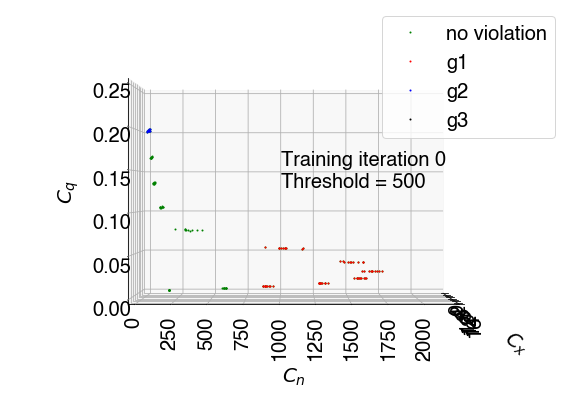

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 36
No. of states where g3 violated: 6


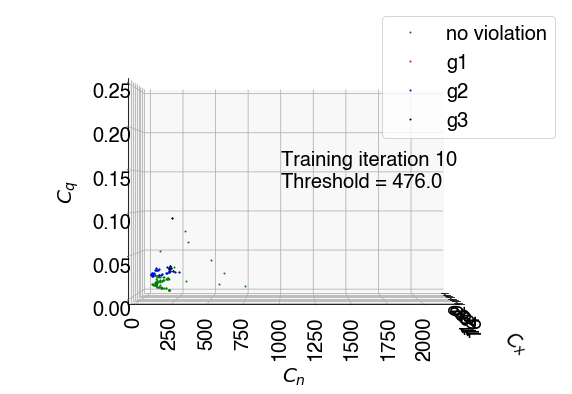

No. of states visited: 130
No. of states where g1 violated: 51
No. of states where g2 violated: 10
No. of states where g3 violated: 0


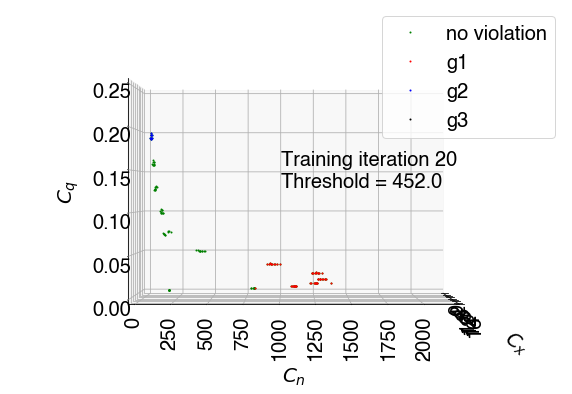

No. of states visited: 130
No. of states where g1 violated: 24
No. of states where g2 violated: 0
No. of states where g3 violated: 4


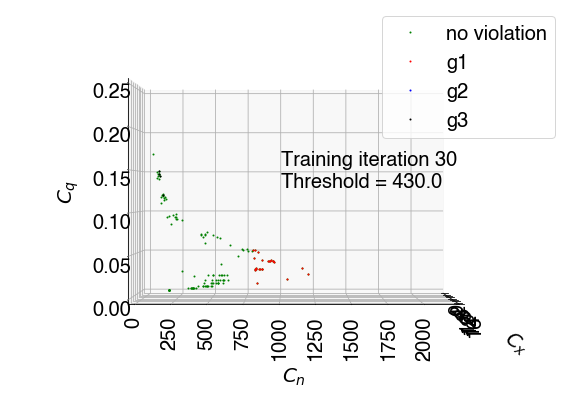

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 0
No. of states where g3 violated: 0


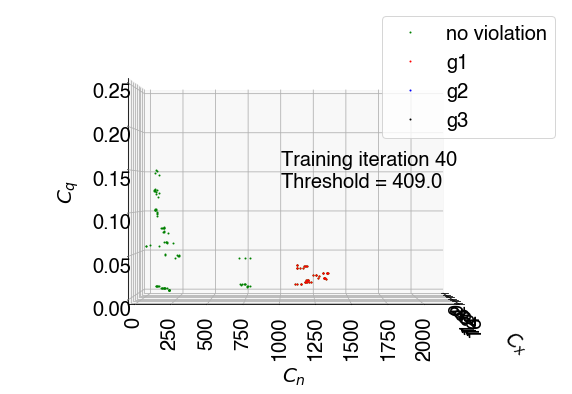

No. of states visited: 130
No. of states where g1 violated: 54
No. of states where g2 violated: 20
No. of states where g3 violated: 0


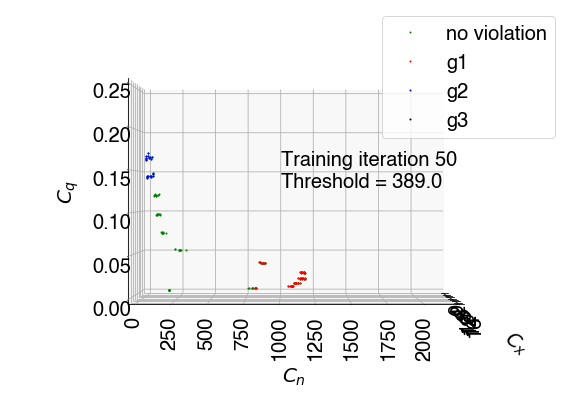

No. of states visited: 130
No. of states where g1 violated: 50
No. of states where g2 violated: 4
No. of states where g3 violated: 0


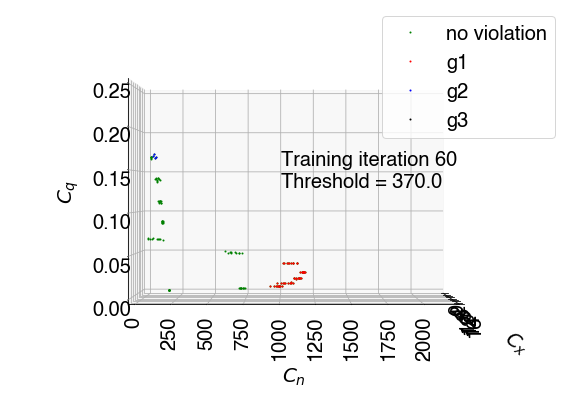

No. of states visited: 130
No. of states where g1 violated: 2
No. of states where g2 violated: 17
No. of states where g3 violated: 4


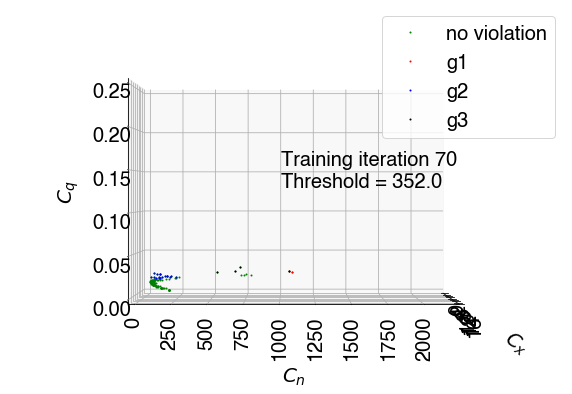

No. of states visited: 130
No. of states where g1 violated: 39
No. of states where g2 violated: 10
No. of states where g3 violated: 0


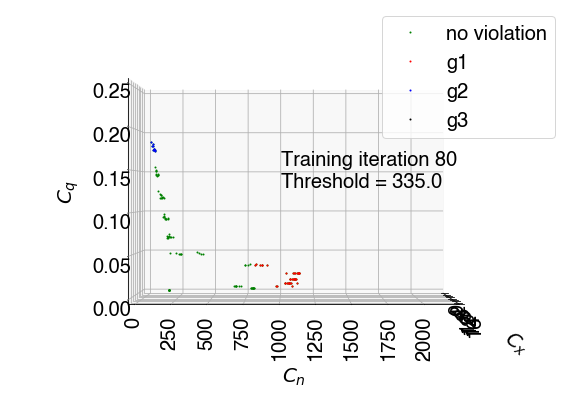

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 10


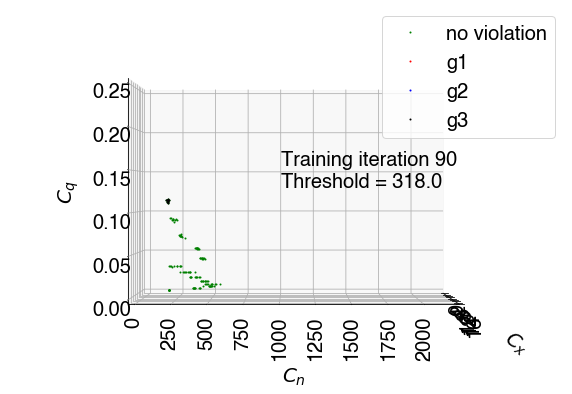

No. of states visited: 130
No. of states where g1 violated: 6
No. of states where g2 violated: 9
No. of states where g3 violated: 10


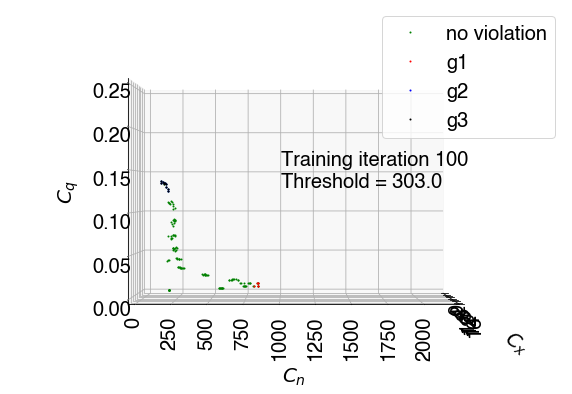

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 20
No. of states where g3 violated: 0


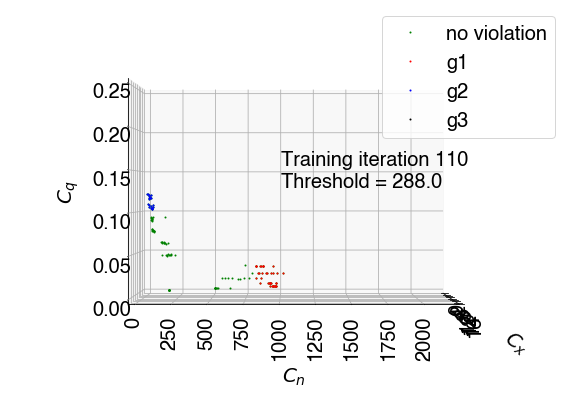

No. of states visited: 130
No. of states where g1 violated: 48
No. of states where g2 violated: 0
No. of states where g3 violated: 0


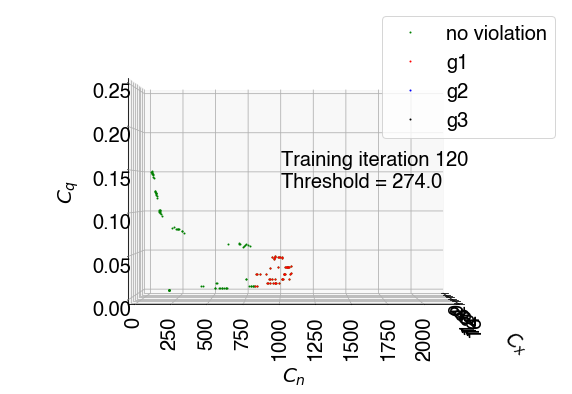

No. of states visited: 130
No. of states where g1 violated: 2
No. of states where g2 violated: 0
No. of states where g3 violated: 8


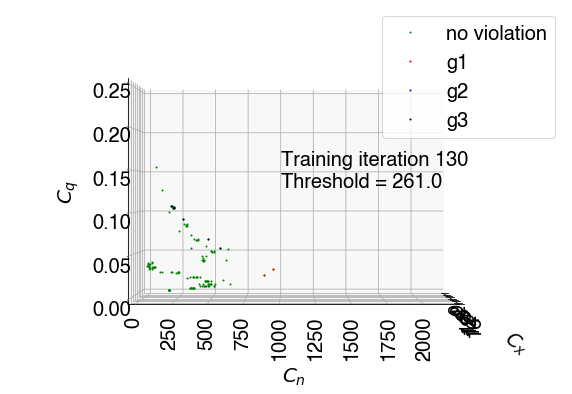

No. of states visited: 130
No. of states where g1 violated: 27
No. of states where g2 violated: 9
No. of states where g3 violated: 2


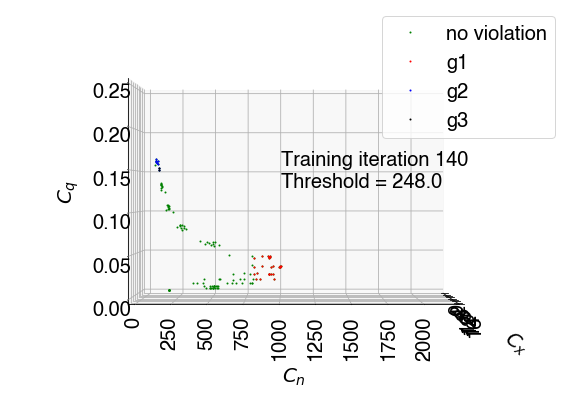

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 0


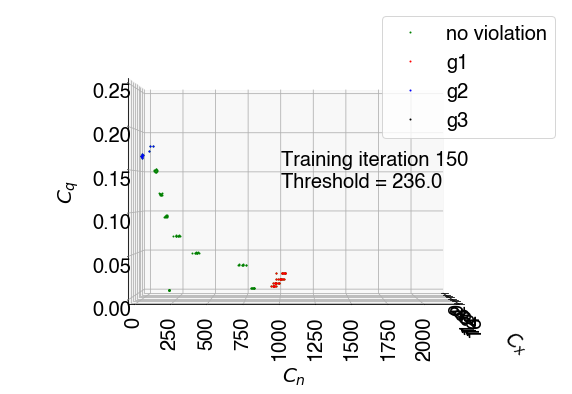

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 0


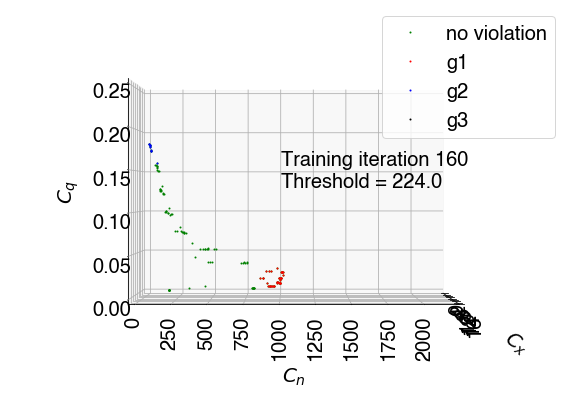

No. of states visited: 130
No. of states where g1 violated: 35
No. of states where g2 violated: 10
No. of states where g3 violated: 5


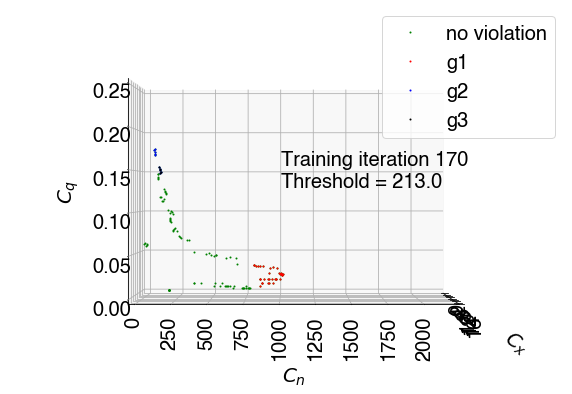

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 0
No. of states where g3 violated: 0


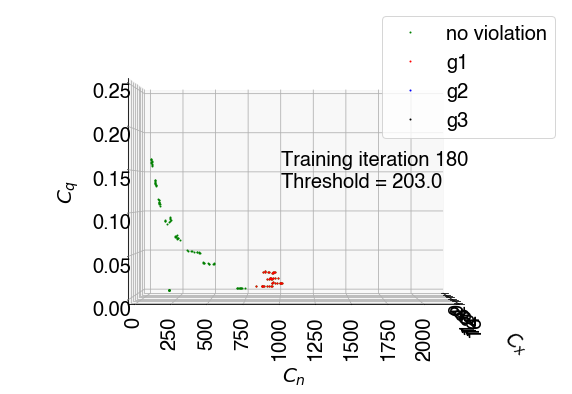

No. of states visited: 130
No. of states where g1 violated: 47
No. of states where g2 violated: 10
No. of states where g3 violated: 0


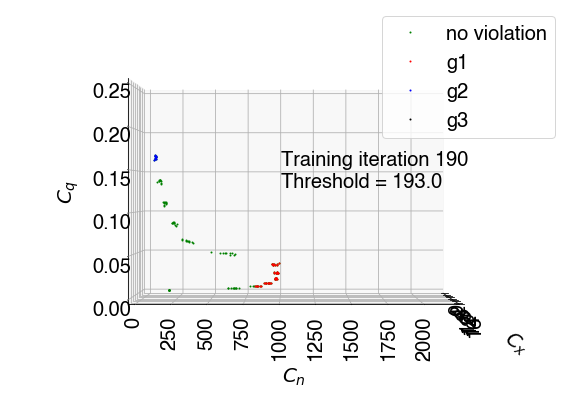

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 2


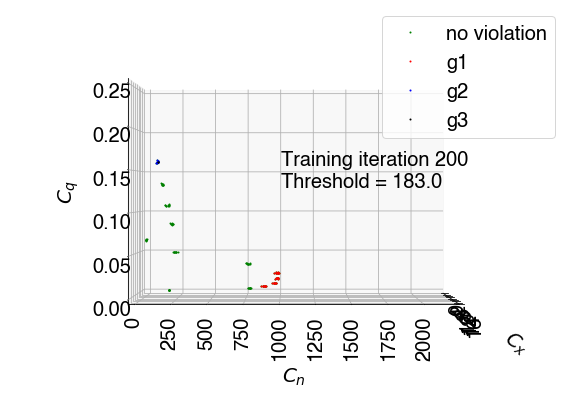

No. of states visited: 130
No. of states where g1 violated: 47
No. of states where g2 violated: 10
No. of states where g3 violated: 0


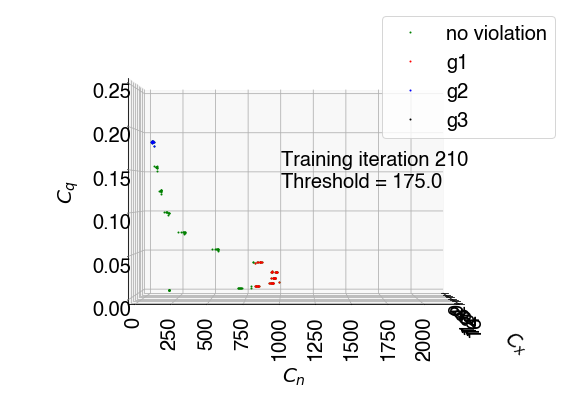

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 0


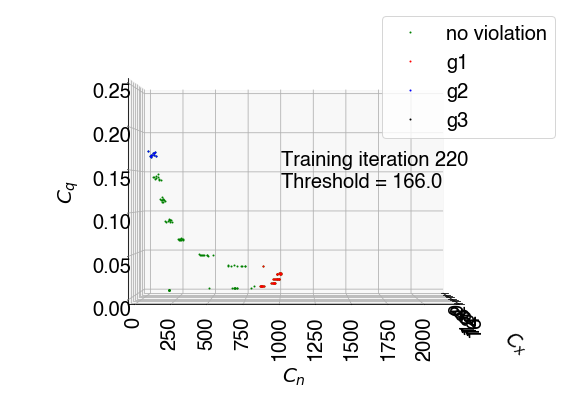

No. of states visited: 130
No. of states where g1 violated: 11
No. of states where g2 violated: 2
No. of states where g3 violated: 7


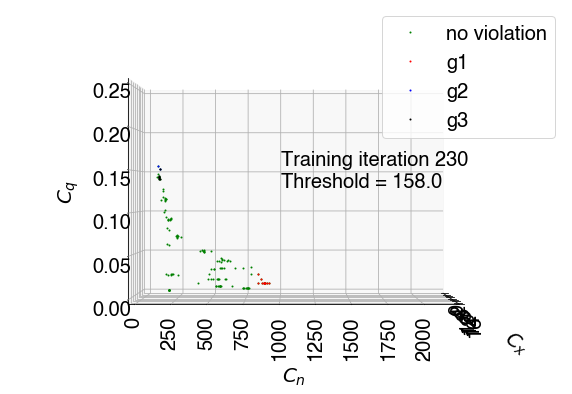

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


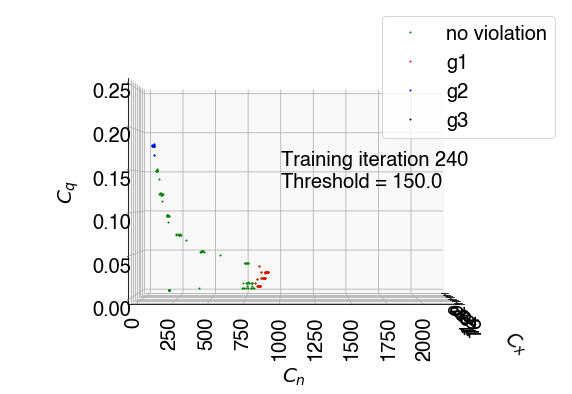

No. of states visited: 130
No. of states where g1 violated: 44
No. of states where g2 violated: 8
No. of states where g3 violated: 0


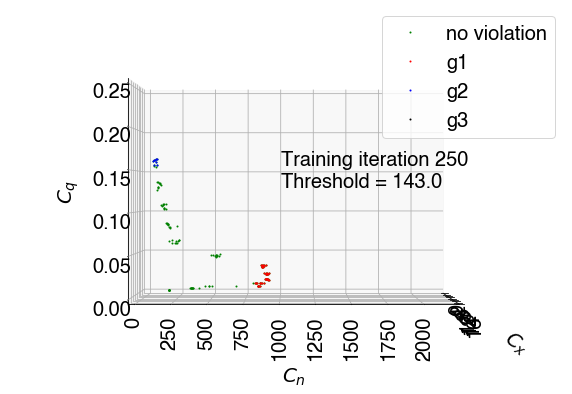

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


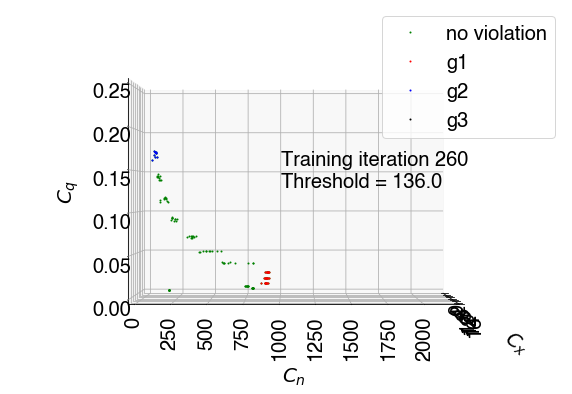

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 0


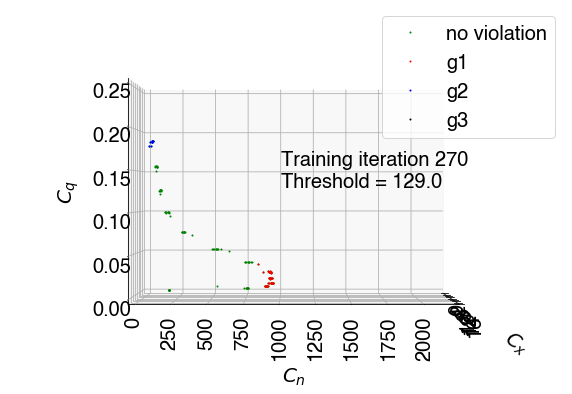

No. of states visited: 130
No. of states where g1 violated: 50
No. of states where g2 violated: 6
No. of states where g3 violated: 0


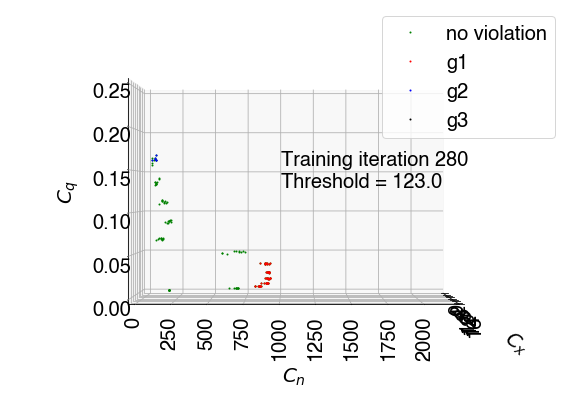

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


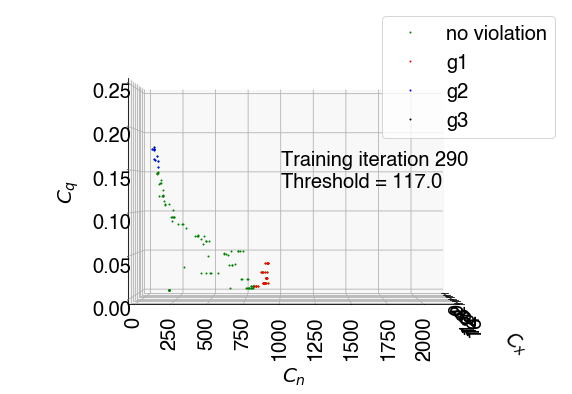

No. of states visited: 130
No. of states where g1 violated: 34
No. of states where g2 violated: 10
No. of states where g3 violated: 0


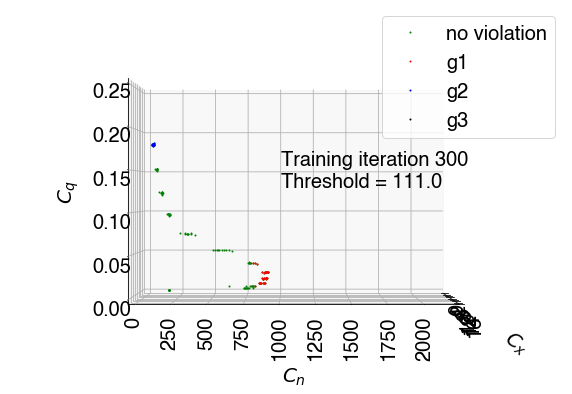

No. of states visited: 130
No. of states where g1 violated: 24
No. of states where g2 violated: 4
No. of states where g3 violated: 0


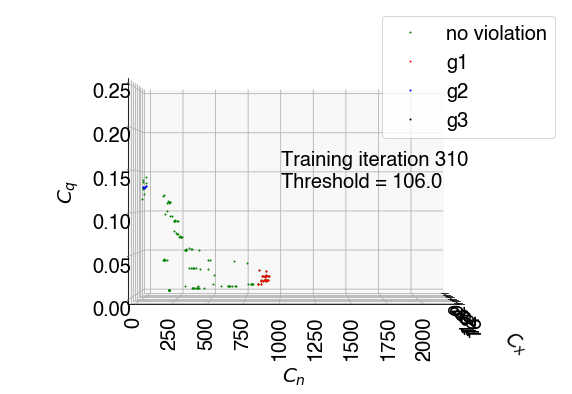

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 1
No. of states where g3 violated: 0


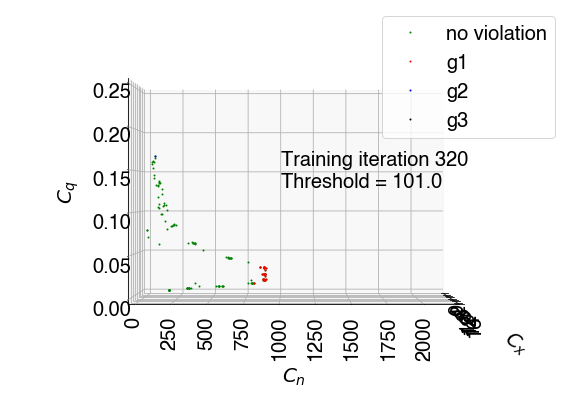

No. of states visited: 130
No. of states where g1 violated: 38
No. of states where g2 violated: 0
No. of states where g3 violated: 0


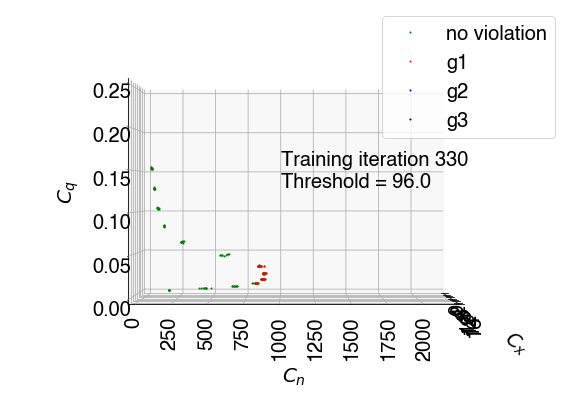

No. of states visited: 130
No. of states where g1 violated: 37
No. of states where g2 violated: 10
No. of states where g3 violated: 0


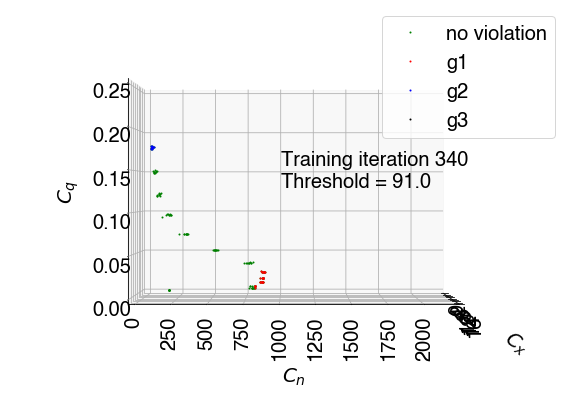

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


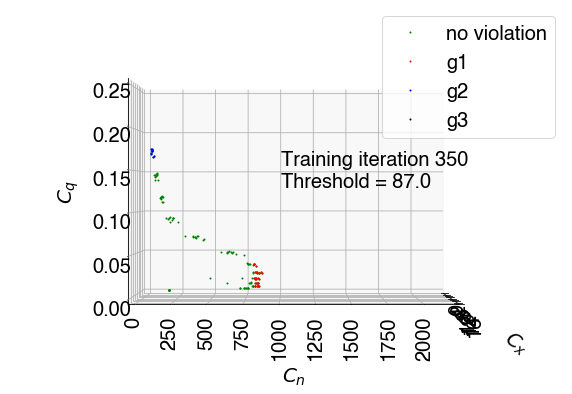

No. of states visited: 130
No. of states where g1 violated: 36
No. of states where g2 violated: 10
No. of states where g3 violated: 0


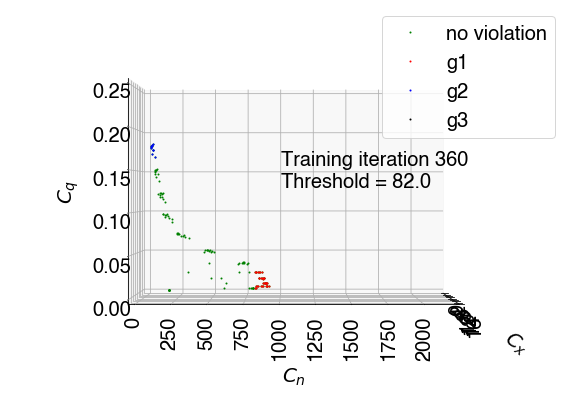

No. of states visited: 130
No. of states where g1 violated: 39
No. of states where g2 violated: 10
No. of states where g3 violated: 0


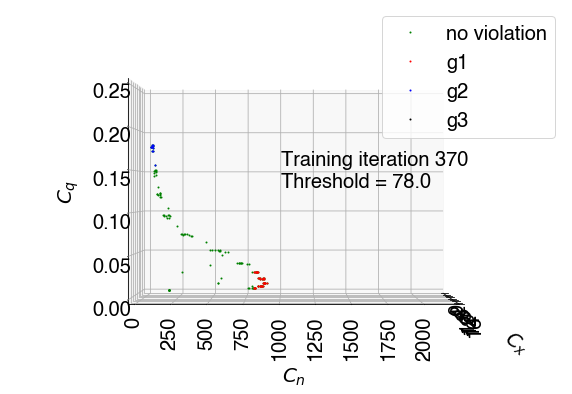

No. of states visited: 130
No. of states where g1 violated: 25
No. of states where g2 violated: 9
No. of states where g3 violated: 0


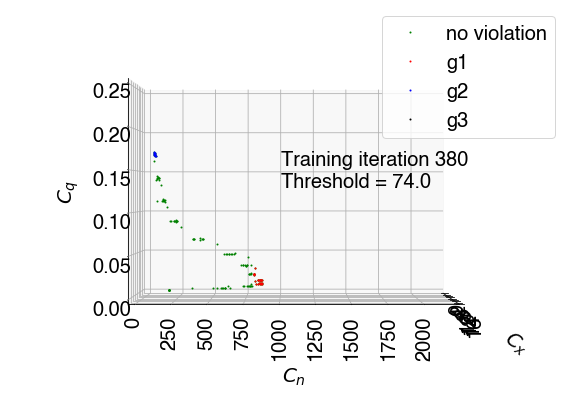

No. of states visited: 130
No. of states where g1 violated: 39
No. of states where g2 violated: 10
No. of states where g3 violated: 0


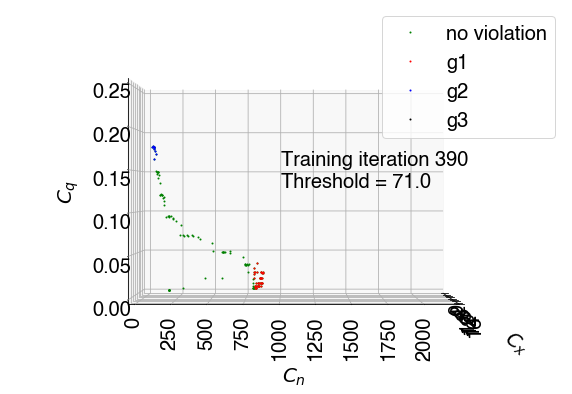

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


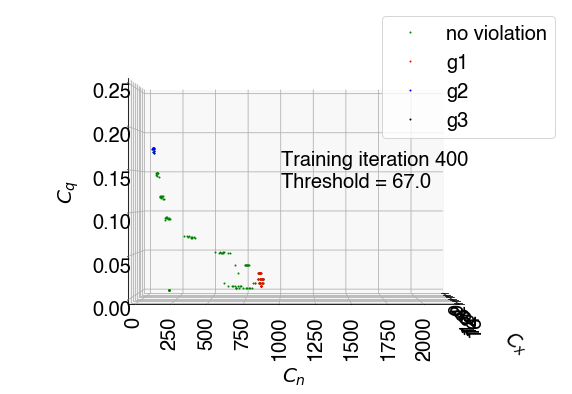

No. of states visited: 130
No. of states where g1 violated: 39
No. of states where g2 violated: 10
No. of states where g3 violated: 0


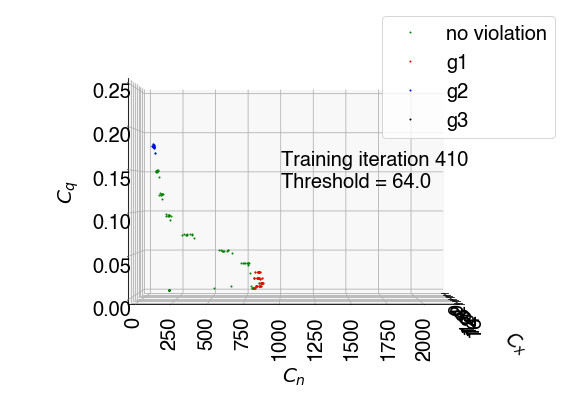

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 0


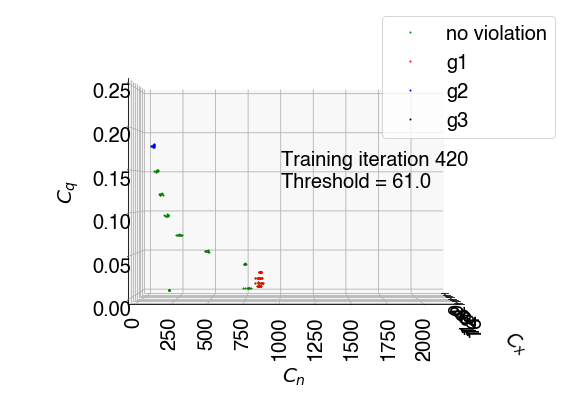

No. of states visited: 130
No. of states where g1 violated: 36
No. of states where g2 violated: 10
No. of states where g3 violated: 0


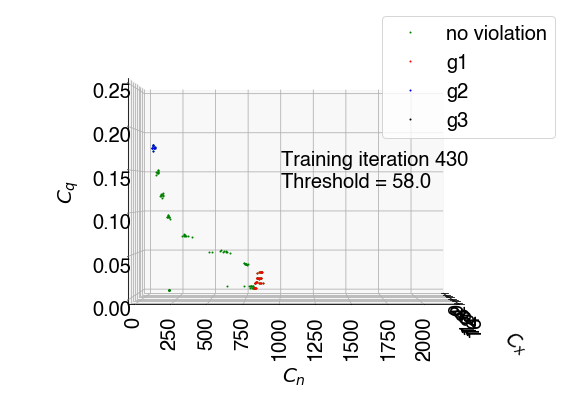

No. of states visited: 130
No. of states where g1 violated: 29
No. of states where g2 violated: 10
No. of states where g3 violated: 0


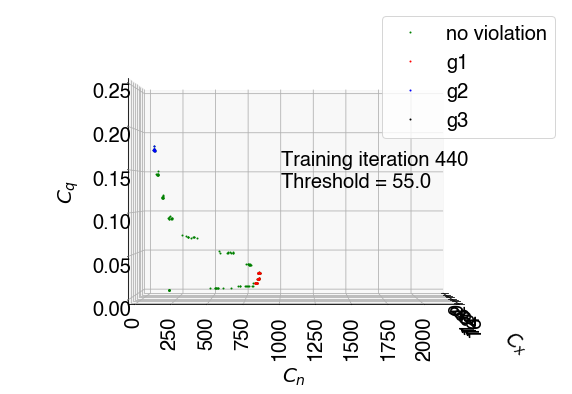

No. of states visited: 130
No. of states where g1 violated: 29
No. of states where g2 violated: 10
No. of states where g3 violated: 0


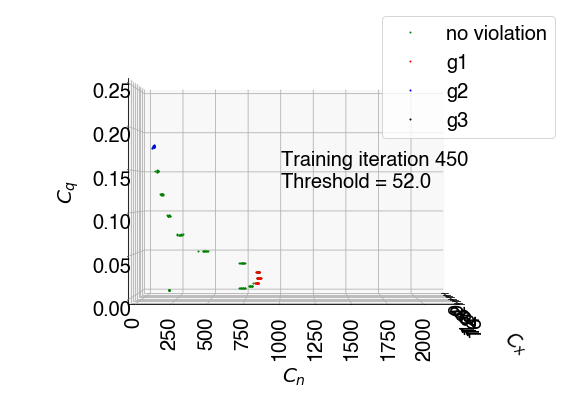

No. of states visited: 130
No. of states where g1 violated: 28
No. of states where g2 violated: 10
No. of states where g3 violated: 0


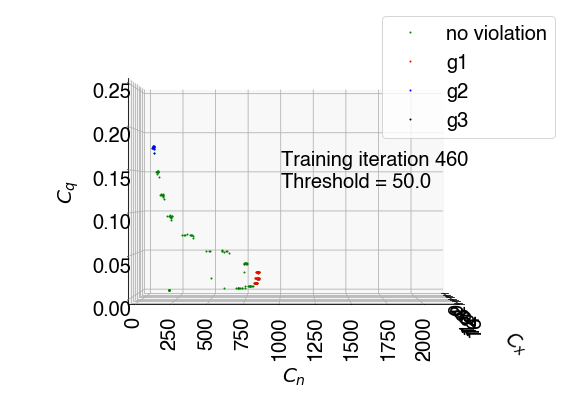

No. of states visited: 130
No. of states where g1 violated: 18
No. of states where g2 violated: 10
No. of states where g3 violated: 0


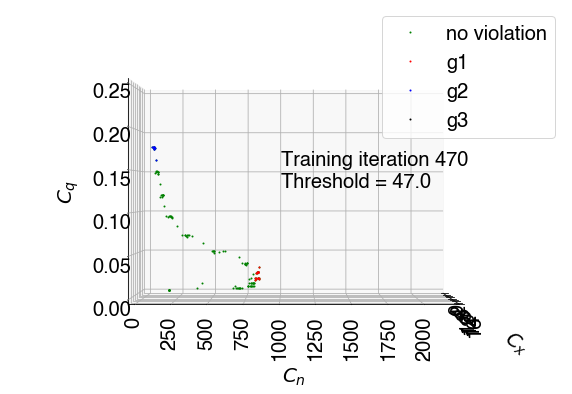

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


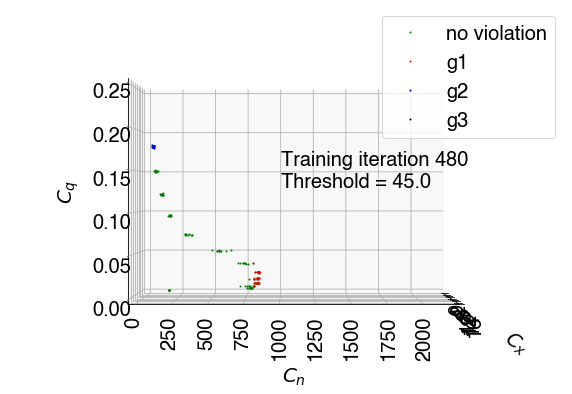

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


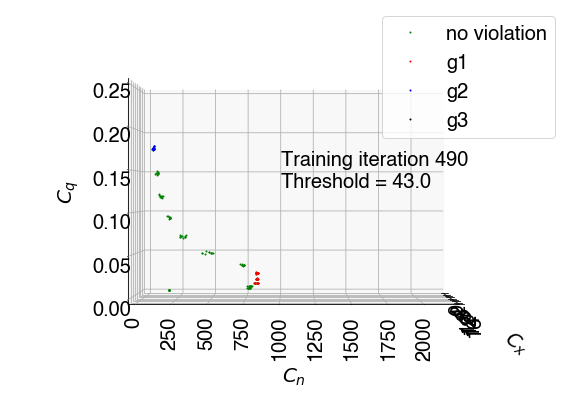

No. of states visited: 130
No. of states where g1 violated: 19
No. of states where g2 violated: 0
No. of states where g3 violated: 0


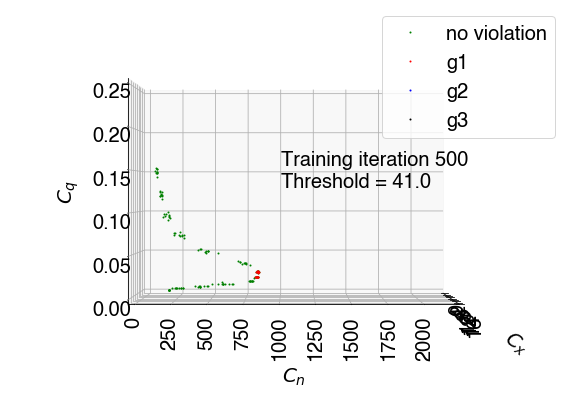

No. of states visited: 130
No. of states where g1 violated: 29
No. of states where g2 violated: 10
No. of states where g3 violated: 0


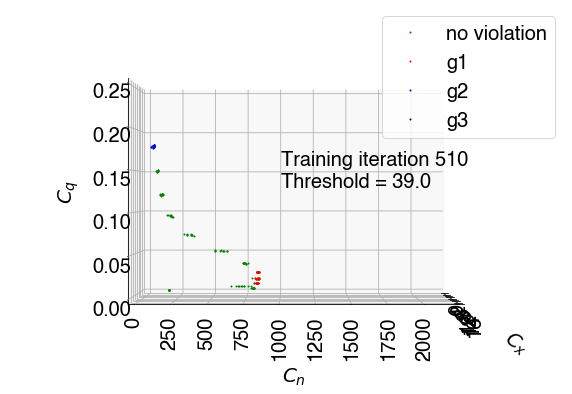

No. of states visited: 130
No. of states where g1 violated: 28
No. of states where g2 violated: 9
No. of states where g3 violated: 0


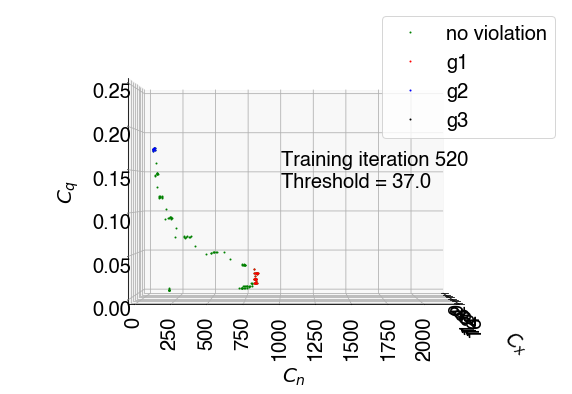

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


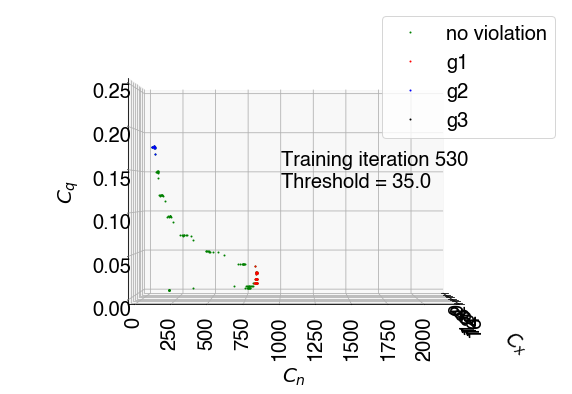

No. of states visited: 130
No. of states where g1 violated: 23
No. of states where g2 violated: 10
No. of states where g3 violated: 0


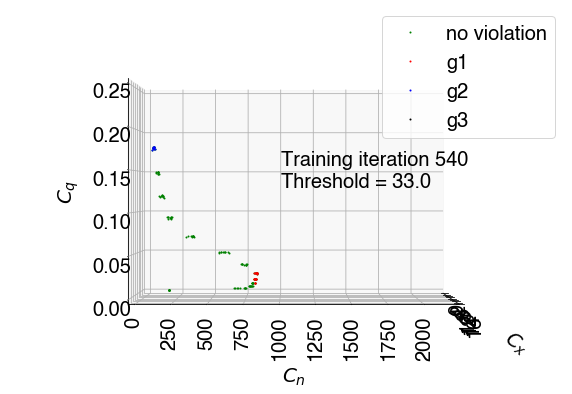

No. of states visited: 130
No. of states where g1 violated: 31
No. of states where g2 violated: 9
No. of states where g3 violated: 0


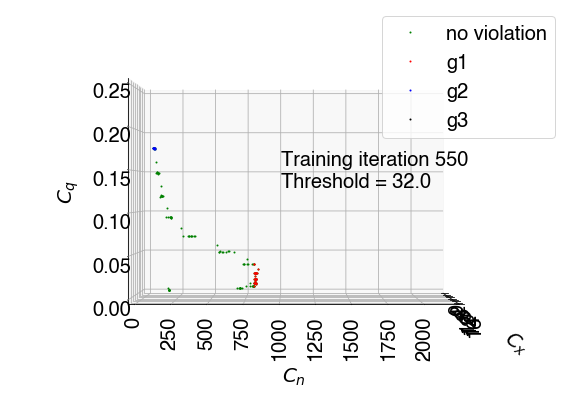

No. of states visited: 130
No. of states where g1 violated: 24
No. of states where g2 violated: 1
No. of states where g3 violated: 0


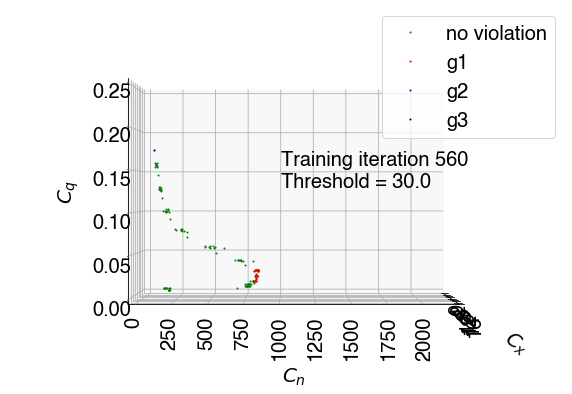

No. of states visited: 130
No. of states where g1 violated: 26
No. of states where g2 violated: 9
No. of states where g3 violated: 0


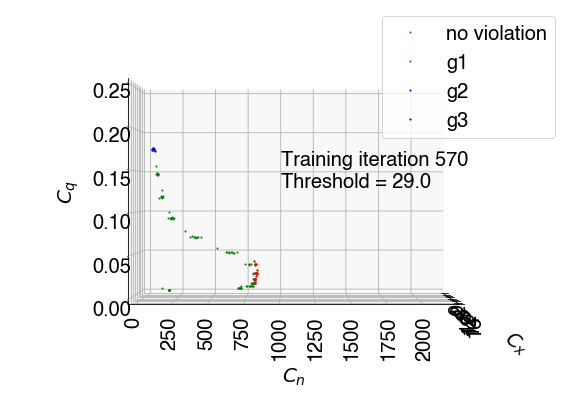

No. of states visited: 130
No. of states where g1 violated: 26
No. of states where g2 violated: 10
No. of states where g3 violated: 0


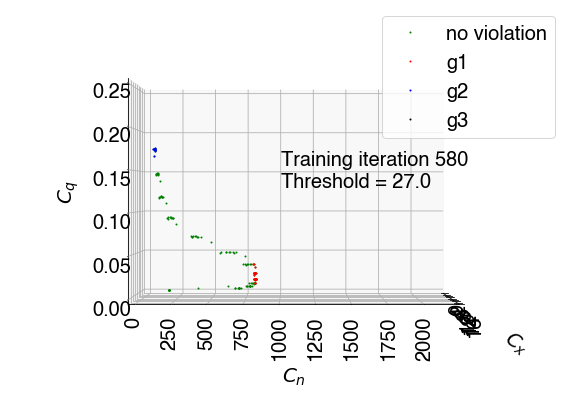

No. of states visited: 130
No. of states where g1 violated: 15
No. of states where g2 violated: 9
No. of states where g3 violated: 0


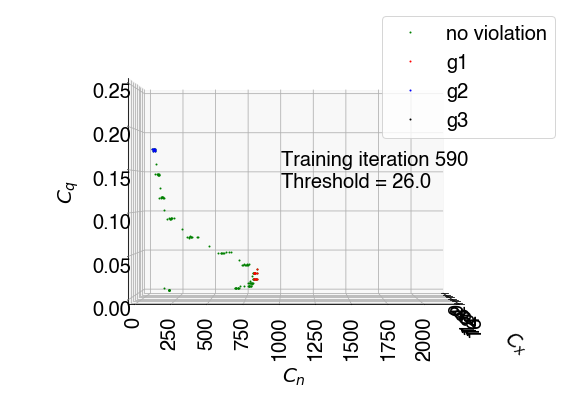

No. of states visited: 130
No. of states where g1 violated: 15
No. of states where g2 violated: 10
No. of states where g3 violated: 0


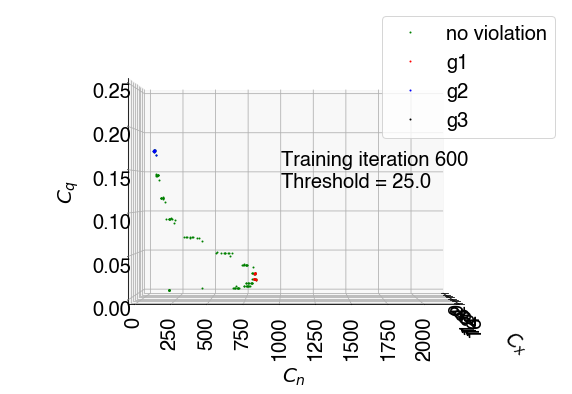

No. of states visited: 130
No. of states where g1 violated: 12
No. of states where g2 violated: 9
No. of states where g3 violated: 0


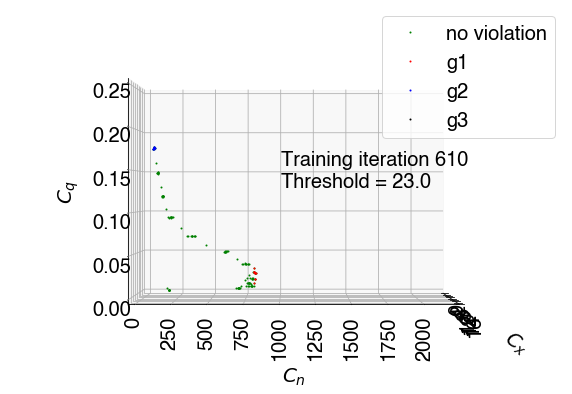

No. of states visited: 130
No. of states where g1 violated: 16
No. of states where g2 violated: 10
No. of states where g3 violated: 0


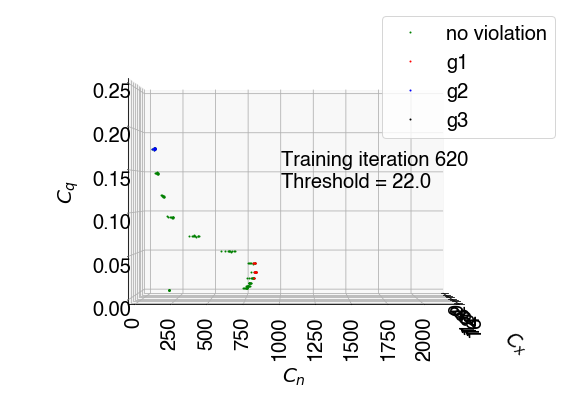

No. of states visited: 130
No. of states where g1 violated: 5
No. of states where g2 violated: 8
No. of states where g3 violated: 0


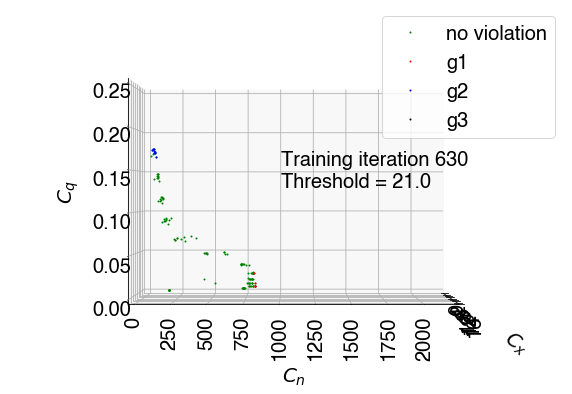

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 10
No. of states where g3 violated: 0


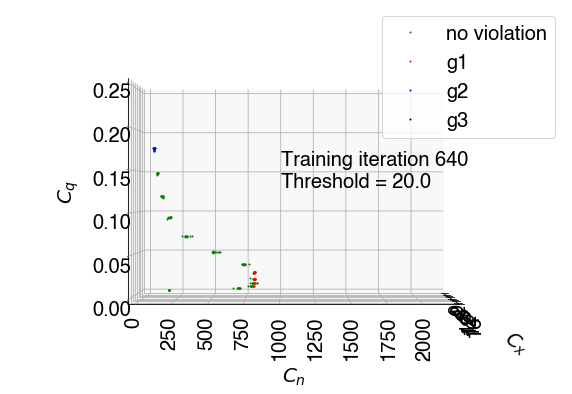

No. of states visited: 130
No. of states where g1 violated: 31
No. of states where g2 violated: 10
No. of states where g3 violated: 0


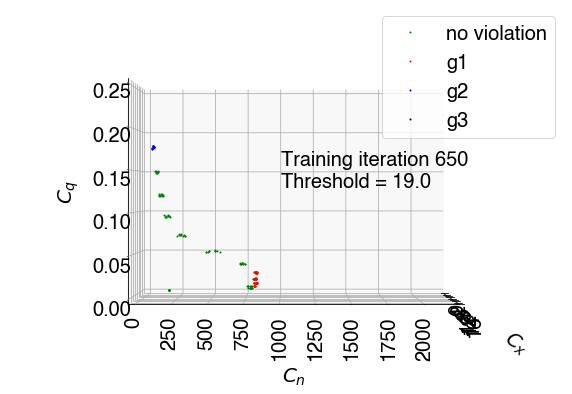

No. of states visited: 130
No. of states where g1 violated: 22
No. of states where g2 violated: 10
No. of states where g3 violated: 0


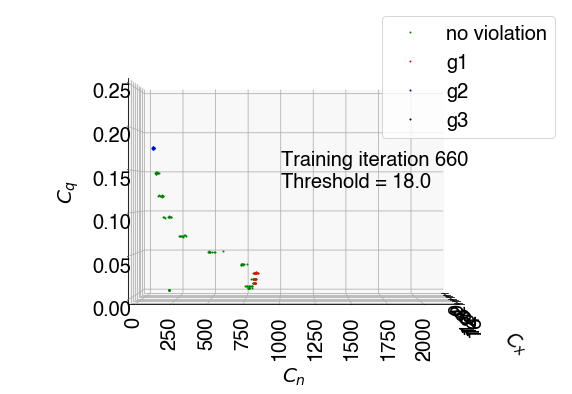

No. of states visited: 130
No. of states where g1 violated: 22
No. of states where g2 violated: 10
No. of states where g3 violated: 0


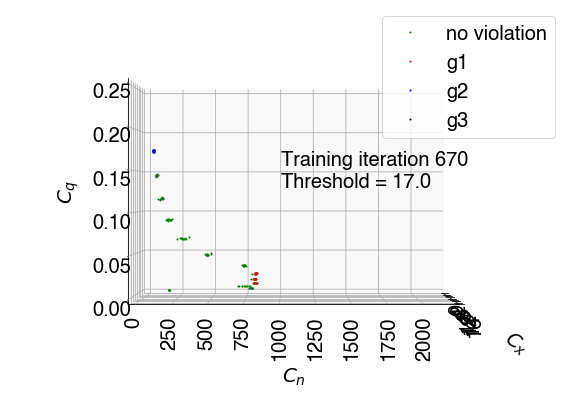

No. of states visited: 130
No. of states where g1 violated: 29
No. of states where g2 violated: 9
No. of states where g3 violated: 0


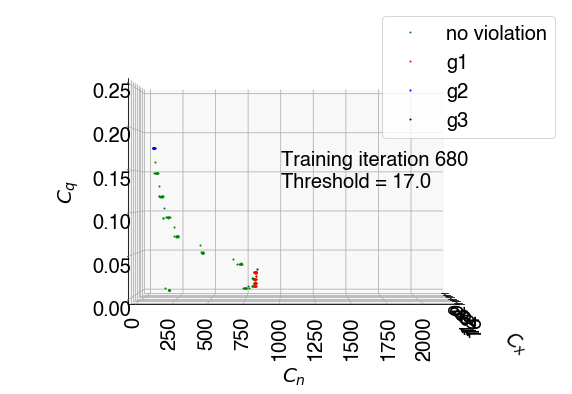

No. of states visited: 130
No. of states where g1 violated: 21
No. of states where g2 violated: 9
No. of states where g3 violated: 0


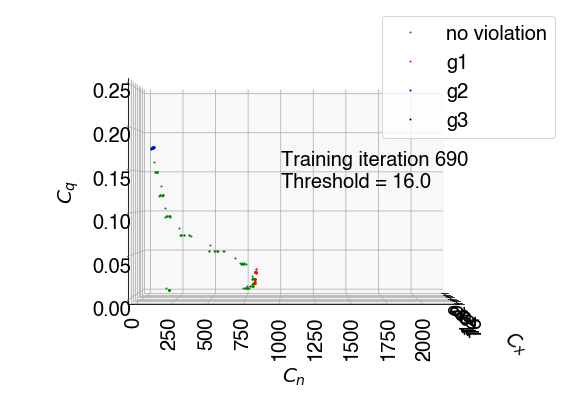

No. of states visited: 130
No. of states where g1 violated: 22
No. of states where g2 violated: 10
No. of states where g3 violated: 0


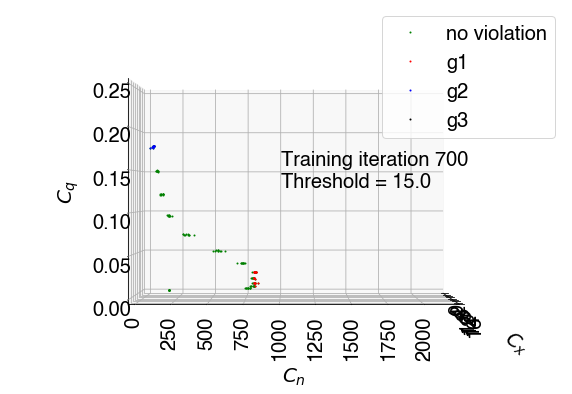

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 10
No. of states where g3 violated: 0


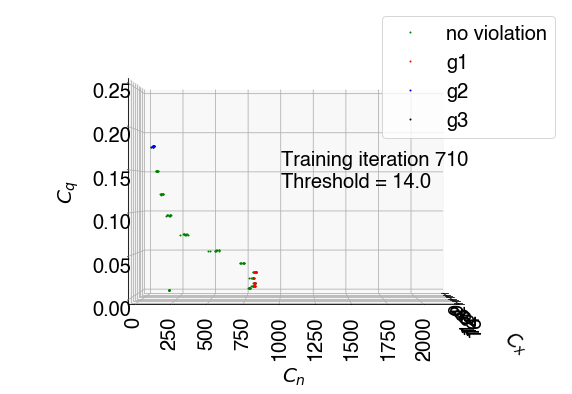

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 10
No. of states where g3 violated: 0


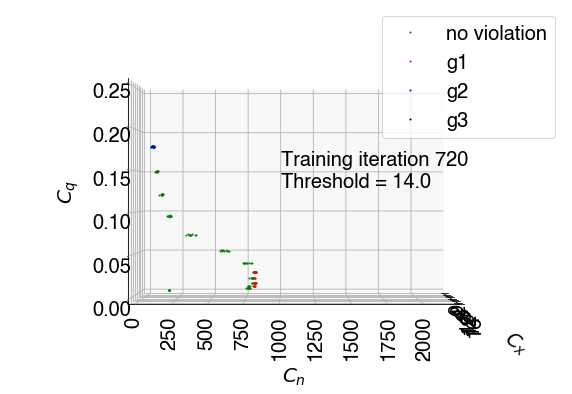

No. of states visited: 130
No. of states where g1 violated: 19
No. of states where g2 violated: 10
No. of states where g3 violated: 0


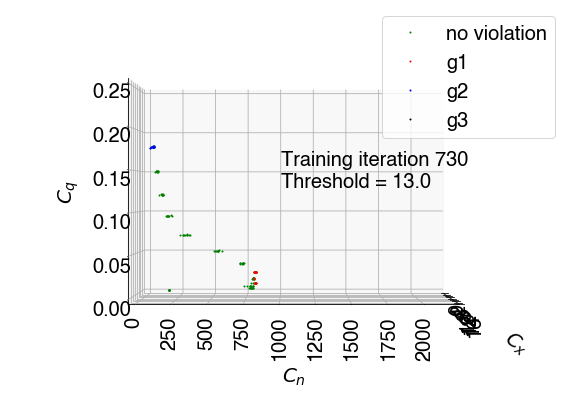

No. of states visited: 130
No. of states where g1 violated: 15
No. of states where g2 violated: 10
No. of states where g3 violated: 0


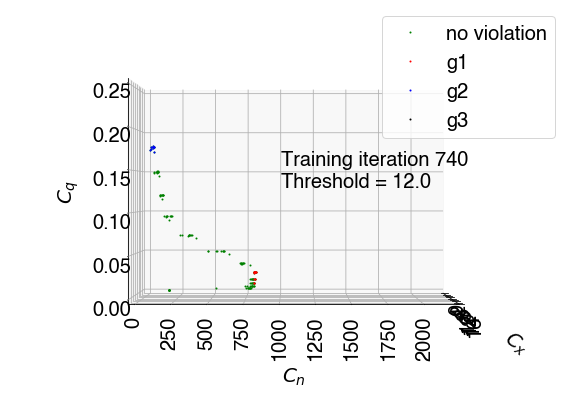

No. of states visited: 130
No. of states where g1 violated: 18
No. of states where g2 violated: 9
No. of states where g3 violated: 0


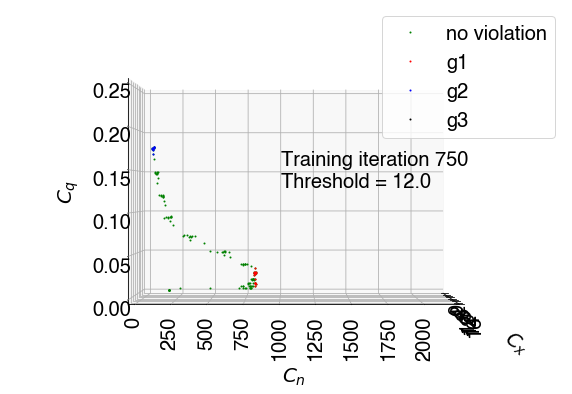

No. of states visited: 130
No. of states where g1 violated: 19
No. of states where g2 violated: 10
No. of states where g3 violated: 0


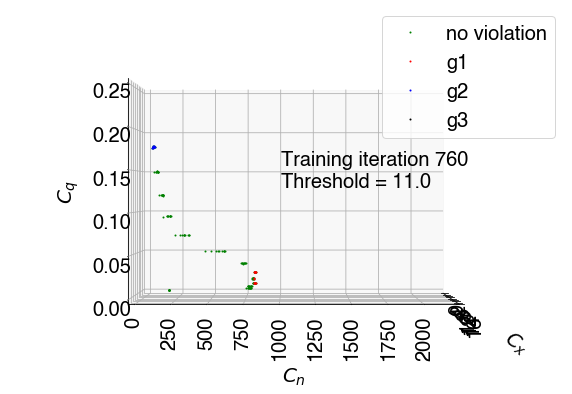

No. of states visited: 130
No. of states where g1 violated: 22
No. of states where g2 violated: 9
No. of states where g3 violated: 0


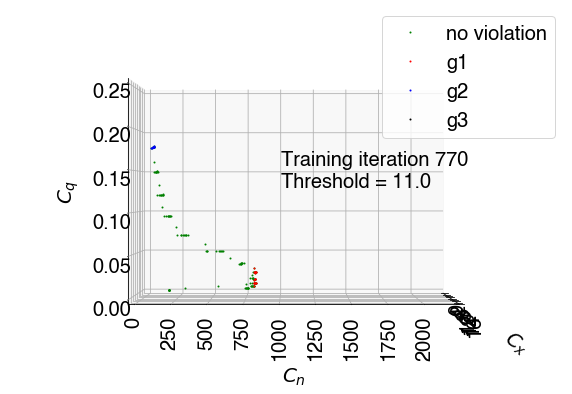

No. of states visited: 130
No. of states where g1 violated: 7
No. of states where g2 violated: 10
No. of states where g3 violated: 0


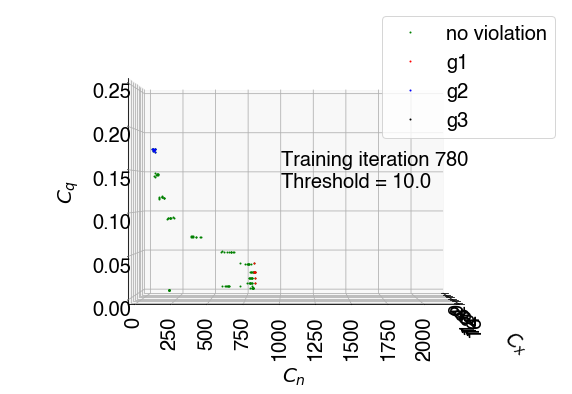

No. of states visited: 130
No. of states where g1 violated: 11
No. of states where g2 violated: 10
No. of states where g3 violated: 0


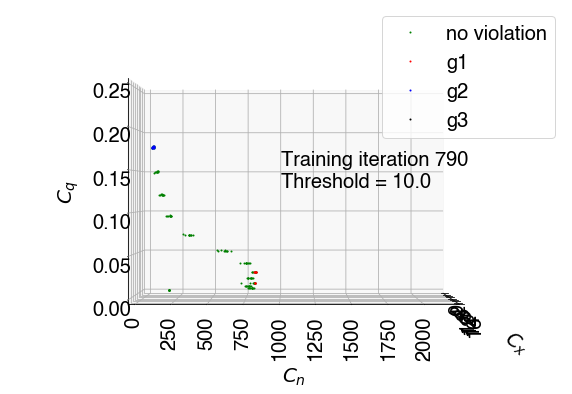

No. of states visited: 130
No. of states where g1 violated: 12
No. of states where g2 violated: 10
No. of states where g3 violated: 0


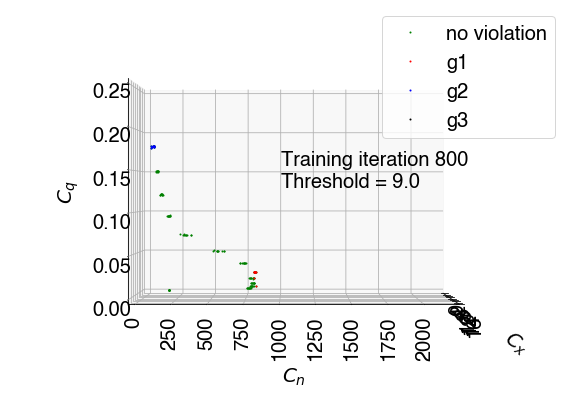

No. of states visited: 130
No. of states where g1 violated: 9
No. of states where g2 violated: 10
No. of states where g3 violated: 0


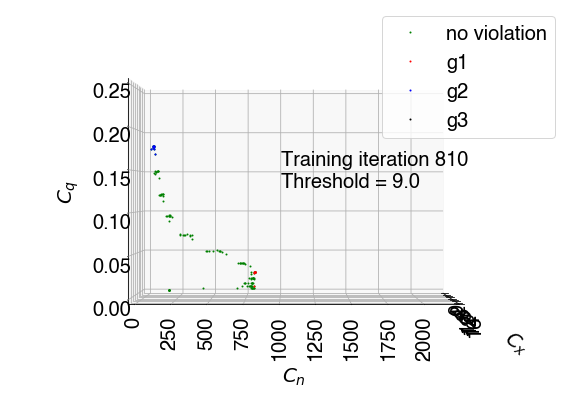

No. of states visited: 130
No. of states where g1 violated: 2
No. of states where g2 violated: 10
No. of states where g3 violated: 0


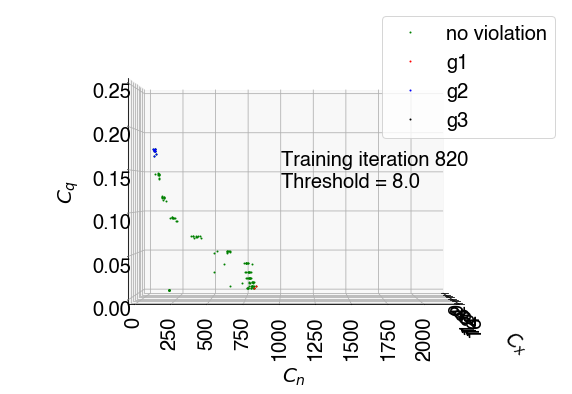

No. of states visited: 130
No. of states where g1 violated: 3
No. of states where g2 violated: 10
No. of states where g3 violated: 0


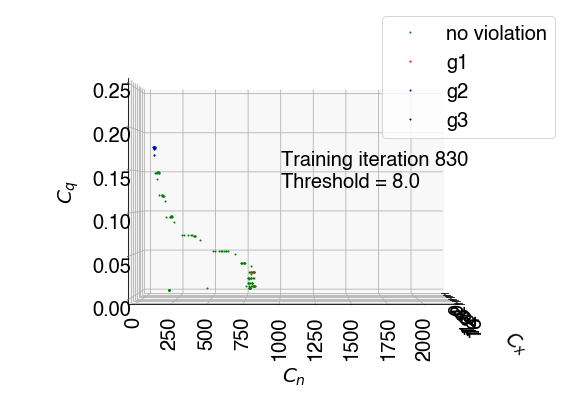

No. of states visited: 130
No. of states where g1 violated: 7
No. of states where g2 violated: 10
No. of states where g3 violated: 0


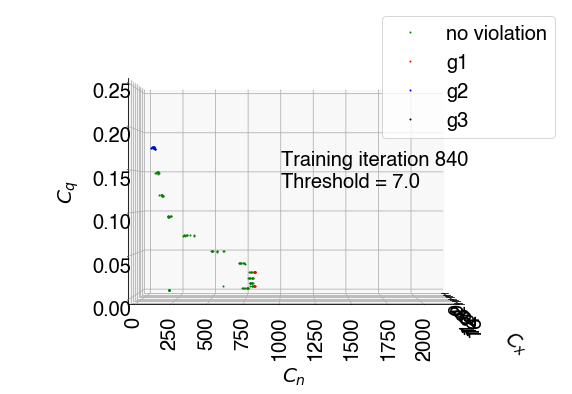

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 10
No. of states where g3 violated: 0


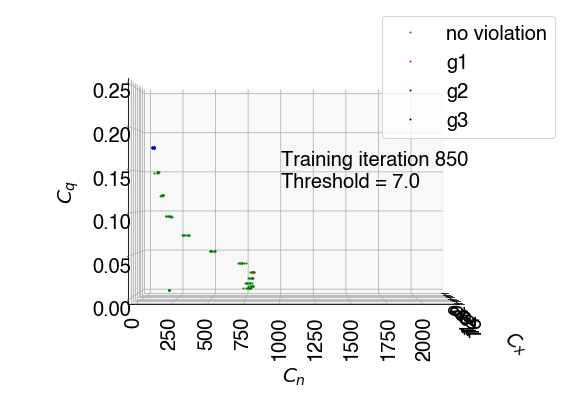

No. of states visited: 130
No. of states where g1 violated: 3
No. of states where g2 violated: 10
No. of states where g3 violated: 0


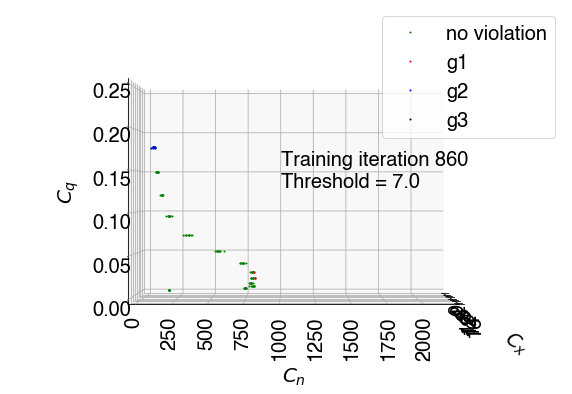

No. of states visited: 130
No. of states where g1 violated: 4
No. of states where g2 violated: 10
No. of states where g3 violated: 0


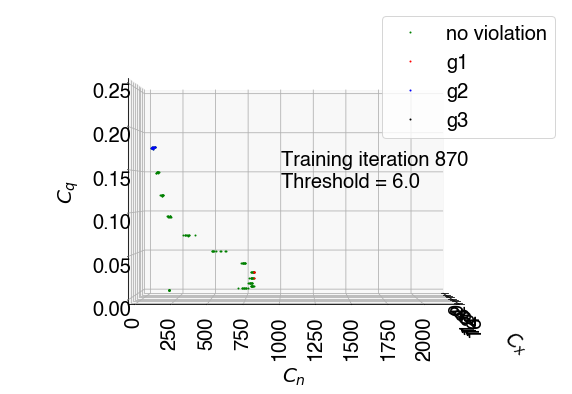

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 10
No. of states where g3 violated: 0


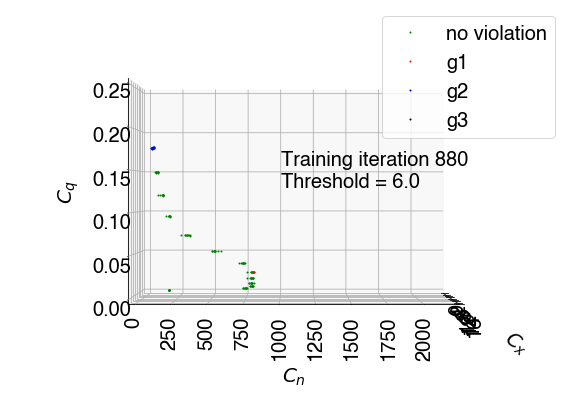

No. of states visited: 130
No. of states where g1 violated: 4
No. of states where g2 violated: 10
No. of states where g3 violated: 0


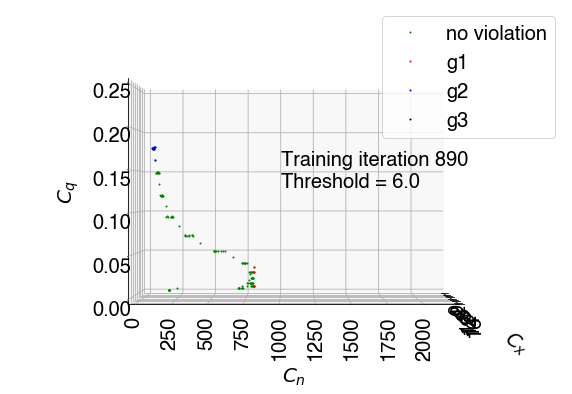

No. of states visited: 130
No. of states where g1 violated: 4
No. of states where g2 violated: 10
No. of states where g3 violated: 0


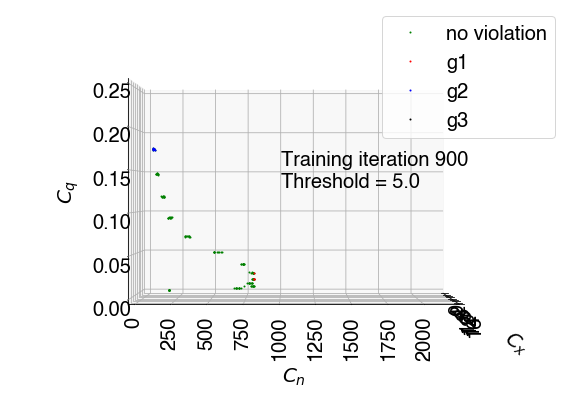

No. of states visited: 130
No. of states where g1 violated: 5
No. of states where g2 violated: 10
No. of states where g3 violated: 0


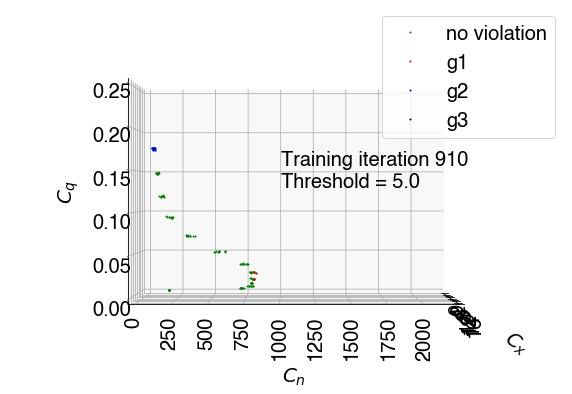

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 10
No. of states where g3 violated: 0


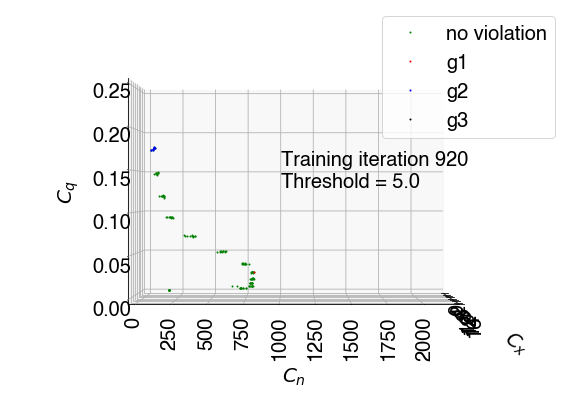

No. of states visited: 130
No. of states where g1 violated: 4
No. of states where g2 violated: 9
No. of states where g3 violated: 0


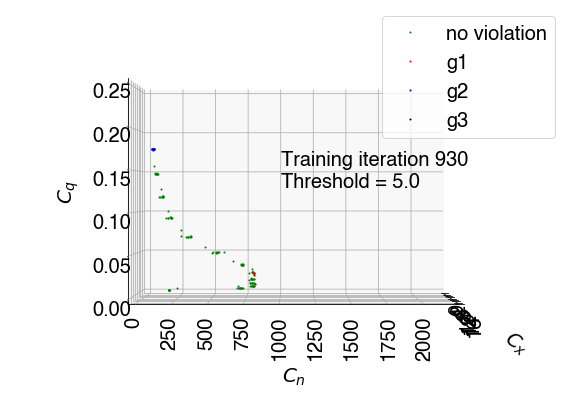

No. of states visited: 130
No. of states where g1 violated: 3
No. of states where g2 violated: 10
No. of states where g3 violated: 0


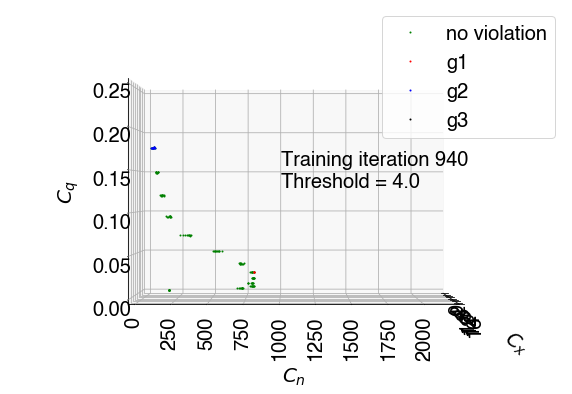

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 8
No. of states where g3 violated: 0


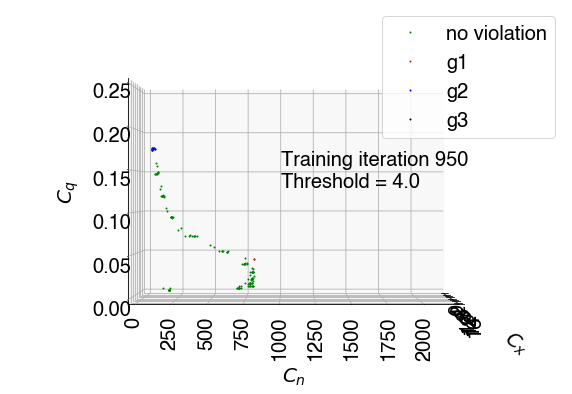

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 10
No. of states where g3 violated: 0


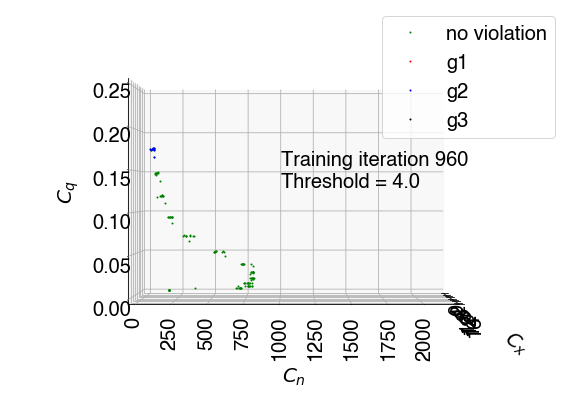

In [15]:
# Plot episode bank
my_images = []  # For saving into gif

for i in range(len(episode_bank)): # i is the index for iteration
    plotting_state_data = []
    
    for j in range(len(episode_bank[i])): # j is the index for different episodes
        episode = episode_bank[i][j]

        data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
        for z in data:
            z = z[:-1]
            plotting_state_data += z  # Add datapoints to training set
    iteration = iteration_list[::10][i] # Record training iteration
    threshold = threshold_list[::10][i] # Record threshold
    # plotting_state_data
    plotting_state_data = pd.DataFrame(plotting_state_data)
    plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
    plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
    plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint

    print('No. of states visited:',len(plotting_state_data))
    print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
    print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
    print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

    Cx_all = plotting_state_data[0]
    Cn_all = plotting_state_data[1]
    Cq_all = plotting_state_data[2]

    Cx_g1 = plotting_state_data_g1_violated[0]
    Cn_g1 = plotting_state_data_g1_violated[1]
    Cq_g1 = plotting_state_data_g1_violated[2]

    Cx_g2 = plotting_state_data_g2_violated[0]
    Cn_g2 = plotting_state_data_g2_violated[1]
    Cq_g2 = plotting_state_data_g2_violated[2]

    Cx_g3 = plotting_state_data_g3_violated[0]
    Cn_g3 = plotting_state_data_g3_violated[1]
    Cq_g3 = plotting_state_data_g3_violated[2]

    
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.xlabel('$C_x$', labelpad=30)
    plt.ylabel('$C_n$', labelpad=50)
    ax.set_zlabel('$C_q$', fontsize=20, labelpad=20)
    plt.legend()
    plt.xticks(rotation=90)
    plt.yticks(rotation=90)
    plt.xlim(0,16)
    plt.ylim(0,2200)
    ax.set_zlim(0, 0.25)
    plt.legend()
    ax.text(0,1000,0.13,'Training iteration {} \nThreshold = {}'.format(iteration, round(threshold,0)),None)
    ax.view_init(0,0)
    plt.show()
        
    # Used to return the plot as an image array 
    # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    my_images.append(image)

# save images as a gif    
# imageio.mimsave('./Data/CS1_training_constrained_960_ep.gif', my_images, fps=10)

## Plot trajectory

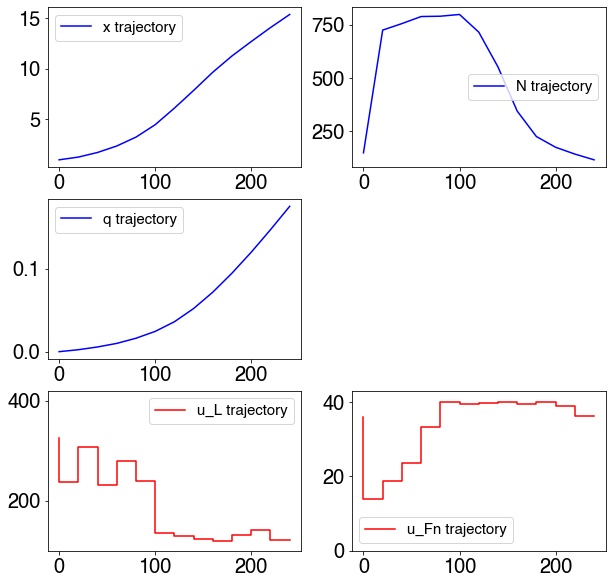

Score: 0.1757134611338481


In [268]:
# Plot 1 episode
episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
                                   threshold = 0)
plot_episode(episode)

<ipython-input-309-de34f3d0430a>:484: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3,2,1)
<ipython-input-309-de34f3d0430a>:492: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3,2,2)
<ipython-input-309-de34f3d0430a>:499: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created 

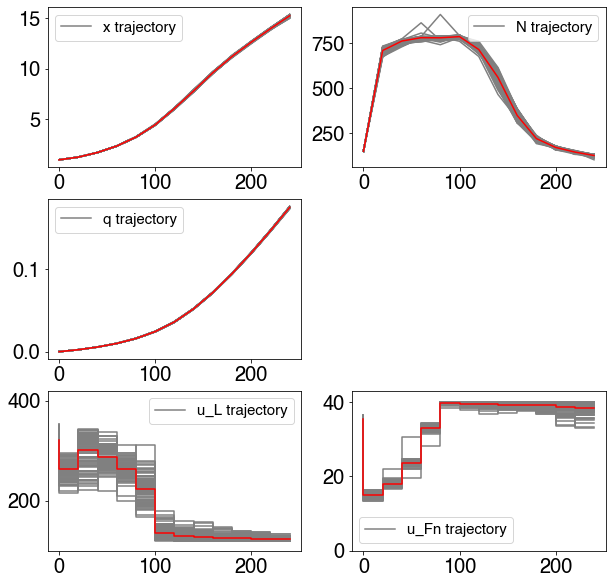

Score: 0.17424059621706403


In [312]:
# Plot average of 100 episodes
episode_pool = []
for i in range(100):
    episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
                                   threshold = 0) 
    episode_pool += [episode]
    
plot_episode_pool(episode_pool)

## Distribution of g1 values

In [332]:
max_g1_list = []
for i in range(1000):
    episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
                                       threshold = 0)
    # WORST violation of this episode
    max_g1 = max(extract_constraint_values_from_episode(episode, N_limit = 800, terminal_N_limit = 150)[1])[0]
    max_g1_list += [max_g1]

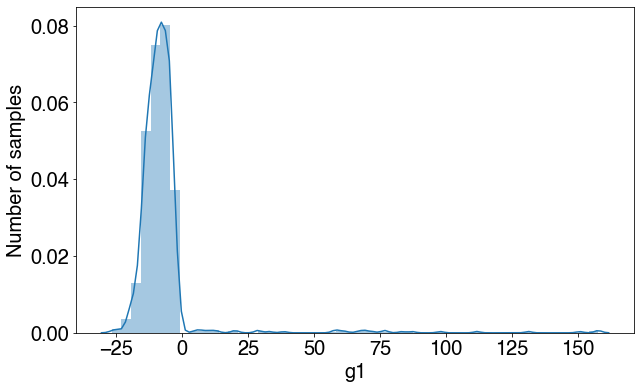

In [333]:
# Plot distribution of g1
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.distplot(max_g1_list)
ax.set(xlabel= 'g1', ylabel = 'Number of samples')
plt.show()